# Table of Contents

###  Context
###  Data Dictionary
###  Problem
###  Libraries
###  Read and Understand Data
###  Data Preprocessing
###  Exploratory Data Analysis

####     .Univariate Analysis
####     .Bivariate and Multivariate Analysis

###  Missing value Detection and Treatment
###  Insights based on EDA
###  Outlier Detection

###  Model Building Bagging

####    .Decision Tree
####    .Bagging classifier
####     ..Random Forest

###  Model Building Boosting

####     .Adaboost
####     .Gradient Boost
####     .XGBoost
####     .Stacking Classifier

###  Conclusion

####   .Business Recommendations & Insights
####   .Misclassfication Analysis

####   Context

####  Sapa.com is one of the leading eCommerce platforms in Nigeria with millions of daily complete transactions. The goods and services on sapa.com cater for both the elite and the masses which makes it the first choice for almost everybody in Nigeria. 
####  Due to the COVID-19 pandemic that struck the entire world in all areas of living, the companies' daily complete transactions have dropped drastically to thousands.

####  The CEO, Mr Echoke in his recent actions to put the platform back to the top of the eCommerce platforms chain in the country has approved the use of Artificial intelligence in User Personality Analysis. 
####  The company has contracted your team consisting of AI professionals with a special focus on recommender system development to build a robust intelligent model capable of recommending products and services to Users based on their activities on sapa.com.

####   Your team lead has assigned you to the building of a model capable of predicting users’ responses to marketing campaigns based on the features in the provided dataset by the sapa.com data engineer. 
####   The next phase of the project is highly dependent on the accuracy of your model as this is the foundation of what will constitute the features of the proposed recommender system development. Good luck!



###  Variable definitions

####   ID: Unique identifier for each User
####   Year_of_Birth: Year of birth
####   Education_Level: The highest level of education attained by the User
####   Marital_Status: Marital status
####   Disposable_Income: Yearly User’s household disposable income
####   No_of_Kids_in_home: total count of children in the user’s home
####   No_of_Teen_in_home: Number of teenagers in the User's household
####   Date_User: Date of User's enrollment with the company
####   Recency: Number of days since User's last purchase
####   Discounted_Purchases: Counts of purchases made by the user using coupons
####   WebPurchases: Counts of purchases made by the user through the company’s website
####   CatalogPurchases: Counts of purchases made by the user using a catalogue
####   StorePurchases: Counts of purchases made by the user directly in stores
####   Amount_on_Wines: Total amount user spent on wine and drinks within the last 3 years
####   Amount_on_Fruits: Total amount user spent on fruity food within the last 3 years
####   Amount_on_MeatProducts: Total amount user spent on meat products and livestock within the last 3 years
####   Amount_on_FishProducts: Total amount user spent on fish alone within the last 3 years
####   Amount_on_SweetProducts: Total amount user spent on sweets and chocolates within the last 3 years
####   Amount_on_GoldProds: Total amount user spent on golden products within the last 3 years
####   WebVisitsMonth: The number of times the user of visits to company’s website within the last 4 weeks
####   Cmp3Accepted: 1: Offer was accepted after the third campaign, 0 otherwise
####   Cmp4Accepted: 1: Offer was accepted after the fourth campaign, 0 otherwise
####   Cmp5Accepted: 1: Offer was accepted after the fifth campaign, 0 otherwise
####   Cmp1Accepted: 1: Offer was accepted after the first campaign, 0 otherwise
####   Cmp2Accepted: 1: Offer was accepted after the second campaign, 0 otherwise
####    Any_Complain: 1 if the user has a compliant history with the platform in the last 3 years, 0 otherwise
####    User_Response: 1: indicates the acceptance of offer and 0 otherwise


### . Libraries

In [4]:
### Install Lightgbm

###! pip install lightgbm --user
###! pip install optuna --
###! pip install catboost --user
####! pip install daal4py --user

### IMPORT: ------------------------------------
import scipy.stats as stats 
import pandas as pd
import numpy as np
import os

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
import statsmodels.api as sm
import datasist as ds
import optuna
from optuna import Trial





from sklearn.model_selection import train_test_split, StratifiedKFold # Sklearn package's randomized data splitting function

from sklearn import metrics

from sklearn.ensemble import BaggingClassifier,RandomForestClassifier,StackingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier

from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn import tree
from sklearn.linear_model import LogisticRegression

# Libtune to tune model, get different metric scores

from sklearn.metrics import  classification_report, accuracy_score, precision_score, recall_score,f1_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay,plot_confusion_matrix #to plot confusion matric

pd.set_option('display.float_format', lambda x: '%.3f' % x)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth',None)
pd.set_option('display.max_columns', None)
# To supress numerical display in scientific notations
pd.set_option('display.float_format', lambda x: '%.5f' % x) 
warnings.filterwarnings('ignore') # To supress warnings
 # set the background for the graphs
plt.style.use('ggplot')
# For pandas 

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm
C:\ProgramData\Anaconda3\lib\site-packages\distributed\utils.py:133: RuntimeWarning: Couldn't detect a suitable IP address for reaching '8.8.8.8', defaulting to '127.0.0.1': [WinError 10051] A socket operation was attempted to an unreachable network
  RuntimeWarning,


In [5]:
class get_data(object):
    
    # Constructor
    def __init__(self,  data: str):
        self.data = data
        
        
        ##  a function to check if data is a valid url
    def is_url(self):
        """
        This function takes in  a url of this format 'https://www.example.com/tayo.csv or tayo.xsl'
        and returns the dataframe of  the data.
        """
        
        valid= validators.url(self.data)
        if valid==True:
            
            self.df= {}
            
                
              
            real_data= self.data.rsplit('/', -1)[-1]
                
            ext= real_data.rsplit('.', -1)[-1]
            
            ## check if it is a csv file    
            if ext == 'csv':
                ## read the csv file
                Data= pd.read_csv(self.data, sep= ";")
                
                ## create a dataframe
                self.df= pd.DataFrame(Data, columns= Data.columns.tolist())
                return self.df 
            elif ext == 'xsl':
                Data= pd.read_xsl(r'self.data', sep =";")
                self.df= pd.DataFrame(Data, columns= Data.columns.tolist())
                return self.df
                    
            else:
                print('Invalid Format')
                
                
        else:
            print('URL is Invalid')
                
                
    def is_file(self): 
        """
        This function takes in a path of this form 'C://Users//Document//tayo.csv or tayo.xsl' and it
        returns a dataframe of the data
        """
            
        path= self.data
        it_exists= os.path.exists(path)
        if it_exists== True:
            
            self.df= {}
                
            ext= path.rsplit('.', -1)[-1]
                
            if ext == 'csv':
                Data= pd.read_csv(path)
                self.df=pd.DataFrame(Data, columns=Data.columns.to_list())
                return self.df
                    
            elif ext == 'xsl':
                Data= pd.read_xsl(path, sep= ";")
                self.df= pd.DataFrame(Data, columns= Data.columns.tolist())
                return self.df
                    
            else:
                print('Invalid Format')
                    
        else:
            print('This File or Directory does not exist')
            
    def get_df(self):
        return self.df

In [6]:
data=get_data('C:\\Users\\MAINGATE\\Desktop\\AWS_ml\\Train.csv')
train=data.is_file()
train

,ID,Year_of_Birth,Education_Level,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Date_Customer,Recency,Discounted_Purchases,WebPurchases,CatalogPurchases,StorePurchases,Amount_on_Wines,Amount_on_Fruits,Amount_on_MeatProducts,Amount_on_FishProducts,Amount_on_SweetProducts,Amount_on_GoldProds,WebVisitsMonth,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain,Response
0,ID_4A9AR6FQ,1955,Graduation,Divorced,77504.40000,1,1,22-06-2014,56,2,1,1,4,71,3,16,0,6,20,3,0,0,0,0,0,0,0
1,ID_X28T3VEK,1958,Graduation,Together,56784.00000,0,1,01-08-2013,17,6,5,1,8,205,22,111,50,15,19,6,0,0,0,0,0,0,0
2,ID_AWXARH57,1962,Graduation,Single,103714.80000,0,0,21-11-2013,17,0,7,4,7,469,31,873,29,18,37,2,0,0,0,1,0,0,1
3,ID_FQVZHE81,1979,2n Cycle,Single,46311.60000,1,0,13-09-2013,49,3,4,1,3,56,15,49,17,24,24,8,0,0,0,0,0,0,0
4,ID_QVLWGPRN,1959,Graduation,Married,87486.00000,0,0,21-01-2014,59,1,3,7,9,412,117,445,181,165,203,1,0,0,0,1,0,0,0
5,ID_3S3HRGH6,1960,Master,Married,41090.40000,0,1,23-03-2014,32,1,0,0,3,13,5,4,0,0,1,5,0,0,0,0,0,0,0
6,ID_KJQ9B2LE,1953,Graduation,Single,86673.60000,0,0,27-11-2012,94,1,6,7,8,636,31,491,30,14,56,3,0,0,0,0,0,0,0
7,ID_6O0NBZXD,1974,Graduation,Together,88711.20000,0,0,02-03-2013,61,1,6,5,12,632,94,597,159,91,15,3,0,0,0,0,0,0,0
8,ID_M3QFT8WO,1966,Graduation,Together,35606.40000,1,1,12-03-2013,13,1,0,0,3,14,4,3,0,4,8,6,0,0,0,0,0,0,0
9,ID_745JV5PY,1975,Graduation,Married,41305.20000,1,0,01-07-2013,88,1,1,0,2,8,6,7,6,2,9,7,0,0,0,0,0,0,0


In [7]:
data2=get_data('C:\\Users\\MAINGATE\\Desktop\\AWS_ml\\Test.csv')
test=data2.is_file()
test

,ID,Year_of_Birth,Education_Level,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Date_Customer,Recency,Discounted_Purchases,WebPurchases,CatalogPurchases,StorePurchases,Amount_on_Wines,Amount_on_Fruits,Amount_on_MeatProducts,Amount_on_FishProducts,Amount_on_SweetProducts,Amount_on_GoldProds,WebVisitsMonth,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain
0,ID_ZPMABNVX,1954,Graduation,Single,48556.80000,0,1,11-01-2013,85,6,8,2,8,429,20,118,7,23,41,8,0,0,0,0,0,0
1,ID_WFE91NAA,1961,Graduation,Widow,57499.20000,0,1,22-11-2012,79,5,7,4,6,510,3,26,0,0,75,6,0,1,0,0,0,0
2,ID_JV11RBRK,1973,Basic,Married,17025.60000,0,0,28-02-2013,47,1,2,0,4,7,10,11,16,12,27,6,0,0,0,0,0,0
3,ID_6B7SVKY9,1970,Graduation,Together,91983.60000,0,0,16-08-2013,98,1,4,7,11,741,66,946,219,189,126,2,0,0,1,1,0,0
4,ID_GOVUZ545,1959,Graduation,Together,78235.20000,0,2,25-07-2013,41,2,7,6,11,748,22,181,12,0,200,5,1,0,0,0,0,0
5,ID_A3SFW973,1959,Graduation,Together,64772.40000,0,1,08-06-2013,28,5,5,5,12,625,19,165,0,24,82,5,0,0,0,0,0,0
6,ID_HERGG0GD,1961,Master,Together,87735.60000,0,0,26-12-2013,93,1,3,4,7,746,22,154,50,9,28,2,0,0,0,0,0,0
7,ID_S36UV4BY,1958,Graduation,Married,85335.60000,0,1,17-12-2013,102,4,6,7,9,500,36,255,11,33,8,4,0,0,0,0,0,0
8,ID_9E10P1ZZ,1984,Graduation,Single,26577.60000,0,0,13-04-2014,23,1,1,0,3,20,8,14,0,4,11,7,0,0,0,0,0,0
9,ID_2840OCS5,1983,Graduation,Married,26937.60000,1,0,26-02-2014,93,3,2,1,3,8,4,8,23,2,18,3,0,0,0,0,0,0


In [8]:
data3=get_data('C:\\Users\\MAINGATE\\Desktop\\AWS_ml\\SampleSubmission.csv')
sub=data3.is_file()
sub

,ID,Response
0,ID_ZPMABNVX,nan
1,ID_WFE91NAA,nan
2,ID_JV11RBRK,nan
3,ID_6B7SVKY9,nan
4,ID_GOVUZ545,nan
5,ID_A3SFW973,nan
6,ID_HERGG0GD,nan
7,ID_S36UV4BY,nan
8,ID_9E10P1ZZ,nan
9,ID_2840OCS5,nan


In [9]:
class Data_Report(get_data):
    """A function to get the shape, features, type and missing values  of the dataset """
    
    def Report(self, new_data):
        ## we initialize a new object new_data
        self.__new_data= new_data
        
        self.data1= self.__new_data
        
        ### print the shape of the dataset
        
        print(f"There are {self.data1.shape[0]} rows and {self.data1.shape[1]} columns in the dataset")
        
        ### print the names of the column in the dataset
        print("\nFeatures :\n\n", self.data1.columns.tolist())
        
        ### print the number of missing values present in the dataset
        print("\nMissing values :\n\n", self.data1.isnull().sum().sort_values(ascending=False))
        
        ### print the percentage of missing values present in the dataset
        print("\n The percentage of Missing values  are :\n\n", round(self.data1.isna().sum()/self.data1.isna().count()*100, 3).sort_values(ascending=False))
        
        print("\n The data type of the dataset :\n\n", self.data1.info())
        
        return self.data1.describe().T

In [10]:
report= Data_Report(train)
report.Report(train)

There are 1568 rows and 27 columns in the dataset

Features :

 ['ID', 'Year_of_Birth', 'Education_Level', 'Marital_Status', 'Disposable_Income', 'No_of_Kids_in_home', 'No_of_Teen_in_home', 'Date_Customer', 'Recency', 'Discounted_Purchases', 'WebPurchases', 'CatalogPurchases', 'StorePurchases', 'Amount_on_Wines', 'Amount_on_Fruits', 'Amount_on_MeatProducts', 'Amount_on_FishProducts', 'Amount_on_SweetProducts', 'Amount_on_GoldProds', 'WebVisitsMonth', 'Cmp3Accepted', 'Cmp4Accepted', 'Cmp5Accepted', 'Cmp1Accepted', 'Cmp2Accepted', 'Any_Complain', 'Response']

Missing values :

 Disposable_Income          16
Response                    0
StorePurchases              0
Year_of_Birth               0
Education_Level             0
Marital_Status              0
No_of_Kids_in_home          0
No_of_Teen_in_home          0
Date_Customer               0
Recency                     0
Discounted_Purchases        0
WebPurchases                0
CatalogPurchases            0
Amount_on_Wines            

,count,mean,std,min,25%,50%,75%,max
Year_of_Birth,1568.00000,1970.07334,11.92078,1900.00000,1960.00000,1971.00000,1979.00000,1997.00000
Disposable_Income,1552.00000,62381.18660,32089.16956,2076.00000,41612.40000,60964.20000,81493.20000,799999.20000
No_of_Kids_in_home,1568.00000,0.46046,0.54036,0.00000,0.00000,0.00000,1.00000,2.00000
No_of_Teen_in_home,1568.00000,0.49745,0.54415,0.00000,0.00000,0.00000,1.00000,2.00000
Recency,1568.00000,55.40880,28.78804,7.00000,31.00000,56.00000,80.00000,106.00000
Discounted_Purchases,1568.00000,2.29273,1.93754,0.00000,1.00000,2.00000,3.00000,15.00000
WebPurchases,1568.00000,4.00128,2.77375,0.00000,2.00000,3.00000,6.00000,27.00000
CatalogPurchases,1568.00000,2.66582,3.04349,0.00000,0.00000,2.00000,4.00000,28.00000
StorePurchases,1568.00000,5.70344,3.26055,0.00000,3.00000,5.00000,8.00000,13.00000
Amount_on_Wines,1568.00000,303.19005,340.14140,5.00000,27.00000,167.00000,499.50000,1498.00000


In [11]:
test_report=Data_Report(test)
test_report.Report(test)

There are 672 rows and 26 columns in the dataset

Features :

 ['ID', 'Year_of_Birth', 'Education_Level', 'Marital_Status', 'Disposable_Income', 'No_of_Kids_in_home', 'No_of_Teen_in_home', 'Date_Customer', 'Recency', 'Discounted_Purchases', 'WebPurchases', 'CatalogPurchases', 'StorePurchases', 'Amount_on_Wines', 'Amount_on_Fruits', 'Amount_on_MeatProducts', 'Amount_on_FishProducts', 'Amount_on_SweetProducts', 'Amount_on_GoldProds', 'WebVisitsMonth', 'Cmp3Accepted', 'Cmp4Accepted', 'Cmp5Accepted', 'Cmp1Accepted', 'Cmp2Accepted', 'Any_Complain']

Missing values :

 Disposable_Income          8
Any_Complain               0
Cmp2Accepted               0
Year_of_Birth              0
Education_Level            0
Marital_Status             0
No_of_Kids_in_home         0
No_of_Teen_in_home         0
Date_Customer              0
Recency                    0
Discounted_Purchases       0
WebPurchases               0
CatalogPurchases           0
StorePurchases             0
Amount_on_Wines         

,count,mean,std,min,25%,50%,75%,max
Year_of_Birth,672.00000,1969.18155,12.11642,1894.00000,1960.00000,1970.00000,1978.00000,1997.00000
Disposable_Income,664.00000,63434.17048,25276.58548,5313.60000,44219.70000,64007.40000,83466.30000,194876.40000
No_of_Kids_in_home,672.00000,0.40625,0.53226,0.00000,0.00000,0.00000,1.00000,2.00000
No_of_Teen_in_home,672.00000,0.52679,0.54529,0.00000,0.00000,1.00000,1.00000,2.00000
Recency,672.00000,57.74405,29.32189,7.00000,33.00000,58.00000,84.00000,106.00000
Discounted_Purchases,672.00000,2.40030,1.91912,0.00000,1.00000,2.00000,3.00000,15.00000
WebPurchases,672.00000,4.27976,2.78258,0.00000,2.00000,4.00000,6.00000,25.00000
CatalogPurchases,672.00000,2.65327,2.62290,0.00000,1.00000,2.00000,4.00000,11.00000
StorePurchases,672.00000,5.99256,3.22180,0.00000,3.00000,5.00000,8.00000,13.00000
Amount_on_Wines,672.00000,322.34226,328.03743,5.00000,35.75000,209.50000,514.75000,1483.00000


In [12]:
class Cat_Cols(get_data):
    def describe_cat_cols(self, new_data):
        
        ## initialize an object new_data that takes in a dataframe
        self.__new_data= new_data
        
        self.data1= self.__new_data
        
       ## store categorical variable in cat_cols
        cat_cols= ['Education_Level', 'Marital_Status', 'Cmp3Accepted','Cmp4Accepted',
                   'Cmp5Accepted', 'Cmp2Accepted', 'Cmp1Accepted','Any_Complain'
                   ]
        
        for i in cat_cols:
            print('The Unique values in ', i, 'are:\n\n')
            print(self.data1[i].value_counts())
            print('*'*35)

In [13]:
test_get_cat=Cat_Cols(test)
test_get_cat.describe_cat_cols(test)

The Unique values in  Education_Level are:


Graduation    325
PhD           146
Master        124
2n Cycle       61
Basic          16
Name: Education_Level, dtype: int64
***********************************
The Unique values in  Marital_Status are:


Married     249
Together    171
Single      151
Divorced     73
Widow        27
Absurd        1
Name: Marital_Status, dtype: int64
***********************************
The Unique values in  Cmp3Accepted are:


0    623
1     49
Name: Cmp3Accepted, dtype: int64
***********************************
The Unique values in  Cmp4Accepted are:


0    619
1     53
Name: Cmp4Accepted, dtype: int64
***********************************
The Unique values in  Cmp5Accepted are:


0    635
1     37
Name: Cmp5Accepted, dtype: int64
***********************************
The Unique values in  Cmp2Accepted are:


0    662
1     10
Name: Cmp2Accepted, dtype: int64
***********************************
The Unique values in  Cmp1Accepted are:


0    629
1     43
Name: 

In [14]:
get_cat=Cat_Cols(train)
get_cat.describe_cat_cols(train)

The Unique values in  Education_Level are:


Graduation    802
PhD           340
Master        246
2n Cycle      142
Basic          38
Name: Education_Level, dtype: int64
***********************************
The Unique values in  Marital_Status are:


Married     615
Together    409
Single      329
Divorced    159
Widow        50
Alone         3
YOLO          2
Absurd        1
Name: Marital_Status, dtype: int64
***********************************
The Unique values in  Cmp3Accepted are:


0    1454
1     114
Name: Cmp3Accepted, dtype: int64
***********************************
The Unique values in  Cmp4Accepted are:


0    1454
1     114
Name: Cmp4Accepted, dtype: int64
***********************************
The Unique values in  Cmp5Accepted are:


0    1442
1     126
Name: Cmp5Accepted, dtype: int64
***********************************
The Unique values in  Cmp2Accepted are:


0    1548
1      20
Name: Cmp2Accepted, dtype: int64
***********************************
The Unique values in  Cmp1

In [15]:
train.describe().T

,count,mean,std,min,25%,50%,75%,max
Year_of_Birth,1568.00000,1970.07334,11.92078,1900.00000,1960.00000,1971.00000,1979.00000,1997.00000
Disposable_Income,1552.00000,62381.18660,32089.16956,2076.00000,41612.40000,60964.20000,81493.20000,799999.20000
No_of_Kids_in_home,1568.00000,0.46046,0.54036,0.00000,0.00000,0.00000,1.00000,2.00000
No_of_Teen_in_home,1568.00000,0.49745,0.54415,0.00000,0.00000,0.00000,1.00000,2.00000
Recency,1568.00000,55.40880,28.78804,7.00000,31.00000,56.00000,80.00000,106.00000
Discounted_Purchases,1568.00000,2.29273,1.93754,0.00000,1.00000,2.00000,3.00000,15.00000
WebPurchases,1568.00000,4.00128,2.77375,0.00000,2.00000,3.00000,6.00000,27.00000
CatalogPurchases,1568.00000,2.66582,3.04349,0.00000,0.00000,2.00000,4.00000,28.00000
StorePurchases,1568.00000,5.70344,3.26055,0.00000,3.00000,5.00000,8.00000,13.00000
Amount_on_Wines,1568.00000,303.19005,340.14140,5.00000,27.00000,167.00000,499.50000,1498.00000


In [16]:
test.describe().T

,count,mean,std,min,25%,50%,75%,max
Year_of_Birth,672.00000,1969.18155,12.11642,1894.00000,1960.00000,1970.00000,1978.00000,1997.00000
Disposable_Income,664.00000,63434.17048,25276.58548,5313.60000,44219.70000,64007.40000,83466.30000,194876.40000
No_of_Kids_in_home,672.00000,0.40625,0.53226,0.00000,0.00000,0.00000,1.00000,2.00000
No_of_Teen_in_home,672.00000,0.52679,0.54529,0.00000,0.00000,1.00000,1.00000,2.00000
Recency,672.00000,57.74405,29.32189,7.00000,33.00000,58.00000,84.00000,106.00000
Discounted_Purchases,672.00000,2.40030,1.91912,0.00000,1.00000,2.00000,3.00000,15.00000
WebPurchases,672.00000,4.27976,2.78258,0.00000,2.00000,4.00000,6.00000,25.00000
CatalogPurchases,672.00000,2.65327,2.62290,0.00000,1.00000,2.00000,4.00000,11.00000
StorePurchases,672.00000,5.99256,3.22180,0.00000,3.00000,5.00000,8.00000,13.00000
Amount_on_Wines,672.00000,322.34226,328.03743,5.00000,35.75000,209.50000,514.75000,1483.00000


In [17]:
train['Year_of_Birth'].unique()

array([1955, 1958, 1962, 1979, 1959, 1960, 1953, 1974, 1966, 1975, 1989,
       1956, 1976, 1970, 1965, 1977, 1952, 1981, 1951, 1995, 1973, 1972,
       1971, 1988, 1984, 1990, 1986, 1969, 1900, 1967, 1987, 1992, 1968,
       1963, 1957, 1944, 1961, 1950, 1954, 1982, 1991, 1947, 1985, 1978,
       1980, 1964, 1983, 1949, 1993, 1948, 1994, 1946, 1942, 1945, 1996,
       1997], dtype=int64)

In [18]:
test['Year_of_Birth'].unique()

array([1954, 1961, 1973, 1970, 1959, 1958, 1984, 1983, 1952, 1980, 1969,
       1953, 1956, 1971, 1968, 1978, 1976, 1963, 1975, 1982, 1962, 1960,
       1955, 1964, 1945, 1972, 1986, 1987, 1947, 1985, 1989, 1967, 1965,
       1992, 1957, 1974, 1977, 1981, 1991, 1966, 1993, 1979, 1951, 1950,
       1988, 1901, 1997, 1990, 1949, 1948, 1894, 1994, 1941, 1944],
      dtype=int64)

### Observations

##### The minimum no of days of Recency is 7 days and max days is 106 for both test and train data
##### The minimum amount spent on wines is 5 and max amount spent is 1498 for tainind data, while that of test is 5 and 1483 respectively
##### The minimum amount spent on Meat is 0 while max amount spent is  1725 for training dataset, whereas 1 and 981 was the  min and max amount spent on meat respectively in the test data
##### The minimum Disposable income is 2076 while the max income ia 799999.2 for train data, while 5313.6 and 194876.4 is the min and max disposable income in the test data.
##### The minimum year of birth is 1900 and max is 1997 for train data, While that of test data are 1894 and 1997 respectively

### Data Preprocessing

In [19]:
### save the ID column of Submission in ID
### Drop the ID column

In [20]:
ID= sub['ID']

In [21]:
train.drop(['ID'], axis=1, inplace=True)

In [22]:
test.drop(['ID'], axis=1, inplace=True)

In [23]:
train.head()

,Year_of_Birth,Education_Level,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Date_Customer,Recency,Discounted_Purchases,WebPurchases,CatalogPurchases,StorePurchases,Amount_on_Wines,Amount_on_Fruits,Amount_on_MeatProducts,Amount_on_FishProducts,Amount_on_SweetProducts,Amount_on_GoldProds,WebVisitsMonth,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain,Response
0,1955,Graduation,Divorced,77504.40000,1,1,22-06-2014,56,2,1,1,4,71,3,16,0,6,20,3,0,0,0,0,0,0,0
1,1958,Graduation,Together,56784.00000,0,1,01-08-2013,17,6,5,1,8,205,22,111,50,15,19,6,0,0,0,0,0,0,0
2,1962,Graduation,Single,103714.80000,0,0,21-11-2013,17,0,7,4,7,469,31,873,29,18,37,2,0,0,0,1,0,0,1
3,1979,2n Cycle,Single,46311.60000,1,0,13-09-2013,49,3,4,1,3,56,15,49,17,24,24,8,0,0,0,0,0,0,0
4,1959,Graduation,Married,87486.00000,0,0,21-01-2014,59,1,3,7,9,412,117,445,181,165,203,1,0,0,0,1,0,0,0


In [24]:
### store categorical variable in cat_cols
cat_cols= ['Education_Level', 'Marital_Status', 'Cmp3Accepted','Cmp4Accepted',
           'Cmp5Accepted', 'Cmp2Accepted', 'Cmp1Accepted','Any_Complain', 'Response'
          ]

###  Observations

### A large percentage of our customers have their 1st degree(i.e they are graduate)
###  'Alone', 'Yolo' and 'Absurd' seems to be the  odd one in the Marital_Status group,  but with some EDA we would know if it is odd or not
### Most of the previous advert done by the company have not really encourage customers to purchase the product
### Most customers have little or no complaint

#### Year of Birth might actually play a major role if a customer might  actually accept the advert
#### a customer whoose year of birth is between 1940's to 1950's might get captivated by the advert  because sapa has product such as Gold, or maybe the content of the advert has a little touch of history
#### customers born in 60's to the 70's might get excited by the advert , maybe because  the undertone of King Sunny Ade's music being played in the advert
#### customers born in their late 70's to 80's might like the advert because their teens at home needs a product being advertised and so on
#### so in order to understand how year of birth plays a vital role we would group them into bins

In [25]:
train['Year_of_Birth_Bin'] =pd.cut(train['Year_of_Birth'], bins=[1899,1940,1950,1960,1970,1980,1990,2000], labels=['1899-1940','1940-1950','1951-1960','1961-1970', '1971-1980','1981-1990','1991-2000'])

In [26]:
### we would apply similar method on the test data like we did on  train  data

In [27]:
test['Year_of_Birth_Bin'] =pd.cut(test['Year_of_Birth'], bins=[1890,1940,1950,1960,1970,1980,1990,2000], labels=['1890-1940','1940-1950','1951-1960','1961-1970', '1971-1980','1981-1990','1991-2000'])

In [28]:
train['Year_of_Birth_Bin'].value_counts()

1971-1980    526
1961-1970    344
1951-1960    311
1981-1990    255
1940-1950     81
1991-2000     50
1899-1940      1
Name: Year_of_Birth_Bin, dtype: int64

In [29]:
test['Year_of_Birth_Bin'].value_counts()

1971-1980    214
1961-1970    162
1951-1960    149
1981-1990    108
1940-1950     26
1991-2000     11
1890-1940      2
Name: Year_of_Birth_Bin, dtype: int64

#### Recency can also play a huge part in determining whether the customer will accept the offer
#### for better insights on Recency we can as well group it into bins

In [30]:
train['Recency'].unique()

array([ 56,  17,  49,  59,  32,  94,  61,  13,  88,  57, 102,  47,  14,
        37,  91,  72, 100,  28,  80,  77,  64,  10,  97,  62,  36,  63,
        40,  24,  69,  78,  71,  54,  31,  39,  85, 106,  75,  11,   8,
        33,  41,  43,  26,  30, 103,  22,  44,  27,  53,  68,  46,  66,
        42,  93,  15, 105,  79,  18,  65,  98,   9,  20, 101,  76,  16,
        86,  38,  58,  60,  35,  45,  90,  89,  21,  92,  96,  87,  50,
        55,  25,   7,  99,  67,  23,  84,  12,  52,  19,  81,  34,  29,
        70,  73,  95,  74,  48,  83,  82, 104,  51], dtype=int64)

In [31]:
train['RecencyBin']= pd.cut(train['Recency'], bins=[0,20,40,60,80,110], labels=['0-19', '20-39', '40-59', '60-79','80-110'])

train['RecencyBin'].value_counts()

80-110    384
60-79     327
20-39     306
40-59     304
0-19      247
Name: RecencyBin, dtype: int64

In [32]:
test['RecencyBin']= pd.cut(test['Recency'], bins=[0,20,40,60,80,110], labels=['0-19', '20-39', '40-59', '60-79','80-110'])

test['RecencyBin'].value_counts()

80-110    193
20-39     138
40-59     130
60-79     122
0-19       89
Name: RecencyBin, dtype: int64

#### The Disposable_Income of a customer would definitely have a telling effect if a customer would accept the offer or not
#### a customer who has a higher pay net might accept the offer
#### while a customer with a lower disposable income might not consider the offer 
#### but this depends on the EDA carried out on the dataset

In [33]:
train['Disposable_Income'].describe()

count     1552.00000
mean     62381.18660
std      32089.16956
min       2076.00000
25%      41612.40000
50%      60964.20000
75%      81493.20000
max     799999.20000
Name: Disposable_Income, dtype: float64

In [34]:
train['Disposable_Income_Bin']= pd.cut(train['Disposable_Income'], bins= [2000,12000,28000, 38000,48000, 60000,80000,100000,150000,800000], 
                                            labels=['<12000','<28000','<38000', '<48000', '<68000','<80000','<100000','<150000','<800000'])

In [35]:
test['Disposable_Income_Bin']= pd.cut(test['Disposable_Income'], bins= [2000,12000,28000, 38000,48000, 60000,80000,100000,150000,800000], 
                                            labels=['<12000','<28000','<38000', '<48000', '<68000','<80000','<100000','<150000','<800000'])

In [36]:
train['Disposable_Income_Bin'].value_counts()

<80000     380
<100000    325
<68000     228
<48000     220
<38000     164
<28000     125
<150000     81
<12000      22
<800000      7
Name: Disposable_Income_Bin, dtype: int64

In [37]:
test['Disposable_Income_Bin'].value_counts()

<80000     167
<100000    157
<68000     100
<48000      79
<38000      67
<28000      48
<150000     38
<12000       7
<800000      1
Name: Disposable_Income_Bin, dtype: int64

In [38]:
train['WebVisitsMonth'].value_counts()

7     281
6     250
8     232
5     184
2     150
3     147
4     146
1     101
9      59
0       9
20      3
19      2
17      1
14      1
13      1
10      1
Name: WebVisitsMonth, dtype: int64

In [39]:
test['WebVisitsMonth'].value_counts()

7     112
8     110
5      97
6      90
4      72
3      58
2      52
1      52
9      24
10      2
0       2
14      1
Name: WebVisitsMonth, dtype: int64

In [40]:
train['WebVisitsMonth_Bin']= pd.cut(train['WebVisitsMonth'], bins=[-1,5,10,15,20], labels=['-1-4','5-10', '10-15','15-20'])
train['WebVisitsMonth_Bin'].value_counts()

5-10     823
-1-4     737
15-20      6
10-15      2
Name: WebVisitsMonth_Bin, dtype: int64

In [41]:
test['WebVisitsMonth_Bin']= pd.cut(test['WebVisitsMonth'], bins=[-1,5,10,15,20], labels=['-1-4','5-10', '10-15','15-20'])
test['WebVisitsMonth_Bin'].value_counts()

5-10     338
-1-4     333
10-15      1
15-20      0
Name: WebVisitsMonth_Bin, dtype: int64

In [42]:
### Note the reason why we have -1-4 is because 0-4 would not cover 0 , since it would start counting from 1

In [43]:
### join both train data and  test data with datasist
all_data, ntrain, ntest =ds.structdata.join_train_and_test(train,test)

#### we could also get some info from adding the total count purchase
#### a user might accept the offer if he had a higher count of purchases or it  might not be the case 
#### but with EDA we could provide better insights

In [44]:
Purchases_list= [feature for feature in all_data.columns.to_list() if 'Purchases' in feature]
Purchases_list

['Discounted_Purchases', 'WebPurchases', 'CatalogPurchases', 'StorePurchases']

In [45]:
Amount_list= [feature for feature in all_data.columns.to_list() if 'Amount_on' in feature]

In [46]:
all_data['Amount_spent']=all_data[Amount_list].sum(axis=1)

In [47]:
Purchases_list= [feature for feature in all_data.columns.to_list() if 'Purchases' in feature]
Purchases_list

['Discounted_Purchases', 'WebPurchases', 'CatalogPurchases', 'StorePurchases']

In [48]:
all_data['Total_Purchases']= all_data[Purchases_list].sum(axis=1)

In [49]:
Total_No_of_Children_in_home_list= ['No_of_Kids_in_home', 'No_of_Teen_in_home']
all_data['Total_No_of_Children_in_home']= all_data[Total_No_of_Children_in_home_list].sum(axis=1)

In [50]:
all_data.head()

,Year_of_Birth,Education_Level,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Date_Customer,Recency,Discounted_Purchases,WebPurchases,CatalogPurchases,StorePurchases,Amount_on_Wines,Amount_on_Fruits,Amount_on_MeatProducts,Amount_on_FishProducts,Amount_on_SweetProducts,Amount_on_GoldProds,WebVisitsMonth,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain,Response,Year_of_Birth_Bin,RecencyBin,Disposable_Income_Bin,WebVisitsMonth_Bin,Amount_spent,Total_Purchases,Total_No_of_Children_in_home
0,1955,Graduation,Divorced,77504.40000,1,1,22-06-2014,56,2,1,1,4,71,3,16,0,6,20,3,0,0,0,0,0,0,0.00000,1951-1960,40-59,<80000,-1-4,116,8,2
1,1958,Graduation,Together,56784.00000,0,1,01-08-2013,17,6,5,1,8,205,22,111,50,15,19,6,0,0,0,0,0,0,0.00000,1951-1960,0-19,<68000,5-10,422,20,1
2,1962,Graduation,Single,103714.80000,0,0,21-11-2013,17,0,7,4,7,469,31,873,29,18,37,2,0,0,0,1,0,0,1.00000,1961-1970,0-19,<150000,-1-4,1457,18,0
3,1979,2n Cycle,Single,46311.60000,1,0,13-09-2013,49,3,4,1,3,56,15,49,17,24,24,8,0,0,0,0,0,0,0.00000,1971-1980,40-59,<48000,5-10,185,11,1
4,1959,Graduation,Married,87486.00000,0,0,21-01-2014,59,1,3,7,9,412,117,445,181,165,203,1,0,0,0,1,0,0,0.00000,1951-1960,40-59,<100000,-1-4,1523,20,0


In [51]:
all_data.isnull().sum()

Year_of_Birth                     0
Education_Level                   0
Marital_Status                    0
Disposable_Income                24
No_of_Kids_in_home                0
No_of_Teen_in_home                0
Date_Customer                     0
Recency                           0
Discounted_Purchases              0
WebPurchases                      0
CatalogPurchases                  0
StorePurchases                    0
Amount_on_Wines                   0
Amount_on_Fruits                  0
Amount_on_MeatProducts            0
Amount_on_FishProducts            0
Amount_on_SweetProducts           0
Amount_on_GoldProds               0
WebVisitsMonth                    0
Cmp3Accepted                      0
Cmp4Accepted                      0
Cmp5Accepted                      0
Cmp1Accepted                      0
Cmp2Accepted                      0
Any_Complain                      0
Response                        672
Year_of_Birth_Bin                 0
RecencyBin                  

In [52]:
new_cat_list= ['Marital_Status', 'Education_Level', 'Any_Complain', 'Cmp3Accepted', 'Cmp5Accepted', 'Cmp4Accepted', 'Cmp2Accepted', 'Cmp1Accepted', 'Response']

In [53]:
### converting the data type of the categorical dataset to category

all_data[new_cat_list]= all_data[new_cat_list].astype('category')

all_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 33 columns):
 #   Column                        Non-Null Count  Dtype   
---  ------                        --------------  -----   
 0   Year_of_Birth                 2240 non-null   int64   
 1   Education_Level               2240 non-null   category
 2   Marital_Status                2240 non-null   category
 3   Disposable_Income             2216 non-null   float64 
 4   No_of_Kids_in_home            2240 non-null   int64   
 5   No_of_Teen_in_home            2240 non-null   int64   
 6   Date_Customer                 2240 non-null   object  
 7   Recency                       2240 non-null   int64   
 8   Discounted_Purchases          2240 non-null   int64   
 9   WebPurchases                  2240 non-null   int64   
 10  CatalogPurchases              2240 non-null   int64   
 11  StorePurchases                2240 non-null   int64   
 12  Amount_on_Wines               2240 non-null   in

In [54]:
all_data.describe(include=['category']).T

,count,unique,top,freq
Education_Level,2240,5,Graduation,1127
Marital_Status,2240,8,Married,864
Cmp3Accepted,2240,2,0,2077
Cmp4Accepted,2240,2,0,2073
Cmp5Accepted,2240,2,0,2077
Cmp1Accepted,2240,2,0,2096
Cmp2Accepted,2240,2,0,2210
Any_Complain,2240,2,0,2219
Response,1568.00000,2.00000,0.00000,1329.00000
RecencyBin,2240,5,80-110,577


#### date could also play a major role in the determining who accepts the marketing campaign
#### the particular year /month a user might have registered, it  might be the year/month a promo was rolled out for new customers
#### or maybe the customers who registered at the begining of the month might want to stock up foodstuffs at home, that was why they registered in the first place and that is why they might accept the marketing campaign


In [55]:
### convert the data type of date_customer from object to datetime
all_data['Date_Customer']= all_data['Date_Customer'].apply(pd.to_datetime)

In [56]:
max(all_data.Date_Customer)

Timestamp('2014-12-06 00:00:00')

In [57]:
## get the year from the Date_Customer column
all_data['year'] = all_data.Date_Customer.dt.year

###  get the month from the date_customer column
all_data['month']= all_data.Date_Customer.dt.month

### get the day from the date_customer column
all_data['day'] =all_data.Date_Customer.dt.day

### we know this data was gotten during the pandemic, therefore our today 2021-1-1
today= pd.to_datetime('2021-1-1')

### get the duration of days months from the day they registered to the present day
all_data['duration_days'] =np.log((today - all_data['Date_Customer']).dt.days)
all_data['duration_months']= np.log((today - all_data.Date_Customer)/np.timedelta64(1, 'M'))
all_data['duration_months']= all_data['duration_months'].astype(int)


all_data['month_end']= all_data.Date_Customer.dt.is_month_end.astype(int)

all_data['start_of_month']= all_data.Date_Customer.dt.is_month_start.astype(int)






In [58]:
all_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 40 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   Year_of_Birth                 2240 non-null   int64         
 1   Education_Level               2240 non-null   category      
 2   Marital_Status                2240 non-null   category      
 3   Disposable_Income             2216 non-null   float64       
 4   No_of_Kids_in_home            2240 non-null   int64         
 5   No_of_Teen_in_home            2240 non-null   int64         
 6   Date_Customer                 2240 non-null   datetime64[ns]
 7   Recency                       2240 non-null   int64         
 8   Discounted_Purchases          2240 non-null   int64         
 9   WebPurchases                  2240 non-null   int64         
 10  CatalogPurchases              2240 non-null   int64         
 11  StorePurchases                

In [81]:
all_data.head()

,Year_of_Birth,Education_Level,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Date_Customer,Recency,Discounted_Purchases,WebPurchases,CatalogPurchases,StorePurchases,Amount_on_Wines,Amount_on_Fruits,Amount_on_MeatProducts,Amount_on_FishProducts,Amount_on_SweetProducts,Amount_on_GoldProds,WebVisitsMonth,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain,Response,Year_of_Birth_Bin,RecencyBin,Disposable_Income_Bin,WebVisitsMonth_Bin,Amount_spent,Total_Purchases,Total_No_of_Children_in_home,year,month,day,duration_days,duration_months,month_end,start_of_month
0,1955,Graduation,Divorced,77504.40000,1,1,2014-06-22,56,2,1,1,4,71,3,16,0,6,20,3,0,0,0,0,0,0,0.00000,1951-1960,40-59,<80000,-1-4,116,8,2,2014,6,22,7.77695,4,0,0
1,1958,Graduation,Together,56784.00000,0,1,2013-01-08,17,6,5,1,8,205,22,111,50,15,19,6,0,0,0,0,0,0,0.00000,1951-1960,0-19,<68000,5-10,422,20,1,2013,1,8,7.97763,4,0,0
2,1962,Graduation,Single,103714.80000,0,0,2013-11-21,17,0,7,4,7,469,31,873,29,18,37,2,0,0,0,1,0,0,1.00000,1961-1970,0-19,<150000,-1-4,1457,18,0,2013,11,21,7.86250,4,0,0
3,1979,2n Cycle,Single,46311.60000,1,0,2013-09-13,49,3,4,1,3,56,15,49,17,24,24,8,0,0,0,0,0,0,0.00000,1971-1980,40-59,<48000,5-10,185,11,1,2013,9,13,7.88871,4,0,0
4,1959,Graduation,Married,87486.00000,0,0,2014-01-21,59,1,3,7,9,412,117,445,181,165,203,1,0,0,0,1,0,0,0.00000,1951-1960,40-59,<100000,-1-4,1523,20,0,2014,1,21,7.83874,4,0,0


In [59]:
### lets create a function that finds the chi square value and the cramer's v value
def find_relationship(feature, target):
    Indep_Response_ct=pd.crosstab(index=all_data[feature], columns=all_data[target])
    Indep_Response_ct
    (chi2, p, dof,_)= stats.chi2_contingency([Indep_Response_ct.iloc[0].values, Indep_Response_ct.iloc[1].values])
    
    print("chi2_1 :", chi2)
    print("p-value :", p)
    print("Degree of freedom :", dof)
    print("Cramer V:", np.sqrt(chi2/(all_data.shape[0])))

In [62]:
find_relationship('Response', 'Disposable_Income')

chi2_1 : 1479.6855127642125
p-value : 0.17593974848031665
Degree of freedom : 1430
Cramer V: 0.8127569683656244


In [62]:
### let's seperate the train and test data from the all_data dataset
Train=all_data.iloc[0:ntrain]
Test =all_data.iloc[ntrain:]

## ..Exploratory Data Analysis

### .Univariate Analysis

In [63]:
### let's create a function that would carry out Exploratory Data Analysis using various plots for a continuous data


def dist_box(data):
    ### this function plots a combineg univariate graph for numerical data
    ### in order to check the spread of central tendency, dispersion and outliers of the data
    Name= data.name.upper()
    fig, (ax_box, ax_dis)= plt.subplots(nrows=2, sharex=True, gridspec_kw={'height_ratios':(0.3, 0.9)}, figsize=(9,5))
    mean= data.mean()
    median= data.median()
    mode= data.mode().to_list()[0]
    sns.set_theme(style ='white')
    fig.suptitle('Spread Of Data For '+ Name , fontsize=14, fontweight='bold' )
    sns.boxplot(x=data, showmeans=True, orient ='h', color='green', ax= ax_box)
    ## remove the x axis from the boxplot
    ax_box.set(xlabel ='')
    ## for better visualisation. this will set the background to white
    sns.despine(top=True, right=True, left=True) # to remove the sideline from the graph
    sns.distplot(data, kde=True, color='blue', ax=ax_dis)
    ax_dis.axvline(mean, color='black', linestyle='--',linewidth=2)
    ax_dis.axvline(median, color='g', linestyle='-',linewidth=2)
    ax_dis.axvline(mode, color='y', linestyle='-',linewidth=2)
    plt.legend({'Mean':mean,'Median':median,'Mode':mode})

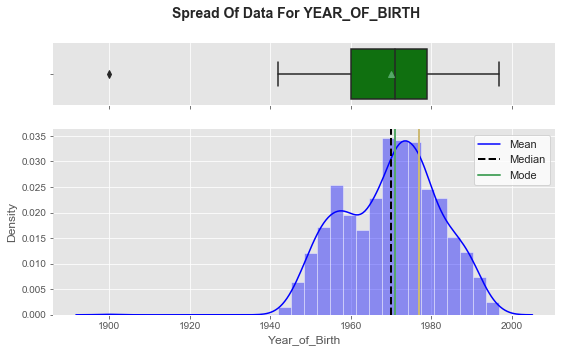

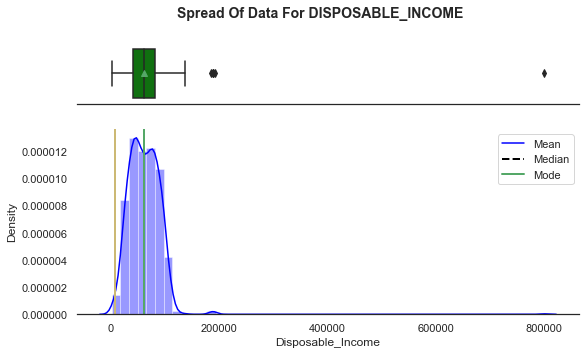

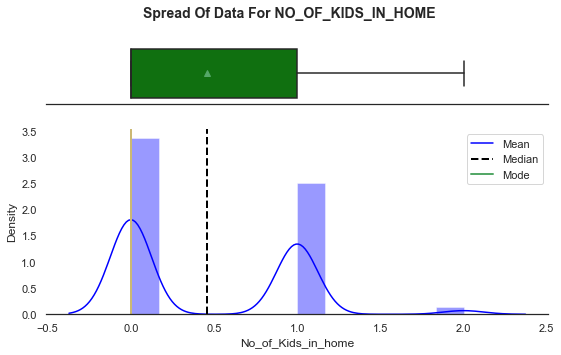

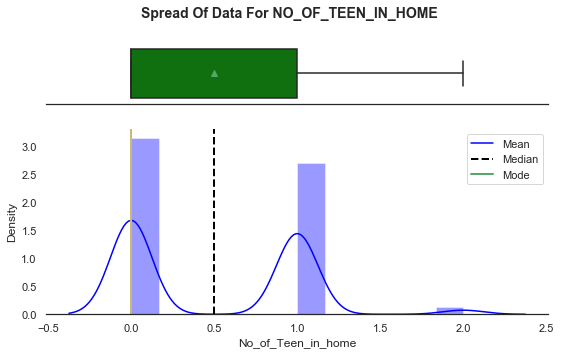

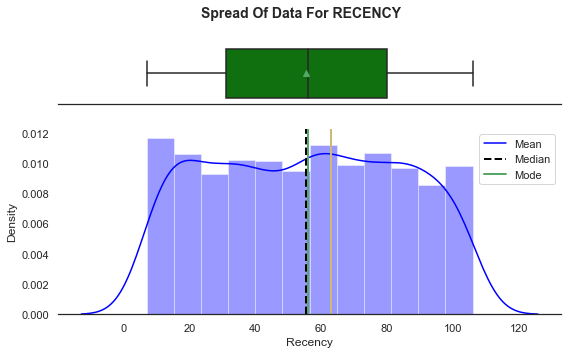

...

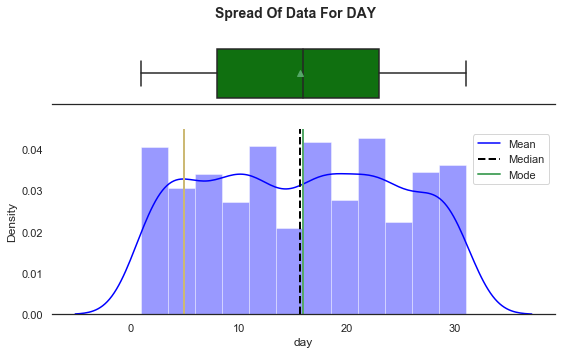

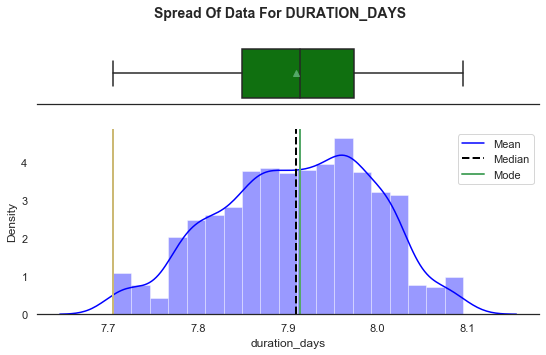

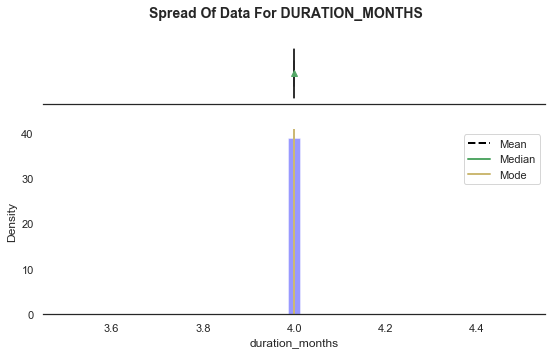

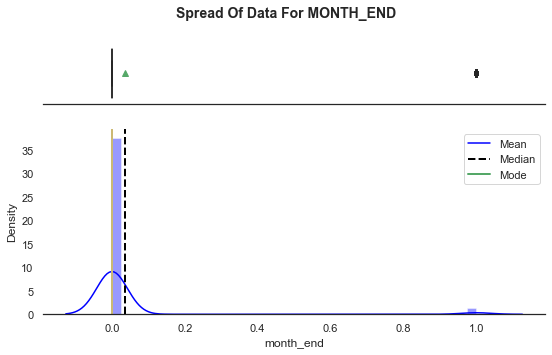

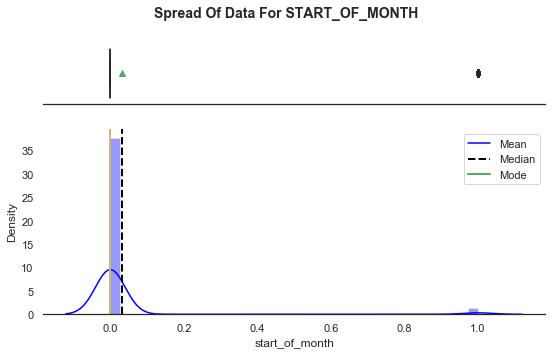

In [64]:
### select all qualitative columns to check the spread

list_col= Train.select_dtypes(include='number').columns.to_list()
for i in range(len(list_col)):
    dist_box(Train[list_col[i]])

### Observations

####  Year_Of_Birth is normally distributed and it has an outlier of 1900
####  Disposable_Income is also normally distributed and it has an outlier of 200000 and ~800000
####  DiscountedPurchases is rightly skewed it has a mean of 2.5 and the outliers present is from 6-15
####  WebPurchases is also rightly skewed its mean is ~4 and the outliers are from 22-28
####  StorePurchase is rightly skewed with a mean of ~6 with no outliers.
####  catalogpurchase is rightly skewed , a mean of ~3 and outliers from 12-28
####  Amount_on_Wines is rightly skewed with outliers from 1000-1500
####  Amount_on_Fruits is rightlly skewed with outliers from 80-200
####  Amount_on_FishProducts has a mean of ~40 amd outliers from 120-280
####  Amount_on_MeatProducts is rightly skewed with outliers from 500-1800
####  Amount_on_SweetProducts has a mean of of ~30 with outliers from  100-270
####  Amount_on_GoldProds has outliers ranging from 120-380
####  WebVisitsMonth has outliers from 13-20
####  Total_Purchases is rightly skewed with  a mean of 15 and outliers ranging from 40-45






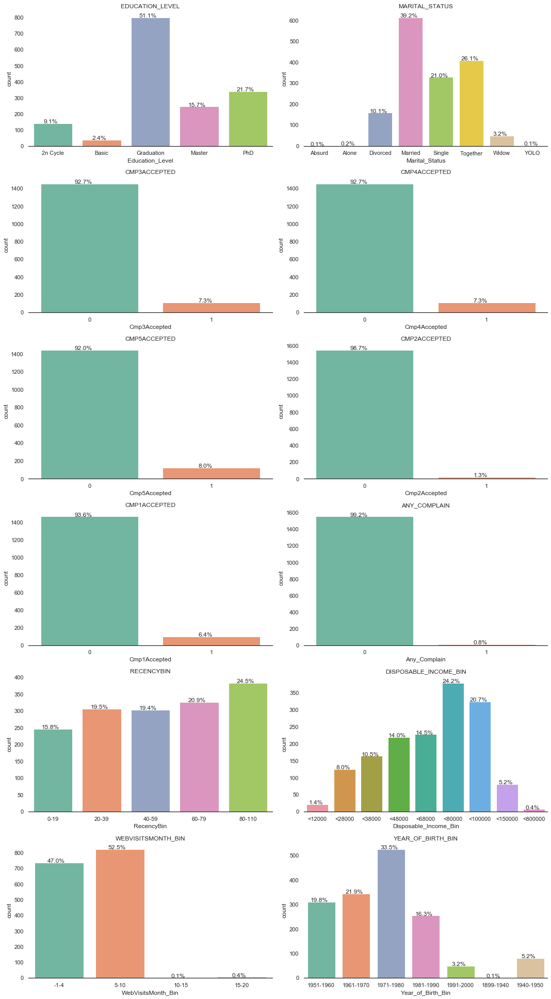

In [65]:
### Making a plot for the categorical datasets
def Countplot(list, data):
    
    plt.figure(figsize=(15,40))

    sns.set_theme(style='white')

    for i, variable in enumerate(list):
        
                   plt.subplot(9,2,i+1)
                   ## to set the palette
                   sns.set_palette('Set2')
                   ax =sns.countplot(x=data[variable], data=data)
                   sns.despine(top=True, right=True, left=True) # to remove side line from graph
                   for p in ax.patches:
                        
                       percentage= '{:.1f}%'.format(100*p.get_height()/len(data[variable]))
                       x= p.get_x() + p.get_width() / 2 -0.05
                       y= p.get_y() + p.get_height()
                       plt.annotate(percentage, (x,y), ha='center')
                       plt.tight_layout()
                       plt.title(list[i].upper())
                        
cols = ['Education_Level', 'Marital_Status', 'Cmp3Accepted', 'Cmp4Accepted', 
        'Cmp5Accepted', 'Cmp2Accepted', 'Cmp1Accepted', 'Any_Complain',
        'RecencyBin', 'Disposable_Income_Bin', 'WebVisitsMonth_Bin', 'Year_of_Birth_Bin'] 

Countplot(cols, Train)


### Observations
####  About ~88% of customers have a Bachelor's Degree or higher
####  Most of our customers are eitheir Married, single or together  (i.e they are couples but not married)
####  Most of our customers web visits in a month ranges from 0-10
####  Most of the company marketing strategy has failed to produce the required result as the customers even after repeated marketing campaigns refused the offer
####  Most of our customers last purchases ranges from 40-110 days and that's alot,  something has to be done about it.
####  ~75% of our custoners Year_of_Birth ranges from the 1950s'-1980s'.
####  Most of our customers disposable income ranges from 38000-100000.
####  Most of our customers did not complain at all and the offer was not accepted . This is a cause of concern as it might be that our feedback channel is ineffective, and something has to be done about it.


### ..Bivariate Analysis and MultiVariate Analysis

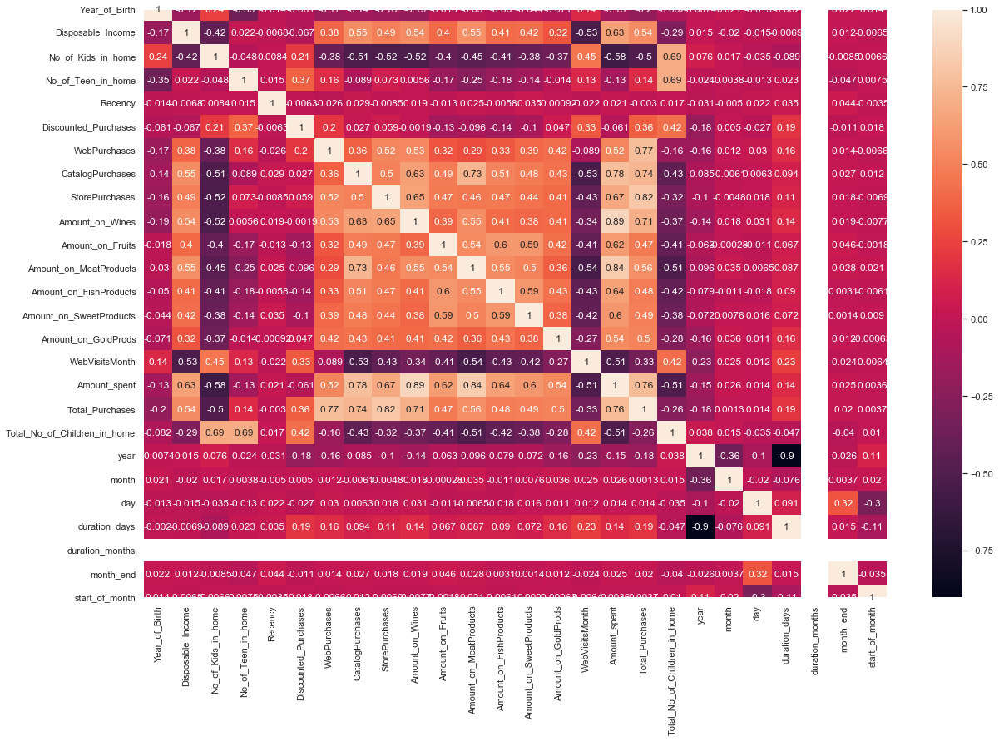

In [66]:
sns.set_palette(sns.color_palette("Set2", 8))
plt.figure(figsize=(20,13))
sns.heatmap(Train.corr(), annot= True)
plt.show()

In [67]:
def highly_correlated(data, threshold):
    col_corr=set() ### we would create the set of all highly correlated name
    corr_matrix= data.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i,j])>=threshold: ## we are only interested in the absolute value for the correlation coefficient
                colname=corr_matrix.columns[i]
                col_corr.add(colname)
    return col_corr
    

In [68]:
highly_correlated(Train, 0.9)

{'duration_days'}

### therefore we preferrably drop duration_days.

### but both tree and boosting algorithms are immune to multicolinearity, therefore they will only choose the perfectly correlated column during split.

### in summary dropping multicolinear columns depends on the type of algorithm to be used of model building

In [69]:
## Function to plot distributions and boxplot of customers

def plot(x, target, data):
    fig, axs= plt.subplots(2,2, figsize=(12,10))
    axs[0,0].set_title(f"Disribution of {x} \n of Customers who had Not Accepted The Offer", fontsize=14, fontweight="bold")
    sns.distplot(data[(data[target] ==0)][x],ax=axs[0,0], color="teal")
    axs[0, 1].set_title(f"Distribution of {x}\n of  Customers who had Accepted The Offer",fontsize=15,fontweight="bold")
    sns.distplot(data[(data[target] == 1)][x],ax=axs[0,1],color="pink")
    axs[1,0].set_title(f'Boxplot of {x} w.r.t Offer Accepted',fontsize=10,fontweight="bold")
    
    line = plt.Line2D((.1,.9),(.5,.5), color='black', linewidth=1.5,linestyle='--')
    fig.add_artist(line)
   
    sns.boxplot(data[target],data[x],ax=axs[1,0],palette='gist_rainbow',showmeans=True)
    axs[1,1].set_title(f'Boxplot of {x} w.r.t Offer Accepted - Without outliers',fontsize=12,fontweight='bold')
    sns.boxplot(data[target],data[x],ax=axs[1,1],showfliers=False,palette='gist_rainbow',showmeans=True) #turning off outliers from boxplot
    sns.despine(top=True,right=True,left=True) # to remove side line from graph
    plt.tight_layout(pad=4)
    plt.show()

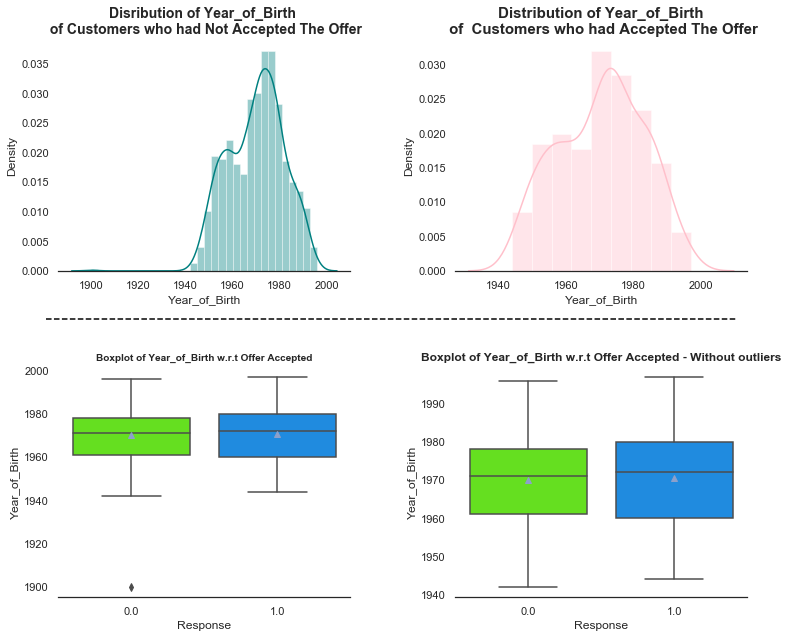

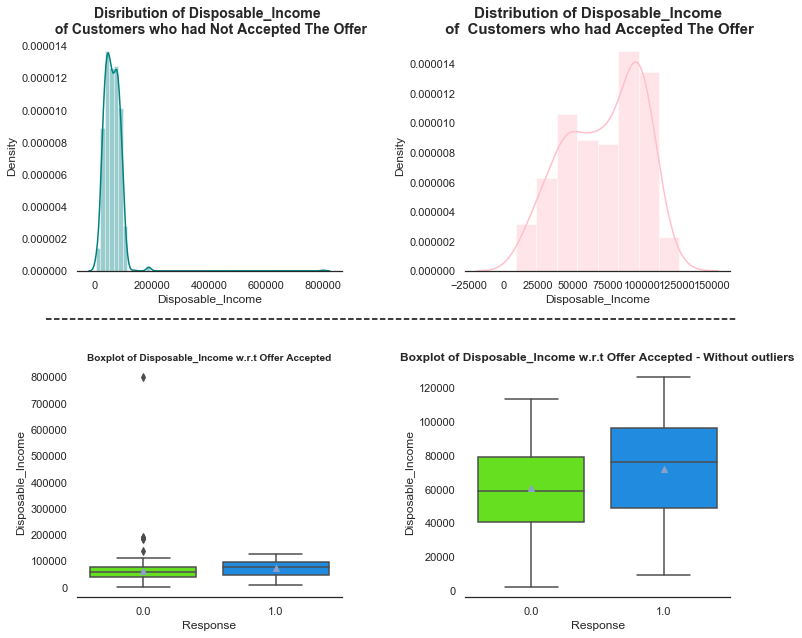

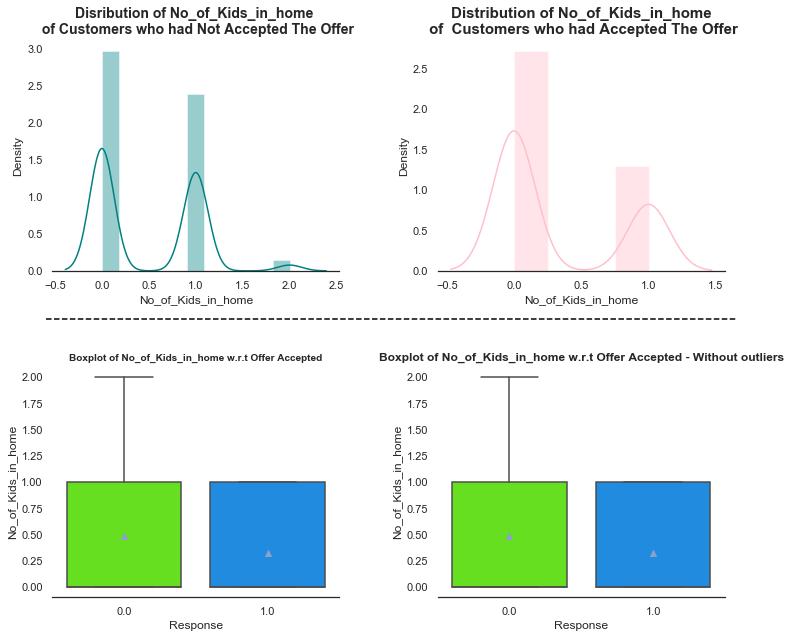

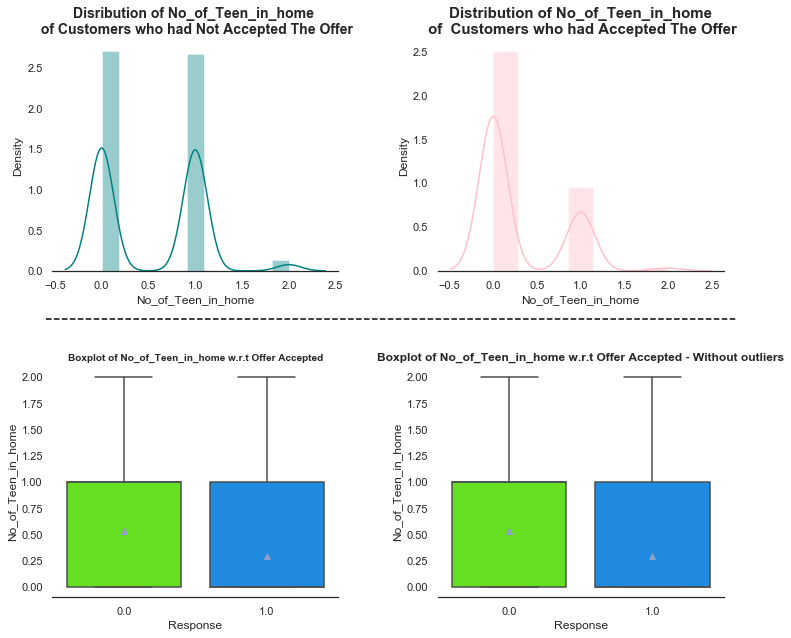

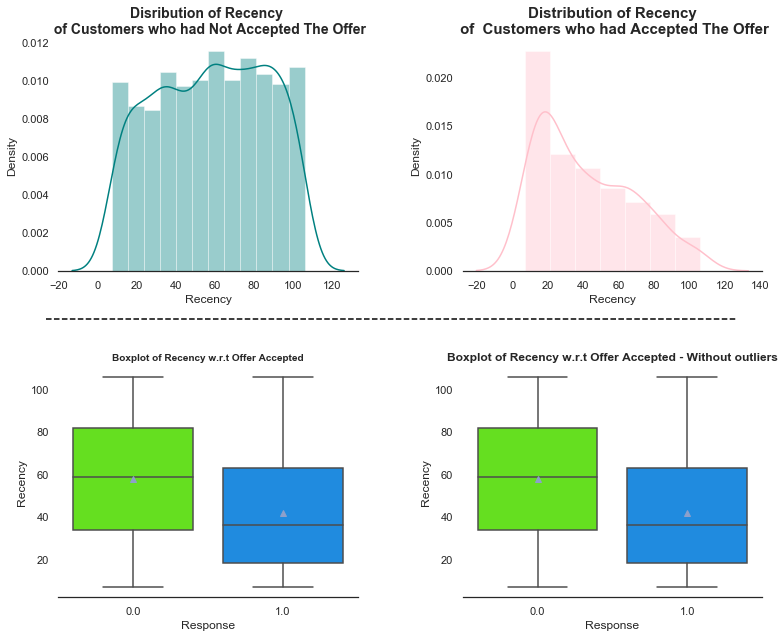

...

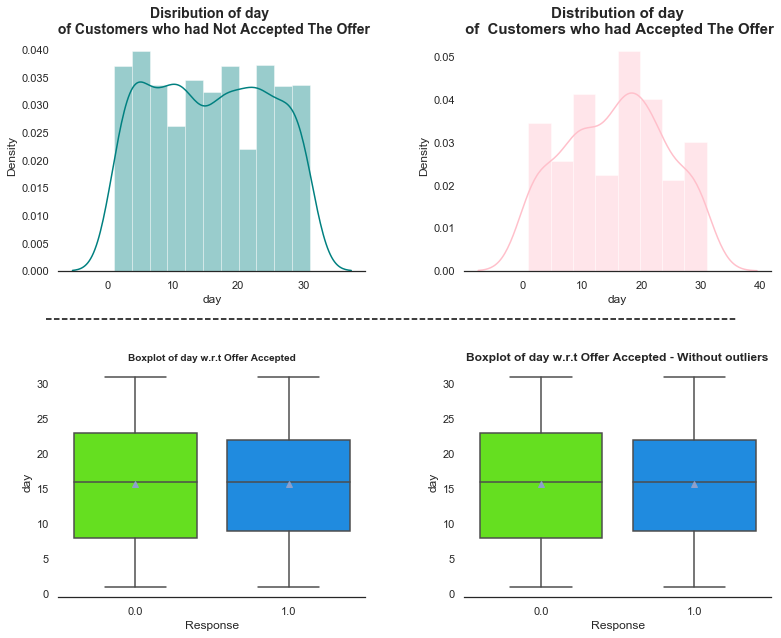

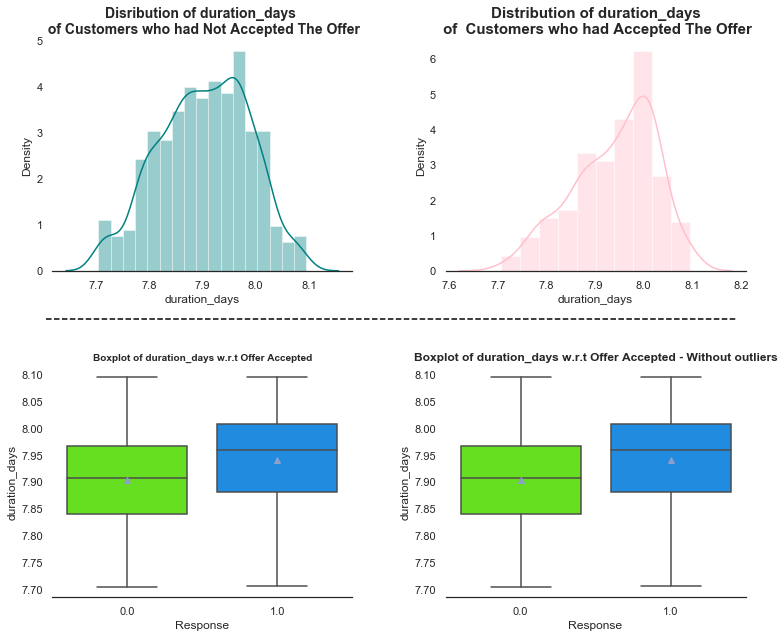

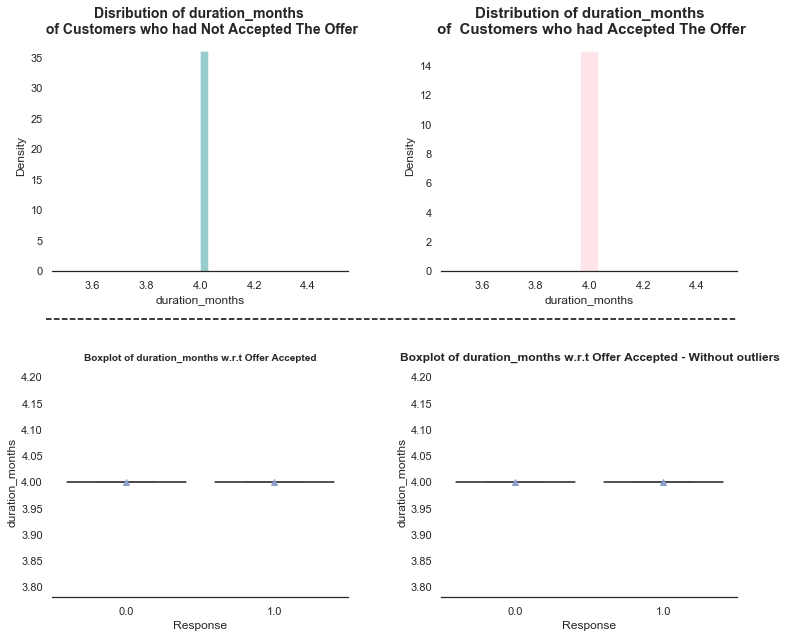

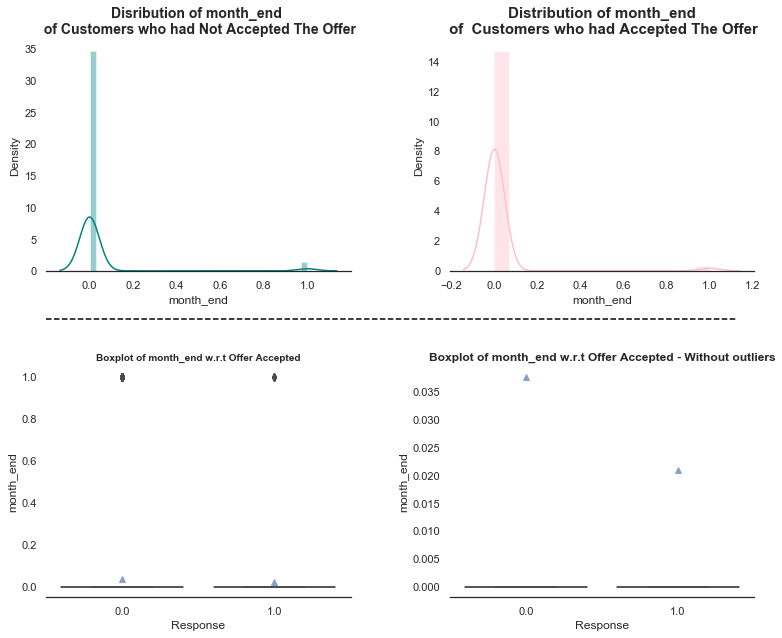

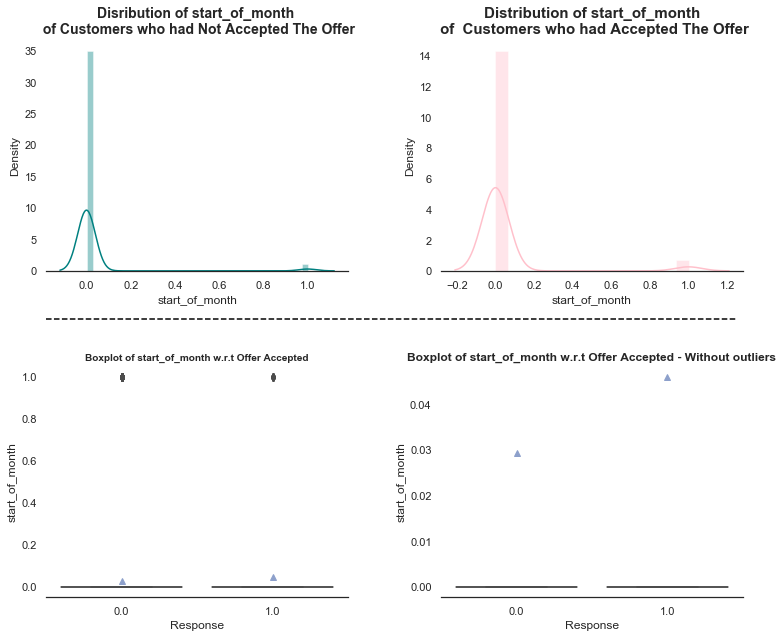

In [71]:
### select all quantitative columns and check the spread
list_col= Train.select_dtypes(include='number').columns.to_list()
for j in range(len(list_col)):
    plot(list_col[j], 'Response', Train)

#### Observations
#####  Most customers who had accepted the offer were born in the period 1960s' to 1980s' .Year_Of_birth has an outlier 1899,  who did not accept the offer
#####  Customers who accepted the offer had a disposable income  in the range of 50000-100000. Suprisingly customers who have a montlhy income in the range of 125000-800000 did not accept the offer
#####  Customers who accepted the products last purchases was 20-40 days ago
#####  Customers who had use cupons more than 12-14 times did not buy the product, well this is strange more EDA will be needed to tell us why.
#####  Customers who purchased goods 20-28 times directly from the website did not buy the product.
#####  Customers who had spent 1500-1750 on meat did not accept the offer
#####  Customers who had spent 250 or more on sweet products did not accept the offer
#####  Customers who spent 260 or more on Gold_Prods did not accept the offer
#####  Customers that visited the web  10 times or more did not accept the offer.
#####  Customers whoose total purchases exceeded 35 times did not accept the offer.
#####  Also  we can see that values of features under purchases and amount_spent list might not be entirely linearly fit, so we might have to use polynomial to fit the values

Text(0.5, 1.0, 'Disposable_Income vs Education_Level')

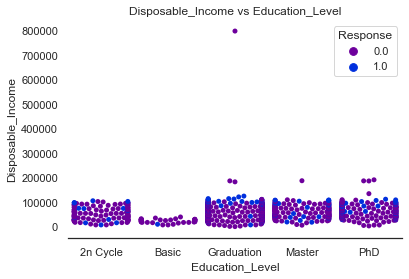

In [65]:

sns.set_palette(sns.color_palette("nipy_spectral", 8))

sns.swarmplot(y='Disposable_Income',x='Education_Level',hue='Response',data=Train)
sns.despine(top=True,right=True,left=True) # to remove side line from graph
plt.title('Disposable_Income vs Education_Level')

Text(0.5, 1.0, 'WebPurchases vs WebVisitsMonth_Bin')

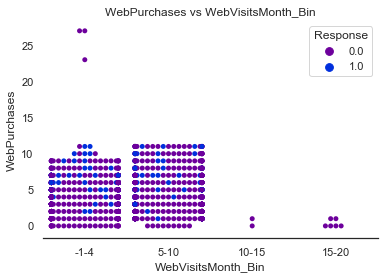

In [66]:

sns.set_palette(sns.color_palette("nipy_spectral", 8))

sns.swarmplot(y='WebPurchases',x='WebVisitsMonth_Bin',hue='Response',data=Train)
sns.despine(top=True,right=True,left=True) # to remove side line from graph
plt.title('WebPurchases vs WebVisitsMonth_Bin')

Text(0.5, 1.0, 'Year_of_Birth vs RecencyBin')

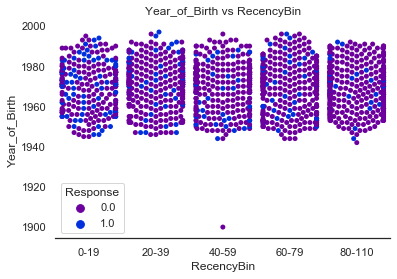

In [67]:

sns.set_palette(sns.color_palette("nipy_spectral", 8))

sns.swarmplot(y='Year_of_Birth',x='RecencyBin',hue='Response',data=Train)
sns.despine(top=True,right=True,left=True) # to remove side line from graph
plt.title('Year_of_Birth vs RecencyBin')

Text(0.5, 1.0, 'Total_amount_spent vs month_end')

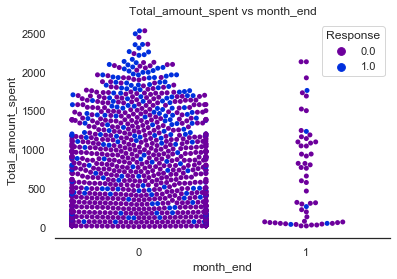

In [68]:

sns.set_palette(sns.color_palette("nipy_spectral", 8))

sns.swarmplot(y='Total_amount_spent',x='month_end',hue='Response',data=Train)
sns.despine(top=True,right=True,left=True) # to remove side line from graph
plt.title('Total_amount_spent vs month_end')

Text(0.5, 1.0, 'Total_amount_spent vs start_of_month')

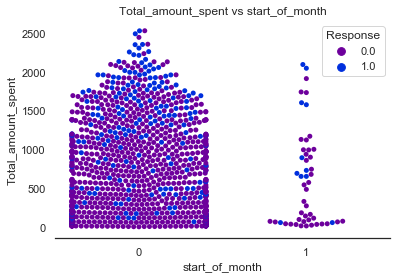

In [69]:

sns.set_palette(sns.color_palette("nipy_spectral", 8))

sns.swarmplot(y='Total_amount_spent',x='start_of_month',hue='Response',data=Train)
sns.despine(top=True,right=True,left=True) # to remove side line from graph
plt.title('Total_amount_spent vs start_of_month')

Text(0.5, 1.0, 'Disposable_Income vs Marital_Status')

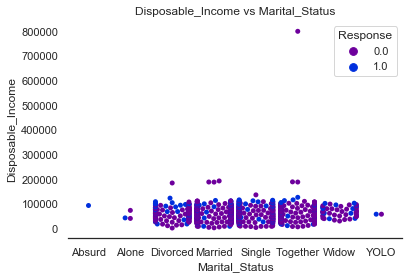

In [70]:

sns.set_palette(sns.color_palette("nipy_spectral", 8))

sns.swarmplot(y='Disposable_Income',x='Marital_Status',hue='Response', data=Train)
sns.despine(top=True,right=True,left=True) # to remove side line from graph
plt.title('Disposable_Income vs Marital_Status')

Text(0.5, 1.0, 'Disposable_Income vs Any_Complain')

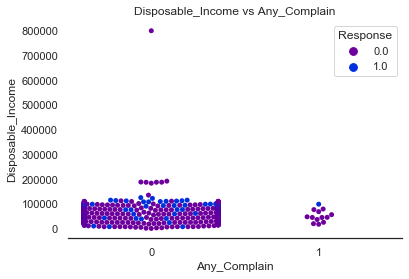

In [71]:

sns.set_palette(sns.color_palette("nipy_spectral", 8))

sns.swarmplot(y='Disposable_Income',x='Any_Complain',hue='Response', data=Train)
sns.despine(top=True,right=True,left=True) # to remove side line from graph
plt.title('Disposable_Income vs Any_Complain')

### Obsevations 
####  Customers who are graduate and have a disposable_income of 120000 accepted the offer.
####  Customers who visited the web about 1-10 times and purchased goods  from the web about 5-10 had a mix  feelings whether or not to accept the offer, but this can be improved by a better marketing campaign .
####  customers who visited the web about 11-20 times and purchased goods between 20-25 times on the web did not accept the offer, this is indicating that maybe our web services isn't that good enough, so we could be improve it to  give a more user friendly website. 
####  ~60% of Customers who last purchased goods around 19 days or less  and were born between the 1950s' to 1990s' did well in accepting the offer.
####  most of our customers who accepted the offer registered in the middle of the month.
####  most Customers who are divorced or single and with an income of 100000-120000 accepted the offer.
####   To my surprise Yolo, Alone, Absurd are relevant but moredata is needed to understand their relationship with Response.

In [72]:
### join both train data and  test data with datasist
all_data1, ntrain, ntest =ds.structdata.join_train_and_test(Train, Test)

In [73]:
all_data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 40 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   Year_of_Birth                 2240 non-null   int64         
 1   Education_Level               2240 non-null   category      
 2   Marital_Status                2240 non-null   category      
 3   Disposable_Income             2216 non-null   float64       
 4   No_of_Kids_in_home            2240 non-null   int64         
 5   No_of_Teen_in_home            2240 non-null   int64         
 6   Date_Customer                 2240 non-null   datetime64[ns]
 7   Recency                       2240 non-null   int64         
 8   Discounted_Purchases          2240 non-null   int64         
 9   WebPurchases                  2240 non-null   int64         
 10  CatalogPurchases              2240 non-null   int64         
 11  StorePurchases                

### . Misssing value treatment

In [75]:
all_data1.isnull().sum()

Year_of_Birth                     0
Education_Level                   0
Marital_Status                    0
Disposable_Income                24
No_of_Kids_in_home                0
No_of_Teen_in_home                0
Date_Customer                     0
Recency                           0
Discounted_Purchases              0
WebPurchases                      0
CatalogPurchases                  0
StorePurchases                    0
Amount_on_Wines                   0
Amount_on_Fruits                  0
Amount_on_MeatProducts            0
Amount_on_FishProducts            0
Amount_on_SweetProducts           0
Amount_on_GoldProds               0
WebVisitsMonth                    0
Cmp3Accepted                      0
Cmp4Accepted                      0
Cmp5Accepted                      0
Cmp1Accepted                      0
Cmp2Accepted                      0
Any_Complain                      0
Response                        672
Year_of_Birth_Bin                 0
RecencyBin                  

#### Handling missing values in Disposable_Income

#### .. Missing value treatment for Disposable_Income
#### .. since Disposable_Income has  outliers it would be best not to fill the missing values with mean instead we use median
#### .. there seems to be kind of a relationship between 'Marital_Status', 'Education_Level', 'Year_of_Birth_Bin' and 'Disposable_Income' from our domain knowledge 
#### .. but if we are not sure we could use the statistical test chi square test and Cramer's V test
#### .. but since we are sure of their relationship with each other (Education_Level, Marital_status snd disposable_income), we can skip the test

#### .. we know that if p value <= 0.05 we reject the null hypothesis HO
#### .. the null hypothesis assumes that there is no relationship between the independent variable and the dependent variable
#### ..Cramer's V value show the strength of the relationship

In [76]:
all_data1.groupby(['Education_Level', 'Marital_Status','Year_of_Birth_Bin'])['Disposable_Income'].median()

Education_Level  Marital_Status  Year_of_Birth_Bin
2n Cycle         Absurd          1890-1940                    nan
                                 1899-1940                    nan
                                 1940-1950                    nan
                                 1951-1960                    nan
                                 1961-1970                    nan
                                 1971-1980                    nan
                                 1981-1990                    nan
                                 1991-2000                    nan
                 Alone           1890-1940                    nan
                                 1899-1940                    nan
                                 1940-1950                    nan
                                 1951-1960                    nan
                                 1961-1970                    nan
                                 1971-1980                    nan
                         

In [77]:
all_data1['Disposable_Income']=all_data1.groupby(['Education_Level', 'Marital_Status','Year_of_Birth_Bin'])['Disposable_Income'].apply(lambda x:x.fillna(x.median()))

In [78]:
all_data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 40 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   Year_of_Birth                 2240 non-null   int64         
 1   Education_Level               2240 non-null   category      
 2   Marital_Status                2240 non-null   category      
 3   Disposable_Income             2240 non-null   float64       
 4   No_of_Kids_in_home            2240 non-null   int64         
 5   No_of_Teen_in_home            2240 non-null   int64         
 6   Date_Customer                 2240 non-null   datetime64[ns]
 7   Recency                       2240 non-null   int64         
 8   Discounted_Purchases          2240 non-null   int64         
 9   WebPurchases                  2240 non-null   int64         
 10  CatalogPurchases              2240 non-null   int64         
 11  StorePurchases                

### let's create a polynomial feature that will better fit the Amount and  Purchases feature

In [79]:
poly_feature_1= ['Discounted_Purchases','WebPurchases', 'CatalogPurchases',
                  'StorePurchases', 'Total_Purchases']

poly_feature_2= ['Amount_on_Wines', 'Amount_on_SweetProducts', 'Amount_on_GoldProds', 'Amount_on_FishProducts',
                  'Amount_on_MeatProducts', 'Amount_on_Fruits', 'Amount_spent']

In [80]:
from sklearn.preprocessing  import PolynomialFeatures

In [81]:
poly= PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)

poly1= poly.fit_transform(all_data1[poly_feature_1])
poly2= poly.fit_transform(all_data1[poly_feature_2])

In [82]:
df_poly1= pd.DataFrame(poly1, columns=[f"poly1_{i}" for i in range(poly1.shape[1])])
df_poly2= pd.DataFrame(poly2, columns=[f"poly_{i}" for i in range(poly2.shape[1])])

In [83]:
all_data1=pd.concat([all_data1, df_poly1], axis=1)
all_data1= pd.concat([all_data1, df_poly2], axis =1)

In [84]:
all_data1.isnull().sum()

Year_of_Birth                     0
Education_Level                   0
Marital_Status                    0
Disposable_Income                 0
No_of_Kids_in_home                0
No_of_Teen_in_home                0
Date_Customer                     0
Recency                           0
Discounted_Purchases              0
WebPurchases                      0
CatalogPurchases                  0
StorePurchases                    0
Amount_on_Wines                   0
Amount_on_Fruits                  0
Amount_on_MeatProducts            0
Amount_on_FishProducts            0
Amount_on_SweetProducts           0
Amount_on_GoldProds               0
WebVisitsMonth                    0
Cmp3Accepted                      0
Cmp4Accepted                      0
Cmp5Accepted                      0
Cmp1Accepted                      0
Cmp2Accepted                      0
Any_Complain                      0
Response                        672
Year_of_Birth_Bin                 0
RecencyBin                  

In [85]:
###  to handle the missing values present in Disposable_Income_Bin, we would re-group Disposable_Income into bins , since it has no missing values
###  Diposable_Income_Bin would also now  be without nan values 

all_data1['Disposable_Income_Bin']= pd.cut(all_data1['Disposable_Income'], bins= [2000,12000,28000, 38000,48000, 60000,80000,100000,150000,800000], 
                                            labels=['<12000','<28000','<38000', '<48000', '<68000','<80000','<100000','<150000','<800000'])

In [86]:
all_data1.isnull().sum()

Year_of_Birth                     0
Education_Level                   0
Marital_Status                    0
Disposable_Income                 0
No_of_Kids_in_home                0
No_of_Teen_in_home                0
Date_Customer                     0
Recency                           0
Discounted_Purchases              0
WebPurchases                      0
CatalogPurchases                  0
StorePurchases                    0
Amount_on_Wines                   0
Amount_on_Fruits                  0
Amount_on_MeatProducts            0
Amount_on_FishProducts            0
Amount_on_SweetProducts           0
Amount_on_GoldProds               0
WebVisitsMonth                    0
Cmp3Accepted                      0
Cmp4Accepted                      0
Cmp5Accepted                      0
Cmp1Accepted                      0
Cmp2Accepted                      0
Any_Complain                      0
Response                        672
Year_of_Birth_Bin                 0
RecencyBin                  

In [87]:
### let's seperate the train and test data from the all_data dataset
Sapa_train=all_data1.iloc[0:ntrain]
Sapa_test =all_data1.iloc[ntrain:]

### Customer Profile by Recency

##### We would like to see the relationship between offer accepted and all other features

In [88]:
customer_prof= Sapa_train[Sapa_train['Response']==1]

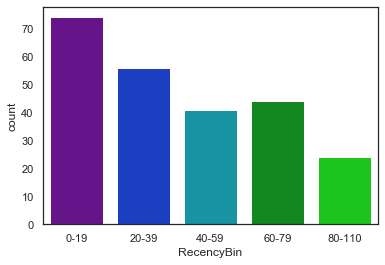

<Figure size 792x576 with 0 Axes>

In [89]:
sns.countplot(x="RecencyBin", data=customer_prof)
plt.figure(figsize=(11,8))
sns.despine(top=True,right=True,left=True) # to remove side line from graph

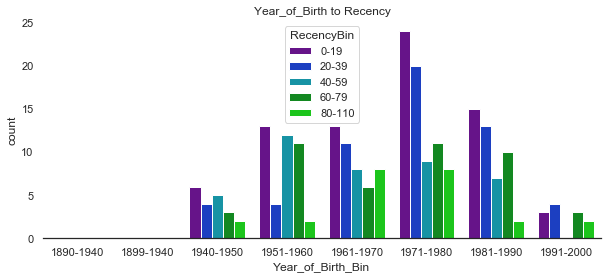

In [90]:
plt.figure(figsize=(10,4))
sns.countplot(x='Year_of_Birth_Bin', hue='RecencyBin', data=customer_prof).set_title('Year_of_Birth to Recency')
sns.despine(top=True, right=True,  left=True) # to remove the side line from the graph
plt.show()

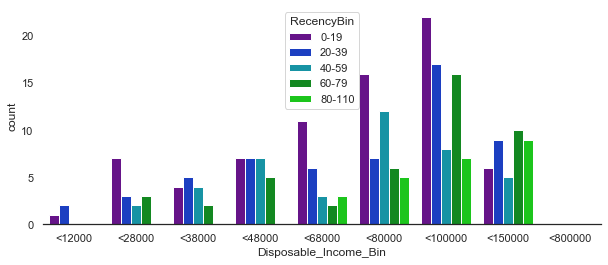

In [91]:
plt.figure(figsize=(10,4))
sns.countplot(x='Disposable_Income_Bin', hue='RecencyBin', data=customer_prof)

sns.despine(top=True, right=True,  left=True) # to remove the side line from the graph
plt.show()

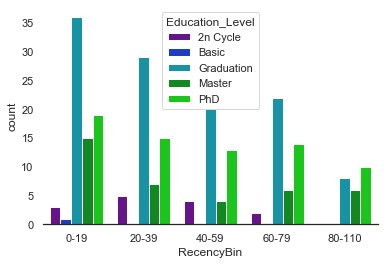

In [92]:
sns.countplot(x='RecencyBin', data=customer_prof, hue='Education_Level')

sns.despine(top=True, right=True,  left=True) # to remove the side line from the graph

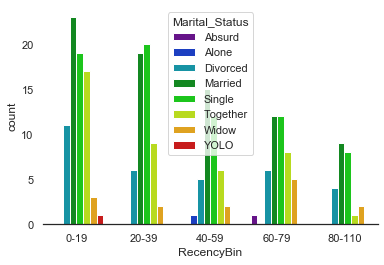

In [93]:
sns.countplot(x='RecencyBin', data=customer_prof, hue='Marital_Status')

sns.despine(top=True, right=True,  left=True) # to remove the side line from the graph

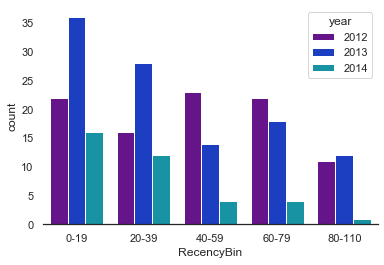

In [94]:
sns.countplot(x='RecencyBin', data=customer_prof, hue='year')

sns.despine(top=True, right=True,  left=True) # to remove the side line from the graph

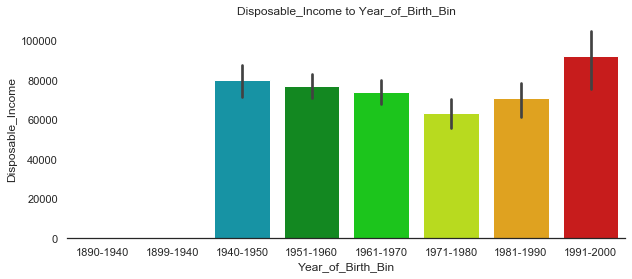

In [95]:
plt.figure(figsize=(10,4))
sns.barplot(y='Disposable_Income', x='Year_of_Birth_Bin',  data=customer_prof).set_title('Disposable_Income to Year_of_Birth_Bin')
sns.despine(top=True, right=True,  left=True) # to remove the side line from the graph
plt.show()

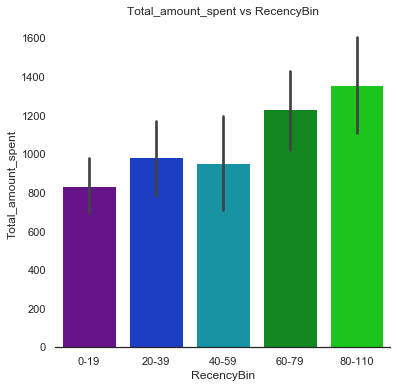

In [96]:
plt.figure(figsize=(6, 6))
sns.barplot(y='Total_amount_spent', x='RecencyBin',  data=customer_prof).set_title('Total_amount_spent vs RecencyBin')
sns.despine(top=True, right=True,  left=True) # to remove the side line from the graph
plt.show()

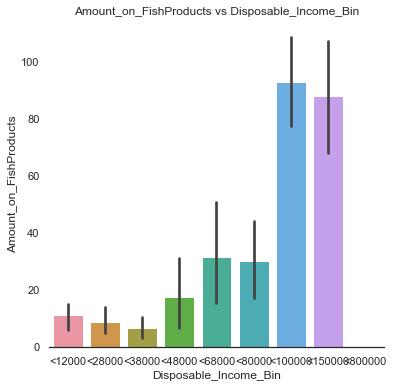

In [97]:
plt.figure(figsize=(6, 6))
sns.barplot(y='Amount_on_FishProducts', x='Disposable_Income_Bin',  data=customer_prof).set_title('Amount_on_FishProducts vs Disposable_Income_Bin')
sns.despine(top=True, right=True,  left=True) # to remove the side line from the graph
plt.show()

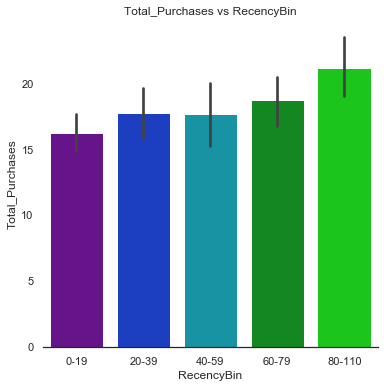

In [98]:
plt.figure(figsize=(6, 6))
sns.barplot(y='Total_Purchases', x='RecencyBin',  data=customer_prof).set_title('Total_Purchases vs RecencyBin')
sns.despine(top=True, right=True,  left=True) # to remove the side line from the graph
plt.show()

In [99]:
def stacked_plot(x):
    sns.set_palette(sns.color_palette("nipy_spectral", 8))
    tab1 = pd.crosstab(x,Sapa_train['Response'],margins=True)
    print(tab1)
    print('-'*120)
    tab = pd.crosstab(x,Sapa_train['Response'],normalize='index')
    tab.plot(kind='bar',stacked=True,figsize=(9,5))
    plt.xticks(rotation=360)
    labels=["No","Yes"]
    plt.legend(loc='lower left', frameon=False,)
    plt.legend(loc="upper left", labels=labels,title="Response",bbox_to_anchor=(1,1))
    sns.despine(top=True,right=True,left=True) # to remove side line from graph
    #plt.legend(labels)
    plt.show()

In [100]:
list_columns= ['Education_Level', 'Marital_Status','Cmp1Accepted', 'Cmp2Accepted',
               'Cmp3Accepted','Cmp4Accepted','Cmp5Accepted', 'Any_Complain','year',
               'RecencyBin', 'Year_of_Birth_Bin']

Response          0.0  1.0   All
Education_Level                 
2n Cycle          128   14   142
Basic              37    1    38
Graduation        687  115   802
Master            208   38   246
PhD               269   71   340
All              1329  239  1568
------------------------------------------------------------------------------------------------------------------------


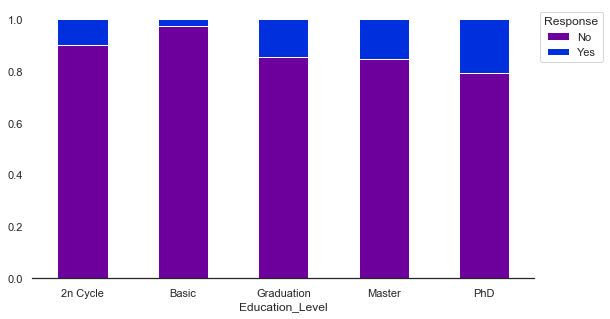

Response         0.0  1.0   All
Marital_Status                 
Absurd             0    1     1
Alone              2    1     3
Divorced         127   32   159
Married          537   78   615
Single           258   71   329
Together         368   41   409
Widow             36   14    50
YOLO               1    1     2
All             1329  239  1568
------------------------------------------------------------------------------------------------------------------------


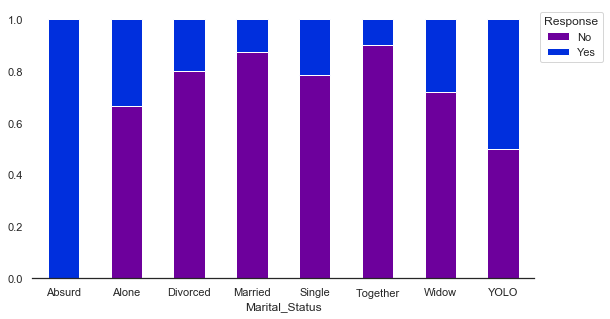

Response       0.0  1.0   All
Cmp1Accepted                 
0             1291  176  1467
1               38   63   101
All           1329  239  1568
------------------------------------------------------------------------------------------------------------------------


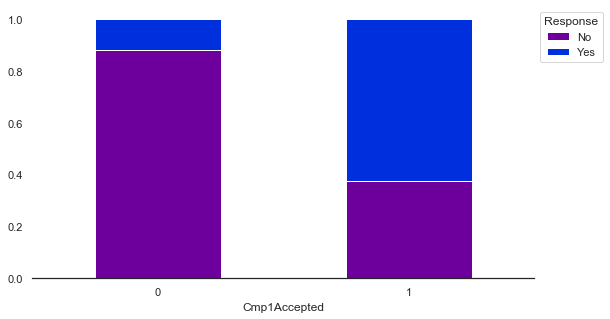

Response       0.0  1.0   All
Cmp2Accepted                 
0             1322  226  1548
1                7   13    20
All           1329  239  1568
------------------------------------------------------------------------------------------------------------------------


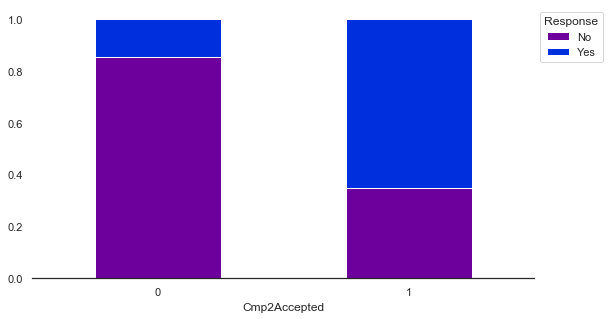

Response       0.0  1.0   All
Cmp3Accepted                 
0             1270  184  1454
1               59   55   114
All           1329  239  1568
------------------------------------------------------------------------------------------------------------------------


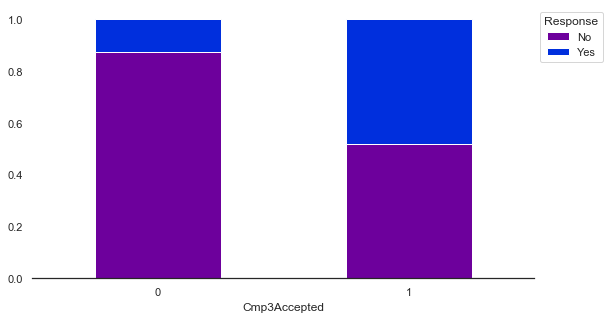

Response       0.0  1.0   All
Cmp4Accepted                 
0             1262  192  1454
1               67   47   114
All           1329  239  1568
------------------------------------------------------------------------------------------------------------------------


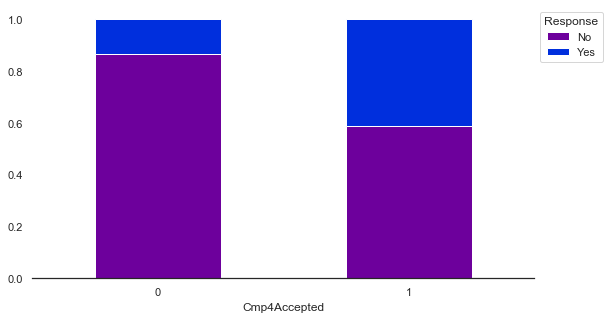

Response       0.0  1.0   All
Cmp5Accepted                 
0             1277  165  1442
1               52   74   126
All           1329  239  1568
------------------------------------------------------------------------------------------------------------------------


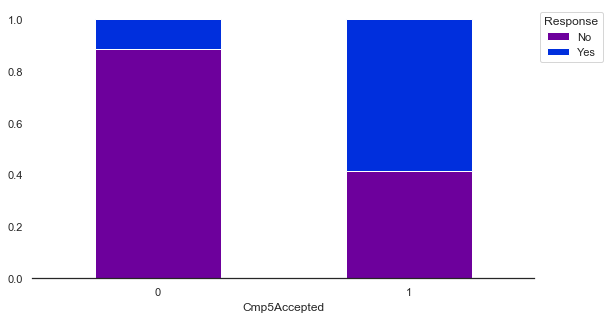

Response       0.0  1.0   All
Any_Complain                 
0             1317  238  1555
1               12    1    13
All           1329  239  1568
------------------------------------------------------------------------------------------------------------------------


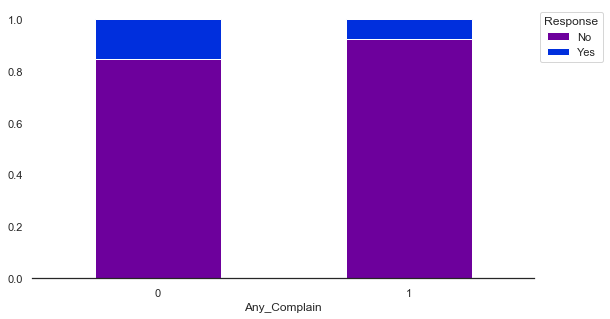

Response   0.0  1.0   All
year                     
2012       259   94   353
2013       724  108   832
2014       346   37   383
All       1329  239  1568
------------------------------------------------------------------------------------------------------------------------


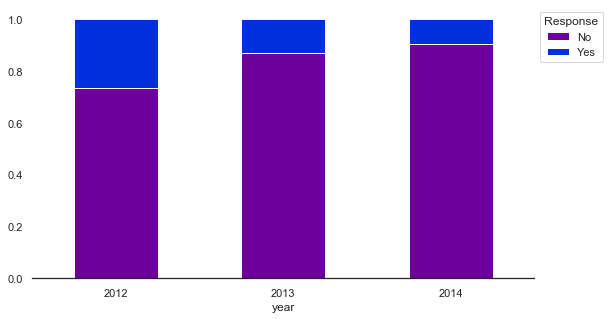

Response     0.0  1.0   All
RecencyBin                 
0-19         173   74   247
20-39        250   56   306
40-59        263   41   304
60-79        283   44   327
80-110       360   24   384
All         1329  239  1568
------------------------------------------------------------------------------------------------------------------------


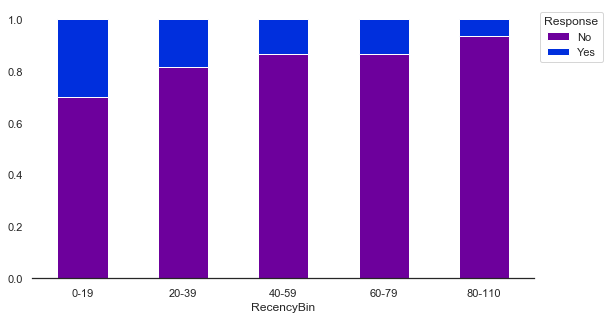

Response            0.0  1.0   All
Year_of_Birth_Bin                 
1899-1940             1    0     1
1940-1950            61   20    81
1951-1960           269   42   311
1961-1970           298   46   344
1971-1980           454   72   526
1981-1990           208   47   255
1991-2000            38   12    50
All                1329  239  1568
------------------------------------------------------------------------------------------------------------------------


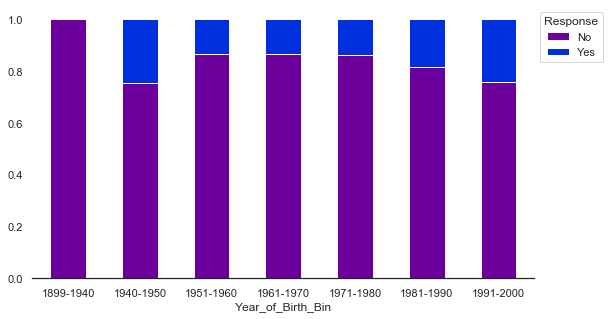

In [101]:
for i, variable in enumerate(list_columns):
    stacked_plot(Sapa_train[variable])

###  Customer Profile according to  Rececny(i.e no of days since the customer last purchase) to Offer Accepted

#### 0-19days: Customers who accepted the offer were mostly  Married or single graduate who were born in the 1970s' to 1980s, enrolled with the company in 2013 and have a disposable income less than 100000 and the total amount spent by the customer was between 700-800
#### 20-39days: Customers also had similar traits to those whom their last purchase was 19 days or less but their total purchase was between 15-20
#### 40-59days: Customers who accepted the offer were mostly Married or single graduate who were born in 50s'to 80s', enrolled with the company in 2012, have a disposable income less than 80000, the total amount spent was between 800-1100 and their total purchases was around 15-20
#### 60-79days: Customers who accepted the offer were mostly Married or single graduate who also have their Phd's.Were born in the 50s' to 90s', enrolled with the company in 2012 or 2013 , have a disposable income less than 100000 and the total amount spentwas between 1000-1400 or less
#### 80-110days: Customers who accepted the offer were mostly married or single Phd holder, who were born in the 60s' to 80s' 

### Insights Based on EDA

####  Most customers who accepted the offer their last purchase was between 0-39 days
####  Most customers who accpeted the offer  were either Graduate or Phd holders
####  Most customers who accepte the offer have a disposable income of 100000 or less
####  Customers who were born between the 50s' down to the 80s' purchased the product
####  Customers with higher total purchase spent more time before returning to purchase another product.

### Outlier Detection

In [102]:
## to find the 25th percentile
Q1= Sapa_train.quantile(0.25)

## to find the 75th percentile
Q3= Sapa_train.quantile(0.75)

## Interquantile range
IQR= Q3-Q1

## to find the lower bound 
lower = Q1 - 1.5*IQR

## to find the upper bound 
upper =Q3 + 1.5*IQR

In [103]:
## this code will find all the outliers present in numerical columns and convert them to percentage
((Sapa_train.select_dtypes(include=['float64','int64'])<lower) 
 | (Sapa_train.select_dtypes(include=['float64','int64'])>upper)).sum()/len(Sapa_train)*100

Amount_on_FishProducts         10.26786
Amount_on_Fruits               10.20408
Amount_on_GoldProds             8.86480
Amount_on_MeatProducts          8.67347
Amount_on_SweetProducts        10.84184
Amount_on_Wines                 2.04082
CatalogPurchases                1.27551
Discounted_Purchases            3.57143
Disposable_Income               0.44643
No_of_Kids_in_home              0.00000
No_of_Teen_in_home              0.00000
Recency                         0.00000
StorePurchases                  0.00000
Total_No_of_Children_in_home    2.55102
Total_Purchases                 0.12755
Total_amount_spent              0.12755
WebPurchases                    0.19133
WebVisitsMonth                  0.44643
Year_of_Birth                   0.06378
day                             0.00000
duration_days                   0.00000
duration_months                 0.00000
month                           0.00000
month_end                       0.00000
poly1_0                         3.57143


In [130]:
First_column=Sapa_train.pop('Response')
Sapa_train.insert(0, 'Response', First_column)

In [131]:
Sapa_train.sort_values(by=['Amount_on_FishProducts'], ascending=False).head(10)

,Response,Year_of_Birth,Education_Level,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Date_Customer,Recency,Discounted_Purchases,WebPurchases,CatalogPurchases,StorePurchases,Amount_on_Wines,Amount_on_Fruits,Amount_on_MeatProducts,Amount_on_FishProducts,Amount_on_SweetProducts,Amount_on_GoldProds,WebVisitsMonth,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain,Year_of_Birth_Bin,RecencyBin,Disposable_Income_Bin,WebVisitsMonth_Bin,Amount_spent,Total_Purchases,Total_No_of_Children_in_home,year,month,day,duration_days,duration_months,month_end,start_of_month,poly1_0,poly1_1,poly1_2,poly1_3,poly1_4,poly1_5,poly1_6,poly1_7,poly1_8,poly1_9,poly1_10,poly1_11,poly1_12,poly1_13,poly1_14,poly_0,poly_1,poly_2,poly_3,poly_4,poly_5,poly_6,poly_7,poly_8,poly_9,poly_10,poly_11,poly_12,poly_13,poly_14,poly_15,poly_16,poly_17,poly_18,poly_19,poly_20,poly_21,poly_22,poly_23,poly_24,poly_25,poly_26,poly_27
1221,0.00000,1962,2n Cycle,Widow,71020.80000,0,1,2012-09-09,13,3,6,6,12,346,145,113,259,151,66,5,0,0,0,0,0,0,1961-1970,0-19,<80000,-1-4,1080,27,1,2012,9,9,8.01830,4,0,0,3.00000,6.00000,6.00000,12.00000,27.00000,18.00000,18.00000,36.00000,81.00000,36.00000,72.00000,162.00000,72.00000,162.00000,324.00000,346.00000,151.00000,66.00000,259.00000,113.00000,145.00000,1080.00000,52246.00000,22836.00000,89614.00000,39098.00000,50170.00000,373680.00000,9966.00000,39109.00000,17063.00000,21895.00000,163080.00000,17094.00000,7458.00000,9570.00000,71280.00000,29267.00000,37555.00000,279720.00000,16385.00000,122040.00000,156600.00000
520,0.00000,1982,2n Cycle,Together,90928.80000,1,0,2014-02-05,34,1,7,5,8,345,24,134,258,14,56,4,0,0,0,0,0,0,1981-1990,20-39,<100000,-1-4,831,21,1,2014,2,5,7.83281,4,0,0,1.00000,7.00000,5.00000,8.00000,21.00000,7.00000,5.00000,8.00000,21.00000,35.00000,56.00000,147.00000,40.00000,105.00000,168.00000,345.00000,14.00000,56.00000,258.00000,134.00000,24.00000,831.00000,4830.00000,19320.00000,89010.00000,46230.00000,8280.00000,286695.00000,784.00000,3612.00000,1876.00000,336.00000,11634.00000,14448.00000,7504.00000,1344.00000,46536.00000,34572.00000,6192.00000,214398.00000,3216.00000,111354.00000,19944.00000
282,0.00000,1952,Master,Widow,88446.00000,0,2,2014-05-03,93,2,9,6,8,617,94,520,258,107,107,5,0,0,0,0,0,0,1951-1960,80-110,<100000,-1-4,1703,25,2,2014,5,3,7.79770,4,0,0,2.00000,9.00000,6.00000,8.00000,25.00000,18.00000,12.00000,16.00000,50.00000,54.00000,72.00000,225.00000,48.00000,150.00000,200.00000,617.00000,107.00000,107.00000,258.00000,520.00000,94.00000,1703.00000,66019.00000,66019.00000,159186.00000,320840.00000,57998.00000,1050751.00000,11449.00000,27606.00000,55640.00000,10058.00000,182221.00000,27606.00000,55640.00000,10058.00000,182221.00000,134160.00000,24252.00000,439374.00000,48880.00000,885560.00000,160082.00000
1295,0.00000,1982,2n Cycle,Together,90928.80000,1,0,2014-02-05,34,1,7,5,8,345,24,134,258,14,56,4,0,0,0,0,0,0,1981-1990,20-39,<100000,-1-4,831,21,1,2014,2,5,7.83281,4,0,0,1.00000,7.00000,5.00000,8.00000,21.00000,7.00000,5.00000,8.00000,21.00000,35.00000,56.00000,147.00000,40.00000,105.00000,168.00000,345.00000,14.00000,56.00000,258.00000,134.00000,24.00000,831.00000,4830.00000,19320.00000,89010.00000,46230.00000,8280.00000,286695.00000,784.00000,3612.00000,1876.00000,336.00000,11634.00000,14448.00000,7504.00000,1344.00000,46536.00000,34572.00000,6192.00000,214398.00000,3216.00000,111354.00000,19944.00000
388,0.00000,1986,Graduation,Married,85141.20000,0,0,2013-04-05,73,1,3,4,9,244,13,554,254,87,54,1,0,0,0,0,0,0,1981-1990,60-79,<100000,-1-4,1206,17,0,2013,4,5,7.94733,4,0,0,1.00000,3.00000,4.00000,9.00000,17.00000,3.00000,4.00000,9.00000,17.00000,12.00000,27.00000,51.00000,36.00000,68.00000,153.00000,244.00000,87.00000,54.00000,254.00000,554.00000,13.00000,1206.00000,21228.00000,13176.00000,61976.00000,135176.00000,3172.00000,294264.00000,4698.00000,22098.00000,48198.00000,1131.00000,104922.00000,13716.00000,29916.00000,702.00000,65124.00000,140716.00000,3302.0

In [132]:
Sapa_train.sort_values(by=['Amount_on_SweetProducts'], ascending=False).head(10)

,Response,Year_of_Birth,Education_Level,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Date_Customer,Recency,Discounted_Purchases,WebPurchases,CatalogPurchases,StorePurchases,Amount_on_Wines,Amount_on_Fruits,Amount_on_MeatProducts,Amount_on_FishProducts,Amount_on_SweetProducts,Amount_on_GoldProds,WebVisitsMonth,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain,Year_of_Birth_Bin,RecencyBin,Disposable_Income_Bin,WebVisitsMonth_Bin,Amount_spent,Total_Purchases,Total_No_of_Children_in_home,year,month,day,duration_days,duration_months,month_end,start_of_month,poly1_0,poly1_1,poly1_2,poly1_3,poly1_4,poly1_5,poly1_6,poly1_7,poly1_8,poly1_9,poly1_10,poly1_11,poly1_12,poly1_13,poly1_14,poly_0,poly_1,poly_2,poly_3,poly_4,poly_5,poly_6,poly_7,poly_8,poly_9,poly_10,poly_11,poly_12,poly_13,poly_14,poly_15,poly_16,poly_17,poly_18,poly_19,poly_20,poly_21,poly_22,poly_23,poly_24,poly_25,poly_26,poly_27
642,0.00000,1987,Graduation,Single,46924.80000,1,0,2013-02-20,26,0,27,0,0,10,4,3,3,263,362,1,0,0,0,0,0,0,1981-1990,20-39,<48000,-1-4,645,27,1,2013,2,20,7.96276,4,0,0,0.00000,27.00000,0.00000,0.00000,27.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,729.00000,0.00000,0.00000,0.00000,10.00000,263.00000,362.00000,3.00000,3.00000,4.00000,645.00000,2630.00000,3620.00000,30.00000,30.00000,40.00000,6450.00000,95206.00000,789.00000,789.00000,1052.00000,169635.00000,1086.00000,1086.00000,1448.00000,233490.00000,9.00000,12.00000,1935.00000,12.00000,1935.00000,2580.00000
705,0.00000,1946,PhD,Single,136480.80000,0,0,2014-05-28,16,0,27,0,0,11,5,3,1,262,3,1,0,0,0,0,0,0,1940-1950,0-19,<150000,-1-4,285,27,0,2014,5,28,7.78738,4,0,0,0.00000,27.00000,0.00000,0.00000,27.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,729.00000,0.00000,0.00000,0.00000,11.00000,262.00000,3.00000,1.00000,3.00000,5.00000,285.00000,2882.00000,33.00000,11.00000,33.00000,55.00000,3135.00000,786.00000,262.00000,786.00000,1310.00000,74670.00000,3.00000,9.00000,15.00000,855.00000,3.00000,5.00000,285.00000,15.00000,855.00000,1425.00000
933,0.00000,1973,Graduation,Married,89659.20000,0,1,2013-12-09,99,2,7,3,5,138,30,421,13,195,71,4,0,0,0,0,0,0,1971-1980,80-110,<100000,-1-4,868,17,1,2013,12,9,7.85554,4,0,0,2.00000,7.00000,3.00000,5.00000,17.00000,14.00000,6.00000,10.00000,34.00000,21.00000,35.00000,119.00000,15.00000,51.00000,85.00000,138.00000,195.00000,71.00000,13.00000,421.00000,30.00000,868.00000,26910.00000,9798.00000,1794.00000,58098.00000,4140.00000,119784.00000,13845.00000,2535.00000,82095.00000,5850.00000,169260.00000,923.00000,29891.00000,2130.00000,61628.00000,5473.00000,390.00000,11284.00000,12630.00000,365428.00000,26040.00000
1467,0.00000,1977,2n Cycle,Together,90580.80000,0,1,2012-02-08,57,2,7,3,6,383,100,259,197,194,34,4,0,0,0,0,0,0,1971-1980,40-59,<100000,-1-4,1167,18,1,2012,2,8,8.08641,4,0,0,2.00000,7.00000,3.00000,6.00000,18.00000,14.00000,6.00000,12.00000,36.00000,21.00000,42.00000,126.00000,18.00000,54.00000,108.00000,383.00000,194.00000,34.00000,197.00000,259.00000,100.00000,1167.00000,74302.00000,13022.00000,75451.00000,99197.00000,38300.00000,446961.00000,6596.00000,38218.00000,50246.00000,19400.00000,226398.00000,6698.00000,8806.00000,3400.00000,39678.00000,51023.00000,19700.00000,229899.00000,25900.00000,302253.00000,116700.00000
197,1.00000,1978,Graduation,Together,116251.20000,0,0,2013-06-08,86,1,7,7,9,913,46,735,40,194,21,2,0,1,1,1,0,0,1971-1980,80-110,<150000,-1-4,1949,24,0,2013,6,8,7.92443,4,0,0,1.00000,7.00000,7.00000,9.00000,24.00000,7.00000,7.00000,9.00000,24.00000,49.00000,63.00000,168.00000,63.00000,168.00000,216.00000,913.00000,194.00000,21.00000,40.00000,735.00000,46.00000,1949.00000,177122.00000,19173.00000,36520.00000,671055.00000,41998.00000,1779437.00000,4074.00000,7760.00000,142590.00000,8924.00000,378106.00000,840.00000,15435.00000,966.00000,40929.00000,29400.00000,1840.00000,77960.00000,33810.00000,1432515.00000,89654.00000
1010,1.00000,1967,2n Cycle,Single,107486.40000,0,0,2012-09-15,

In [115]:
Sapa_train.sort_values(by=['Disposable_Income'], ascending=False).head(10)

,Response,Year_of_Birth,Education_Level,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Date_Customer,Recency,Discounted_Purchases,WebPurchases,CatalogPurchases,StorePurchases,Amount_on_Wines,Amount_on_Fruits,Amount_on_MeatProducts,Amount_on_FishProducts,Amount_on_SweetProducts,Amount_on_GoldProds,WebVisitsMonth,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain,Year_of_Birth_Bin,RecencyBin,Disposable_Income_Bin,WebVisitsMonth_Bin,Total_Purchases,Total_No_of_Children_in_home,Total_amount_spent,year,month,day,duration_days,duration_months,month_end,start_of_month,poly1_0,poly1_1,poly1_2,poly1_3,poly1_4,poly1_5,poly1_6,poly1_7,poly1_8,poly1_9,poly1_10,poly1_11,poly1_12,poly1_13,poly1_14,poly_0,poly_1,poly_2,poly_3,poly_4,poly_5,poly_6,poly_7,poly_8,poly_9,poly_10,poly_11,poly_12,poly_13,poly_14,poly_15,poly_16,poly_17,poly_18,poly_19,poly_20,poly_21,poly_22,poly_23,poly_24,poly_25,poly_26,poly_27
190,0.00000,1978,Graduation,Together,799999.20000,1,0,2013-02-06,30,4,3,1,3,14,17,18,8,1,12,6,0,0,0,0,0,0,1971-1980,20-39,<800000,5-10,11,1,70,2013,2,6,7.96763,4,0,0,4.00000,3.00000,1.00000,3.00000,11.00000,12.00000,4.00000,12.00000,44.00000,3.00000,9.00000,33.00000,3.00000,11.00000,33.00000,14.00000,1.00000,12.00000,8.00000,18.00000,17.00000,70.00000,14.00000,168.00000,112.00000,252.00000,238.00000,980.00000,12.00000,8.00000,18.00000,17.00000,70.00000,96.00000,216.00000,204.00000,840.00000,144.00000,136.00000,560.00000,306.00000,1260.00000,1190.00000
1309,0.00000,1983,PhD,Married,192963.60000,0,0,2012-04-08,28,15,0,28,1,60,19,1622,17,3,4,0,0,0,0,0,0,0,1981-1990,20-39,<800000,-1-4,44,0,1725,2012,4,8,8.06778,4,0,0,15.00000,0.00000,28.00000,1.00000,44.00000,0.00000,420.00000,15.00000,660.00000,0.00000,0.00000,0.00000,28.00000,1232.00000,44.00000,60.00000,3.00000,4.00000,17.00000,1622.00000,19.00000,1725.00000,180.00000,240.00000,1020.00000,97320.00000,1140.00000,103500.00000,12.00000,51.00000,4866.00000,57.00000,5175.00000,68.00000,6488.00000,76.00000,6900.00000,27574.00000,323.00000,29325.00000,30818.00000,2797950.00000,32775.00000
1320,0.00000,1972,Master,Together,189279.60000,1,0,2013-04-06,44,0,1,0,1,44,4,9,2,0,8,1,0,0,0,0,0,0,1971-1980,40-59,<800000,-1-4,2,1,67,2013,4,6,7.94697,4,0,0,0.00000,1.00000,0.00000,1.00000,2.00000,0.00000,0.00000,0.00000,0.00000,0.00000,1.00000,2.00000,0.00000,0.00000,2.00000,44.00000,0.00000,8.00000,2.00000,9.00000,4.00000,67.00000,0.00000,352.00000,88.00000,396.00000,176.00000,2948.00000,0.00000,0.00000,0.00000,0.00000,0.00000,16.00000,72.00000,32.00000,536.00000,18.00000,8.00000,134.00000,36.00000,603.00000,268.00000
342,0.00000,1974,PhD,Married,188691.60000,0,1,2014-01-03,105,15,0,22,0,25,5,1582,1,2,1,0,0,0,0,0,0,0,1971-1980,80-110,<800000,-1-4,37,1,1616,2014,1,3,7.84581,4,0,0,15.00000,0.00000,22.00000,0.00000,37.00000,0.00000,330.00000,0.00000,555.00000,0.00000,0.00000,0.00000,0.00000,814.00000,0.00000,25.00000,2.00000,1.00000,1.00000,1582.00000,5.00000,1616.00000,50.00000,25.00000,25.00000,39550.00000,125.00000,40400.00000,2.00000,2.00000,3164.00000,10.00000,3232.00000,1.00000,1582.00000,5.00000,1616.00000,1582.00000,5.00000,1616.00000,7910.00000,2556512.00000,8080.00000
906,0.00000,1978,Graduation,Together,188575.20000,0,0,2013-04-29,20,0,0,28,0,6,3,1725,2,1,1,1,0,0,0,0,0,0,1971-1980,0-19,<800000,-1-4,28,0,1738,2013,4,29,7.93880,4,0,0,0.00000,0.00000,28.00000,0.00000,28.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,784.00000,0.00000,6.00000,1.00000,1.00000,2.00000,1725.00000,3.00000,1738.00000,6.00000,6.00000,12.00000,10350.00000,18.00000,10428.00000,1.00000,2.00000,1725.00000,3.00000,1738.00000,2.00000,1725.00000,3.00000,1738.00000,3450.00000,6.00000,3476.00000,5175.00000,2998050.00000,5214.00000
966,0.00000,1950,PhD,Married,188308.80000,0,0,2013-08-29,92,0,0,0,0,7,4,2,1,1,1,0,0,0,0,0,0,0,1940-1950,80-110,<800000,-1-4,0,0,16,2013,8,29,7.89432,4,0,0,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,

In [116]:
test.sort_values(by=['Disposable_Income'], ascending=False).head(10)

,Year_of_Birth,Education_Level,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Date_Customer,Recency,Discounted_Purchases,WebPurchases,CatalogPurchases,StorePurchases,Amount_on_Wines,Amount_on_Fruits,Amount_on_MeatProducts,Amount_on_FishProducts,Amount_on_SweetProducts,Amount_on_GoldProds,WebVisitsMonth,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain,Response,Year_of_Birth_Bin,RecencyBin,Disposable_Income_Bin,WebVisitsMonth_Bin,Total_Purchases,Total_No_of_Children_in_home,Total_amount_spent,year,month,day,duration_days,duration_months,month_end,start_of_month
2008,1977,PhD,Together,194876.40000,1,1,2013-03-06,38,0,0,0,1,90,4,16,2,1,2,1,0,0,0,0,0,0,nan,1991-2000,20-39,<800000,-1-4,1,2,115,2013,3,6,7.95788,4,0,0
1975,1978,PhD,Together,122592.00000,0,0,2012-02-11,61,0,7,9,10,768,32,138,76,176,58,4,0,1,1,1,0,0,nan,1981-1990,60-79,<150000,-1-4,26,0,1248,2012,2,11,8.08549,4,0,0
1895,1984,Graduation,Single,122364.00000,0,0,2013-12-03,76,0,6,8,13,727,30,102,44,72,168,2,0,1,1,1,0,0,nan,1961-1970,60-79,<150000,-1-4,27,0,1143,2013,12,3,7.85787,4,0,0
1955,1961,Master,Single,118532.40000,0,0,2014-02-17,30,0,4,6,9,1005,22,711,125,115,38,1,0,1,0,0,0,0,nan,1951-1960,20-39,<150000,-1-4,19,0,2016,2014,2,17,7.82804,4,0,0
2202,1961,Master,Single,118532.40000,0,0,2014-02-17,30,0,4,6,9,1005,22,711,125,115,38,1,0,1,0,0,0,0,nan,1971-1980,20-39,<150000,-1-4,19,0,2016,2014,2,17,7.82804,4,0,0
2124,1981,2n Cycle,Married,115856.40000,0,0,2014-05-23,11,0,7,6,8,453,24,125,52,101,62,2,1,0,1,1,0,0,nan,1971-1980,0-19,<150000,-1-4,21,0,817,2014,5,23,7.78945,4,0,0
1795,1988,PhD,Single,114202.80000,0,0,2013-09-10,8,1,4,3,4,1290,24,449,106,20,20,1,0,0,1,1,0,0,nan,1981-1990,0-19,<150000,-1-4,12,0,1909,2013,9,10,7.88983,4,0,0
2036,1952,Graduation,Married,113570.40000,0,0,2014-12-02,42,0,5,7,9,884,146,797,106,143,143,1,0,0,1,1,0,0,nan,1951-1960,40-59,<150000,-1-4,21,0,2219,2014,12,2,7.70616,4,0,0
2102,1954,Graduation,Together,113260.80000,0,0,2013-04-03,69,0,5,8,5,1116,27,790,160,45,172,2,0,1,1,1,0,0,nan,1981-1990,60-79,<150000,-1-4,18,0,2310,2013,4,3,7.94803,4,0,0
1979,1987,Graduation,Married,111492.00000,0,0,2014-04-24,49,1,6,7,13,556,140,792,179,103,33,1,0,1,1,1,0,0,nan,1971-1980,40-59,<150000,-1-4,27,0,1803,2014,4,24,7.80139,4,0,0


In [117]:
Sapa_test.sort_values(by=['Year_of_Birth'], ascending=True).head(10)

,Year_of_Birth,Education_Level,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Date_Customer,Recency,Discounted_Purchases,WebPurchases,CatalogPurchases,StorePurchases,Amount_on_Wines,Amount_on_Fruits,Amount_on_MeatProducts,Amount_on_FishProducts,Amount_on_SweetProducts,Amount_on_GoldProds,WebVisitsMonth,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain,Response,Year_of_Birth_Bin,RecencyBin,Disposable_Income_Bin,WebVisitsMonth_Bin,Total_Purchases,Total_No_of_Children_in_home,Total_amount_spent,year,month,day,duration_days,duration_months,month_end,start_of_month,poly1_0,poly1_1,poly1_2,poly1_3,poly1_4,poly1_5,poly1_6,poly1_7,poly1_8,poly1_9,poly1_10,poly1_11,poly1_12,poly1_13,poly1_14,poly_0,poly_1,poly_2,poly_3,poly_4,poly_5,poly_6,poly_7,poly_8,poly_9,poly_10,poly_11,poly_12,poly_13,poly_14,poly_15,poly_16,poly_17,poly_18,poly_19,poly_20,poly_21,poly_22,poly_23,poly_24,poly_25,poly_26,poly_27
1884,1894,2n Cycle,Single,72218.40000,0,1,2014-05-17,30,1,1,0,2,13,3,5,7,0,2,4,0,0,0,0,0,0,nan,1951-1960,20-39,<80000,-1-4,4,1,30,2014,5,17,7.79194,4,0,0,1.00000,1.00000,0.00000,2.00000,4.00000,1.00000,0.00000,2.00000,4.00000,0.00000,2.00000,4.00000,0.00000,0.00000,8.00000,13.00000,0.00000,2.00000,7.00000,5.00000,3.00000,30.00000,0.00000,26.00000,91.00000,65.00000,39.00000,390.00000,0.00000,0.00000,0.00000,0.00000,0.00000,14.00000,10.00000,6.00000,60.00000,35.00000,21.00000,210.00000,15.00000,150.00000,90.00000
1785,1901,2n Cycle,Divorced,43968.00000,1,0,2013-09-26,106,1,2,1,2,20,9,8,7,4,25,5,0,0,0,0,0,1,nan,1971-1980,80-110,<48000,-1-4,6,1,73,2013,9,26,7.88382,4,0,0,1.00000,2.00000,1.00000,2.00000,6.00000,2.00000,1.00000,2.00000,6.00000,2.00000,4.00000,12.00000,2.00000,6.00000,12.00000,20.00000,4.00000,25.00000,7.00000,8.00000,9.00000,73.00000,80.00000,500.00000,140.00000,160.00000,180.00000,1460.00000,100.00000,28.00000,32.00000,36.00000,292.00000,175.00000,200.00000,225.00000,1825.00000,56.00000,63.00000,511.00000,72.00000,584.00000,657.00000
2087,1941,PhD,Single,61369.20000,0,0,2013-08-07,103,1,3,1,4,149,3,7,0,0,6,5,0,0,0,0,0,0,nan,1951-1960,80-110,<80000,-1-4,9,0,165,2013,8,7,7.90249,4,0,0,1.00000,3.00000,1.00000,4.00000,9.00000,3.00000,1.00000,4.00000,9.00000,3.00000,12.00000,27.00000,4.00000,9.00000,36.00000,149.00000,0.00000,6.00000,0.00000,7.00000,3.00000,165.00000,0.00000,894.00000,0.00000,1043.00000,447.00000,24585.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,42.00000,18.00000,990.00000,0.00000,0.00000,0.00000,21.00000,1155.00000,495.00000
2218,1944,PhD,Divorced,58737.60000,0,0,2013-01-02,60,2,7,10,5,442,11,206,160,49,42,6,1,0,0,0,0,0,nan,1971-1980,40-59,<68000,5-10,24,0,910,2013,1,2,7.97968,4,0,0,2.00000,7.00000,10.00000,5.00000,24.00000,14.00000,20.00000,10.00000,48.00000,70.00000,35.00000,168.00000,50.00000,240.00000,120.00000,442.00000,49.00000,42.00000,160.00000,206.00000,11.00000,910.00000,21658.00000,18564.00000,70720.00000,91052.00000,4862.00000,402220.00000,2058.00000,7840.00000,10094.00000,539.00000,44590.00000,6720.00000,8652.00000,462.00000,38220.00000,32960.00000,1760.00000,145600.00000,2266.00000,187460.00000,10010.00000
1883,1945,PhD,Divorced,66736.80000,0,0,2013-11-27,92,1,9,4,6,509,16,131,8,0,26,7,0,1,0,0,0,0,nan,1991-2000,80-110,<80000,5-10,20,0,690,2013,11,27,7.86019,4,0,0,1.00000,9.00000,4.00000,6.00000,20.00000,9.00000,4.00000,6.00000,20.00000,36.00000,54.00000,180.00000,24.00000,80.00000,120.00000,509.00000,0.00000,26.00000,8.00000,131.00000,16.00000,690.00000,0.00000,13234.00000,4072.00000,66679.00000,8144.00000,351210.00000,0.00000,0.00000,0.00000,0.00000,0.00000,208.00000,3406.00000,416.00000,17940.00000,1048.00000,128.00000,5520.00000,2096.00000,90390.00000,11040.00000
1924,1945,Graduation,Married,96706.80000,0,0,2014-01-22,32,1,5,10,5,512,96,520,242,40,26,1,0,0,0,1,0,0,nan,1981-1990,20-39,<100000,-1-4,21,0,1436,2014,1,22,7.83834,4,0,0,1.00000,5.00000,10.00000,5.00000,21.00000,5.00000,10.00000,5.00000,21.00000,50.00000,25.00000,105.00000,50.0

In [137]:
Sapa_train.sort_values(by=['poly_24'], ascending=False).head(10)

,Response,Year_of_Birth,Education_Level,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Date_Customer,Recency,Discounted_Purchases,WebPurchases,CatalogPurchases,StorePurchases,Amount_on_Wines,Amount_on_Fruits,Amount_on_MeatProducts,Amount_on_FishProducts,Amount_on_SweetProducts,Amount_on_GoldProds,WebVisitsMonth,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain,Year_of_Birth_Bin,RecencyBin,Disposable_Income_Bin,WebVisitsMonth_Bin,Amount_spent,Total_Purchases,Total_No_of_Children_in_home,year,month,day,duration_days,duration_months,month_end,start_of_month,poly1_0,poly1_1,poly1_2,poly1_3,poly1_4,poly1_5,poly1_6,poly1_7,poly1_8,poly1_9,poly1_10,poly1_11,poly1_12,poly1_13,poly1_14,poly_0,poly_1,poly_2,poly_3,poly_4,poly_5,poly_6,poly_7,poly_8,poly_9,poly_10,poly_11,poly_12,poly_13,poly_14,poly_15,poly_16,poly_17,poly_18,poly_19,poly_20,poly_21,poly_22,poly_23,poly_24,poly_25,poly_26,poly_27
75,0.00000,1957,Master,Married,108271.20000,0,0,2012-09-26,33,1,4,7,12,1088,111,649,253,151,108,2,0,0,0,1,0,0,1951-1960,20-39,<150000,-1-4,2360,24,0,2012,9,26,8.01268,4,0,0,1.00000,4.00000,7.00000,12.00000,24.00000,4.00000,7.00000,12.00000,24.00000,28.00000,48.00000,96.00000,84.00000,168.00000,288.00000,1088.00000,151.00000,108.00000,253.00000,649.00000,111.00000,2360.00000,164288.00000,117504.00000,275264.00000,706112.00000,120768.00000,2567680.00000,16308.00000,38203.00000,97999.00000,16761.00000,356360.00000,27324.00000,70092.00000,11988.00000,254880.00000,164197.00000,28083.00000,597080.00000,72039.00000,1531640.00000,261960.00000
325,1.00000,1995,Graduation,Single,114634.80000,0,0,2012-03-12,36,1,7,3,7,775,32,890,250,27,24,3,0,0,1,0,0,0,1991-2000,20-39,<150000,-1-4,1998,18,0,2012,3,12,8.07620,4,0,0,1.00000,7.00000,3.00000,7.00000,18.00000,7.00000,3.00000,7.00000,18.00000,21.00000,49.00000,126.00000,21.00000,54.00000,126.00000,775.00000,27.00000,24.00000,250.00000,890.00000,32.00000,1998.00000,20925.00000,18600.00000,193750.00000,689750.00000,24800.00000,1548450.00000,648.00000,6750.00000,24030.00000,864.00000,53946.00000,6000.00000,21360.00000,768.00000,47952.00000,222500.00000,8000.00000,499500.00000,28480.00000,1778220.00000,63936.00000
1403,0.00000,1978,Graduation,Married,89982.00000,0,0,2012-11-09,15,1,3,6,7,592,54,898,247,0,86,2,0,0,0,0,0,0,1971-1980,0-19,<100000,-1-4,1877,17,0,2012,11,9,7.99800,4,0,0,1.00000,3.00000,6.00000,7.00000,17.00000,3.00000,6.00000,7.00000,17.00000,18.00000,21.00000,51.00000,42.00000,102.00000,119.00000,592.00000,0.00000,86.00000,247.00000,898.00000,54.00000,1877.00000,0.00000,50912.00000,146224.00000,531616.00000,31968.00000,1111184.00000,0.00000,0.00000,0.00000,0.00000,0.00000,21242.00000,77228.00000,4644.00000,161422.00000,221806.00000,13338.00000,463619.00000,48492.00000,1685546.00000,101358.00000
282,0.00000,1952,Master,Widow,88446.00000,0,2,2014-05-03,93,2,9,6,8,617,94,520,258,107,107,5,0,0,0,0,0,0,1951-1960,80-110,<100000,-1-4,1703,25,2,2014,5,3,7.79770,4,0,0,2.00000,9.00000,6.00000,8.00000,25.00000,18.00000,12.00000,16.00000,50.00000,54.00000,72.00000,225.00000,48.00000,150.00000,200.00000,617.00000,107.00000,107.00000,258.00000,520.00000,94.00000,1703.00000,66019.00000,66019.00000,159186.00000,320840.00000,57998.00000,1050751.00000,11449.00000,27606.00000,55640.00000,10058.00000,182221.00000,27606.00000,55640.00000,10058.00000,182221.00000,134160.00000,24252.00000,439374.00000,48880.00000,885560.00000,160082.00000
862,0.00000,1968,Master,Divorced,97656.00000,0,0,2012-12-22,58,1,4,2,10,746,71,689,224,68,103,2,0,0,0,0,0,0,1961-1970,40-59,<100000,-1-4,1901,17,0,2012,12,22,7.98344,4,0,0,1.00000,4.00000,2.00000,10.00000,17.00000,4.00000,2.00000,10.00000,17.00000,8.00000,40.00000,68.00000,20.00000,34.00000,170.00000,746.00000,68.00000,103.00000,224.00000,689.00000,71.00000,1901.00000,50728.00000,76838.00000,167104.00000,513994.00000,52966.00000,1418146.00000,7004.00000,15232.00000,46852.00000,4828.00000,129268.00000,23072.00000,70967.00000,7313.00000,1958

### Observations
#### Customers who were born in between 1900-1939 did not accept the response.
#### Customers who spent more on wines did accept the offer.
#### Customers who spent more on Gold_prods did not accept the offer
#### Customers who bought 20 or more products on the web did not accept the offer, the major reason might be that the web experince might not be that good for the customer
#### therefore we might remove outliers from Year_of_Birth, meat and disposable income,
#### if the algorithm we plan on using are tree based,  we might not drop them since they are insensitive to outliers

In [119]:
### drop rows which have disposable income greater than 200000 
Sapa_train.drop(index=Sapa_train[Sapa_train.Disposable_Income>200000].index, inplace=True)

### drop rows have amount spent on meats to be greater than 1600
Sapa_train.drop(index=Sapa_train[Sapa_train.Amount_on_MeatProducts>1600].index, inplace=True)

In [120]:
### to know how to encode  the categorical column 'Education_Level' we use the gropby method 

In [121]:
Sapa_train.groupby(['Education_Level'])['Disposable_Income'].mean()

Education_Level
2n Cycle     56237.14043
Basic        25140.06316
Graduation   61998.59174
Master       63844.50732
PhD          65958.93097
Name: Disposable_Income, dtype: float64

In [123]:
print(Sapa_train['Year_of_Birth_Bin'].value_counts())

print("\n", Sapa_train['WebVisitsMonth_Bin'].value_counts())


print("\n",Sapa_train['Disposable_Income_Bin'].value_counts())

print("\n",Sapa_train['RecencyBin'].value_counts())

1971-1980    522
1961-1970    344
1951-1960    311
1981-1990    254
1940-1950     81
1991-2000     50
1899-1940      1
1890-1940      0
Name: Year_of_Birth_Bin, dtype: int64

 5-10     822
-1-4     733
15-20      6
10-15      2
Name: WebVisitsMonth_Bin, dtype: int64

 <80000     385
<100000    325
<68000     234
<48000     224
<38000     164
<28000     125
<150000     81
<12000      21
<800000      4
Name: Disposable_Income_Bin, dtype: int64

 80-110    384
60-79     327
20-39     304
40-59     302
0-19      246
Name: RecencyBin, dtype: int64


In [124]:
### let's encode the Education_level ordinally
Education= {'Graduation': 3,
                  'Master':4,
                   'PhD':5,
                   '2n Cycle':2,
                   'Basic': 1
}

Sapa_train.Education_Level= Sapa_train.Education_Level.map(Education)
Sapa_test.Education_Level= Sapa_test.Education_Level.map(Education)


M_status= {
    'Married': 1,
    'Together': 2,
    'Divorced': 3, 
    'Widow': 4, 
    'Alone': 5,
    'YOLO': 6,
    'Single': 7,
    'Absurd': 8
}

Sapa_train.Marital_Status= Sapa_train.Marital_Status.map(M_status)

Sapa_test.Marital_Status= Sapa_test.Marital_Status.map(M_status)

yb= {
    '1971-1980' : 0,
    '1961-1970' :  1,
    '1951-1960' :2,
    '1981-1990' :3,    
    '1940-1950' :4,   
    '1991-2000' :5,    
    '1899-1940' :6,     
    '1890-1940' :7    

}



Sapa_train.Year_of_Birth_Bin= Sapa_train.Year_of_Birth_Bin.map(yb)

Sapa_test.Year_of_Birth_Bin= Sapa_test.Year_of_Birth_Bin.map(yb)


recency= {
     '80-110' :0,   
     '60-79' :1,     
     '20-39' :2,     
     '40-59' :3,     
     '0-19' :4     

}

Sapa_train.RecencyBin= Sapa_train.RecencyBin.map(recency)

Sapa_test.RecencyBin= Sapa_test.RecencyBin.map(recency)

wbv= {
     '5-10'  :  0, 
     '-1-4'  :  1,
     '15-20' :   2,
     '10-15' :  3

}


Sapa_train.WebVisitsMonth_Bin= Sapa_train.WebVisitsMonth_Bin.map(wbv)

Sapa_test.WebVisitsMonth_Bin= Sapa_test.WebVisitsMonth_Bin.map(wbv)


dib= {
     '<80000' : 0,
     '<100000':  1,  
     '<68000' :  2,  
     '<48000' :  3,  
     '<38000' :   4, 
     '<28000' :   5, 
     '<150000':  6,   
     '<12000' :   7,  
    '<800000' :    8 

}



Sapa_train.Disposable_Income_Bin= Sapa_train.Disposable_Income_Bin.map(dib)

Sapa_test.Disposable_Income_Bin= Sapa_test.Disposable_Income_Bin.map(dib)

In [125]:
### lets drop the Date_Customer column and also custoner

y= Sapa_train['Response']
Sapa_train= Sapa_train.drop(['Date_Customer',  'Response'], axis=1)
Sapa_test=Sapa_test.drop(['Date_Customer',  'Response'], axis=1)

X= Sapa_train


In [126]:
X.columns

Index(['Year_of_Birth', 'Education_Level', 'Marital_Status',
       'Disposable_Income', 'No_of_Kids_in_home', 'No_of_Teen_in_home',
       'Recency', 'Discounted_Purchases', 'WebPurchases', 'CatalogPurchases',
       'StorePurchases', 'Amount_on_Wines', 'Amount_on_Fruits',
       'Amount_on_MeatProducts', 'Amount_on_FishProducts',
       'Amount_on_SweetProducts', 'Amount_on_GoldProds', 'WebVisitsMonth',
       'Cmp3Accepted', 'Cmp4Accepted', 'Cmp5Accepted', 'Cmp1Accepted',
       'Cmp2Accepted', 'Any_Complain', 'Year_of_Birth_Bin', 'RecencyBin',
       'Disposable_Income_Bin', 'WebVisitsMonth_Bin', 'Total_Purchases',
       'Total_No_of_Children_in_home', 'Total_amount_spent', 'year', 'month',
       'day', 'duration_days', 'duration_months', 'month_end',
       'start_of_month', 'poly1_0', 'poly1_1', 'poly1_2', 'poly1_3', 'poly1_4',
       'poly1_5', 'poly1_6', 'poly1_7', 'poly1_8', 'poly1_9', 'poly1_10',
       'poly1_11', 'poly1_12', 'poly1_13', 'poly1_14', 'poly_0', 'poly_1',
   

In [127]:
Sapa_test.columns

Index(['Year_of_Birth', 'Education_Level', 'Marital_Status',
       'Disposable_Income', 'No_of_Kids_in_home', 'No_of_Teen_in_home',
       'Recency', 'Discounted_Purchases', 'WebPurchases', 'CatalogPurchases',
       'StorePurchases', 'Amount_on_Wines', 'Amount_on_Fruits',
       'Amount_on_MeatProducts', 'Amount_on_FishProducts',
       'Amount_on_SweetProducts', 'Amount_on_GoldProds', 'WebVisitsMonth',
       'Cmp3Accepted', 'Cmp4Accepted', 'Cmp5Accepted', 'Cmp1Accepted',
       'Cmp2Accepted', 'Any_Complain', 'Year_of_Birth_Bin', 'RecencyBin',
       'Disposable_Income_Bin', 'WebVisitsMonth_Bin', 'Total_Purchases',
       'Total_No_of_Children_in_home', 'Total_amount_spent', 'year', 'month',
       'day', 'duration_days', 'duration_months', 'month_end',
       'start_of_month', 'poly1_0', 'poly1_1', 'poly1_2', 'poly1_3', 'poly1_4',
       'poly1_5', 'poly1_6', 'poly1_7', 'poly1_8', 'poly1_9', 'poly1_10',
       'poly1_11', 'poly1_12', 'poly1_13', 'poly1_14', 'poly_0', 'poly_1',
   

In [128]:
### Splitting the dataset into train and test size  of 70:30
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.30, random_state=1, stratify=y)
X_train.shape, X_test.shape

((1094, 81), (469, 81))

In [129]:
def make_confusion_matrix(y_actual,y_predict, title):
    '''Plot confusion matrix'''
    fig, ax= plt.subplots(1,1)
    cm= confusion_matrix(y_actual, y_predict, labels=[0,1])
    disp= ConfusionMatrixDisplay(confusion_matrix=cm, 
                                  display_labels=["No", "Yes"])
    disp.plot(cmap='Greens', colorbar=True, ax=ax)
    
    ax.set_title(title)
    plt.tick_params(axis=u'both', which=u'both', length=0)
    plt.grid(b=None, axis='both', which='both', visible=False)
    plt.show()
    
    

In [130]:
def get_metrics_score(model, X_Train, X_Test,  y_Train, y_Test, flag=True ):
    '''
    Function to get different metrics scores of the model like (Accuracy, Recall, Precision and F1 score)
    model: A classifier to predict the values of y_pred from an array of  input X(features)
    X_Train, X_Test: Independent Features
    y_Train, y_Test: Dependent Variable
    thershold: the threshold for classifiying observations as 1
    flag : if the flag is set to True then only the print statement will be displayed
    '''
    #### defining an empty sets were train and test score will be stored
    score_list =[]
    pred_train= model.predict(X_Train)
    pred_test=model.predict(X_Test)
    pred_train= np.round(pred_train)
    pred_test= np.round(pred_test)
    train_acc= accuracy_score(y_Train, pred_train)
    test_acc= accuracy_score(y_Test, pred_test)
    train_recall= recall_score(y_Train, pred_train)
    test_recall= recall_score(y_test, pred_test)
    train_precision= precision_score(y_Train, pred_train)
    test_precision= precision_score(y_Test, pred_test)
    train_f1= f1_score(y_Train, pred_train)
    test_f1= f1_score(y_Test, pred_test)
    
    score_list.extend((train_acc, test_acc, train_recall, test_recall, train_precision, test_precision, train_f1, test_f1))
    if flag==True:
        Metric_Names= ['Train_Acuuracy', 'Test_Accuracy', 'Train_Recall', 'Test_Recall', 'Train_Precision', 'Test_Precision',
                        'Train_F1', 'Test_F1']
        cols= ['Metric', 'Score']
        records= [(name, score) for name, score in zip(Metric_Names, score_list)]
        display(pd.DataFrame.from_records(records, columns=cols, index='Metric').T)
        make_confusion_matrix(y_Train, pred_train, "Confusion Matrix for Train")
        make_confusion_matrix(y_Test, pred_test, "Confusion Matrix for Test")
        
    return score_list ### returns the scores for train and test data

In [131]:
### define an empty list to add train and test results 
acc_train = []
acc_test = []
recall_train = []
recall_test = []
precision_train = []
precision_test = []
f1_train = []
f1_test = []

def add_score_model(score):
     '''add score of model to list'''
     acc_train.append(score[0])
     acc_test.append(score[1])
     recall_train.append(score[2])
     recall_test.append(score[3])
     precision_train.append(score[4])
     precision_test.append(score[5])
     f1_train.append(score[6])
     f1_test.append(score[7])

### Model Building

#### Sapa.com objectives:
##### 1.  To build a recommender system to recommend product and services for users in order to maximise profit during the pandemic
##### 2.  To predict users bahviour to marketing campaign

####  Metric for Optimization:

##### For the above objectives, its important that both False positive and False negative values are low. Hence we would want the F1-Score to be maximized. The greater the F1-Score, greater the chances of predicting both classes correctly.

##### We will build following models, tune them and compare the outcome of all the models:

##### 1. Decision Tree model.
##### 2. Bagging Classifier.
##### 3. Random Forest Classifier.
##### 4. ADABoost.
##### 5. GradientBoost.
##### 6. XG Boost.
##### 7.Stacking Classifier.

In [132]:
### DecisionTreeClassifier with gini and Class_Weight for appropriate importance
dtree= DecisionTreeClassifier(criterion="gini", class_weight={0:0.15, 1:0.85}, random_state=1)

### fit the model on the training dataset
dtree.fit(X_train, y_train)

DecisionTreeClassifier(class_weight={0: 0.15, 1: 0.85}, random_state=1)

Metric,Train_Acuuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1
Score,0.99360,0.84222,1.00000,0.54167,0.95977,0.48750,0.97947,0.51316


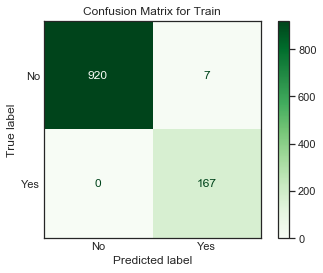

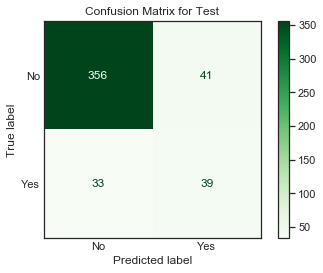

In [133]:
dtree_score= get_metrics_score(dtree, X_train, X_test, y_train, y_test)
add_score_model(dtree_score)

### Observation
##### the decision tree classifier overfitted the  training data, the f1 score is an average value


### Bagging Classifier

In [134]:
bagging_classifier= BaggingClassifier(random_state=100, verbose=1)

bagging_classifier.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.4s finished


BaggingClassifier(random_state=100, verbose=1)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Metric,Train_Acuuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1
Score,0.98446,0.88060,0.91018,0.40278,0.98701,0.69048,0.94704,0.50877


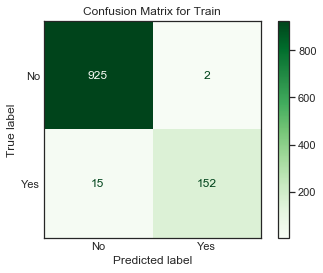

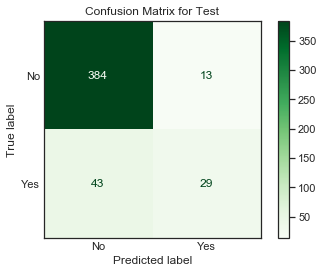

In [135]:
bagging_score= get_metrics_score(bagging_classifier, X_train,X_test, y_train, y_test)
add_score_model(bagging_score)

In [136]:
### Observation
#### the bagging classifier also overfitted the training data with a very low f1 score

### Random Forest Classifier

In [137]:
Rf=  RandomForestClassifier(random_state=1000)
Rf.fit(X_train, y_train)

RandomForestClassifier(random_state=1000)

Metric,Train_Acuuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1
Score,0.99452,0.88273,0.97006,0.29167,0.99387,0.84000,0.98182,0.43299


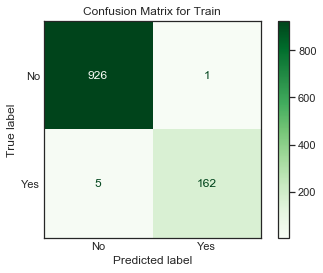

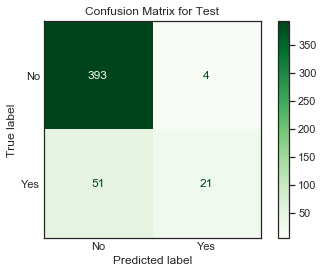

In [138]:
Rf_score= get_metrics_score(Rf, X_train, X_test, y_train, y_test)
add_score_model(Rf_score)

In [139]:
### Random forest classifier is overfitting the model and its f1_score is very low
###  the mpst  important columns are Rececncy, duration_days, and disposable_Income 

In [140]:
feature_names= X_train.columns
importances= Rf.feature_importances_
indices= np.argsort(importances)
print(pd.DataFrame(Rf.feature_importances_, columns=["Imp"], index=X_train.columns).sort_values(by= 'Imp', ascending=False))

                                 Imp
Recency                      0.04402
Cmp1Accepted                 0.03191
Cmp5Accepted                 0.03139
Disposable_Income            0.02612
duration_days                0.02581
poly_12                      0.02359
Marital_Status               0.02229
poly_6                       0.02228
poly_0                       0.02153
Cmp3Accepted                 0.02062
Total_amount_spent           0.01971
poly_19                      0.01859
poly_26                      0.01809
Amount_on_Wines              0.01799
poly_4                       0.01786
Amount_on_GoldProds          0.01666
poly_22                      0.01640
Amount_on_MeatProducts       0.01635
poly1_9                      0.01620
Year_of_Birth                0.01574
poly_27                      0.01574
poly_10                      0.01559
poly1_13                     0.01522
poly_11                      0.01520
poly_20                      0.01519
poly_21                      0.01479
p

### Model Performance Evaluation and Bagging Improvement

In [141]:
comparison_frame= pd.DataFrame({'Model': ['Decision Tree','Bagging Classifer',
                                         'Random Forest'], 'Train_Accuracy':acc_train,
'Test_Accuracy':acc_test, 'Train_Recall':recall_train, 'Test_Recall':recall_test,
'Train_Precision':precision_train, 'Test_Precision':precision_test, 'Train_F1':f1_train,
'Test_F1':f1_test})

## Sorting models in decreasing order of f1_test
comparison_frame.sort_values(by='Test_F1', ascending=False)

,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1
0,Decision Tree,0.99360,0.84222,1.00000,0.54167,0.95977,0.48750,0.97947,0.51316
1,Bagging Classifer,0.98446,0.88060,0.91018,0.40278,0.98701,0.69048,0.94704,0.50877
2,Random Forest,0.99452,0.88273,0.97006,0.29167,0.99387,0.84000,0.98182,0.43299


In [142]:
dtree_tuned= DecisionTreeClassifier(class_weight={0:0.15, 1:0.85 }, random_state=1)

### defining the hyperparameters
parameters={'max_depth':[1,3, 7,15],
            'criterion':['gini', 'entropy'],
            'min_samples_leaf':[2,3,5,7,11],
            'max_leaf_nodes':[3,5,7,10,13,15],
           }
### type of scoring to compare parameter combination
scorer= metrics.make_scorer(metrics.f1_score)

### run the grid search
grid_obj= GridSearchCV(dtree_tuned, parameters, scoring=scorer, n_jobs=-1, cv=5)

grid_obj= grid_obj.fit(X_train, y_train)

###  set to the best parameters combination
dtree_tunned= grid_obj.best_estimator_

### fit the best estimator to the data
dtree_tunned.fit(X_train,y_train)

DecisionTreeClassifier(class_weight={0: 0.15, 1: 0.85}, criterion='entropy',
                       max_depth=7, max_leaf_nodes=15, min_samples_leaf=11,
                       random_state=1)

Metric,Train_Acuuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1
Score,0.75960,0.70576,0.95808,0.83333,0.38462,0.32258,0.54889,0.46512


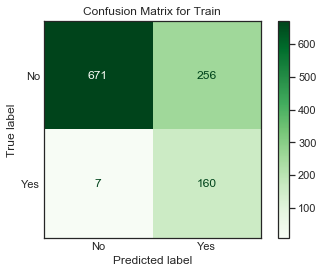

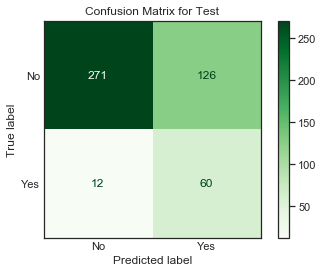

In [143]:
score_tunned_dt= get_metrics_score(dtree_tunned, X_train, X_test, y_train, y_test)
add_score_model(score_tunned_dt)

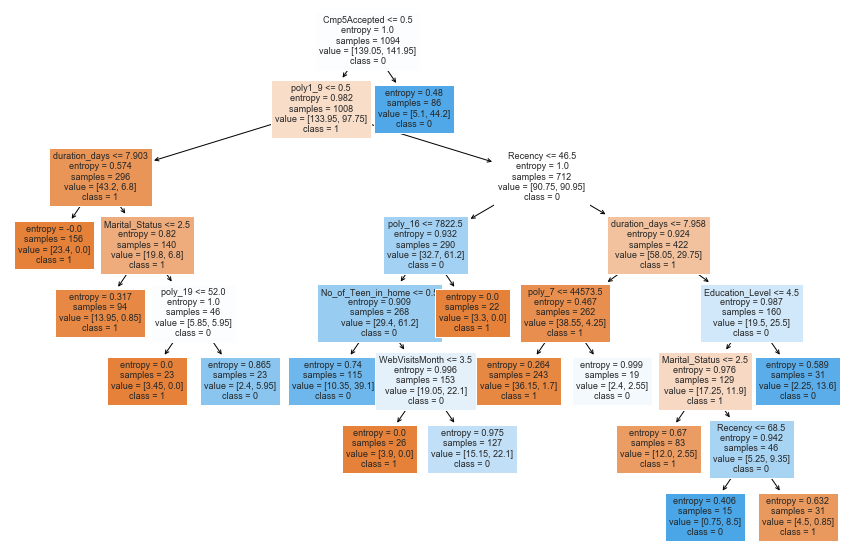

In [144]:
plt.figure(figsize=(15,10))
feature_names = X_train.columns
out = tree.plot_tree(dtree_tunned,feature_names=feature_names,filled=True,fontsize=9,class_names=['1','0'])
for o in out:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor('black')
        arrow.set_linewidth(1)
plt.show()

In [145]:
feature_names= X_train.columns
importances= dtree_tunned.feature_importances_
indices= np.argsort(importances)
print(pd.DataFrame(dtree_tunned.feature_importances_, columns=["Imp"], index=X_train.columns).sort_values(by= 'Imp', ascending=False))

                                 Imp
Cmp5Accepted                 0.22631
duration_days                0.17949
Recency                      0.14972
poly1_9                      0.13113
Marital_Status               0.07811
Education_Level              0.05058
poly_16                      0.03949
poly_7                       0.03826
No_of_Teen_in_home           0.03646
WebVisitsMonth               0.03562
poly_19                      0.03483
poly_5                       0.00000
poly_4                       0.00000
poly_3                       0.00000
poly_2                       0.00000
poly_1                       0.00000
Year_of_Birth                0.00000
poly_0                       0.00000
poly1_14                     0.00000
poly1_13                     0.00000
poly1_12                     0.00000
poly1_11                     0.00000
poly1_10                     0.00000
poly1_8                      0.00000
poly_6                       0.00000
poly_11                      0.00000
p

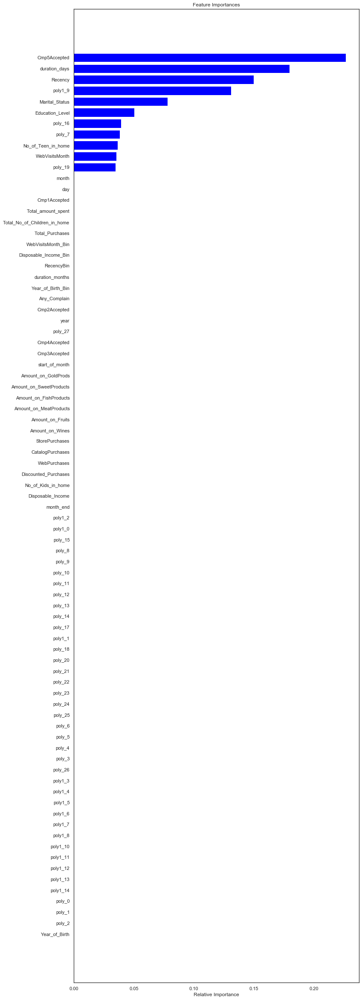

In [146]:
plt.figure(figsize=(12,42))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='blue', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

### Observations
####  the hyperparmeter tunned decision tree is not overfitting, the most import features are Cmp5Accepted_1, duration_days, recency 
####  the f1_score and the precison score is quite low

In [147]:
## set the parameters
parameters = {
              "n_estimators":np.arange(10,60,10),
              "max_features": [0.5,0.7,0.8,0.9],
              "max_samples": [0.7,0.8,0.9], 
             }

# assigning Bootstrap = True to select features with Replacement
bgc1 = BaggingClassifier(random_state=1,bootstrap=True)

# type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.f1_score)

# run the grid search
grid_obj = GridSearchCV(bgc1, parameters, scoring=scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# set the clf to the best combination of parameters
bgcht = grid_obj.best_estimator_

# fit the best algorithm to the data.
bgcht.fit(X_train, y_train)

BaggingClassifier(max_features=0.9, max_samples=0.8, n_estimators=50,
                  random_state=1)

Metric,Train_Acuuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1
Score,0.98995,0.88913,0.94012,0.40278,0.99367,0.76316,0.96615,0.52727


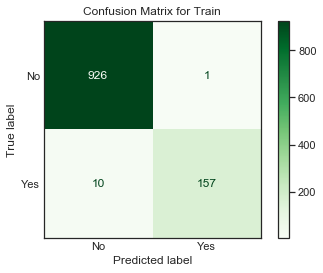

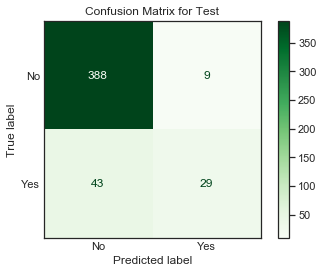

In [148]:
bagging_tuned= get_metrics_score(bgcht, X_train, X_test, y_train, y_test)
add_score_model(bagging_tuned)

### the tuned bagging classifier also overfits the data but it has a better f1_score

In [149]:

comparison_frame = pd.DataFrame({'Model':['Decision Tree',
                                          'Bagging Classifier',
                                          'Random Forest',
                                          'Tuned Decision Tree',
                                          'Tuned Bagging Classifier'], 
                                          'Train_Accuracy': acc_train,'Test_Accuracy': acc_test,
                                          'Train_Recall':recall_train,'Test_Recall':recall_test,
                                          'Train_Precision':precision_train,'Test_Precision':precision_test,
                                          'Train_F1':f1_train,
                                          'Test_F1':f1_test  }) 

#Sorting models in decreasing order of test recall
comparison_frame.sort_values(by='Test_F1',ascending=False)

,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1
4,Tuned Bagging Classifier,0.98995,0.88913,0.94012,0.40278,0.99367,0.76316,0.96615,0.52727
0,Decision Tree,0.99360,0.84222,1.00000,0.54167,0.95977,0.48750,0.97947,0.51316
1,Bagging Classifier,0.98446,0.88060,0.91018,0.40278,0.98701,0.69048,0.94704,0.50877
3,Tuned Decision Tree,0.75960,0.70576,0.95808,0.83333,0.38462,0.32258,0.54889,0.46512
2,Random Forest,0.99452,0.88273,0.97006,0.29167,0.99387,0.84000,0.98182,0.43299


### model Boosting Classifier

#### Adaboost
#### Boosting algorithm requires encoding of the categorical data ,  so we one hot encode the data 

In [150]:
X_boost= pd.get_dummies(Sapa_train, drop_first=True)

In [206]:
### Splitting the dataset into train and test size  of 70:30
X_train_b, X_test_b, y_train, y_test= train_test_split(X_boost, y, test_size=0.30, random_state=1, stratify=y)
X_train_b.shape, X_test_b.shape

((1094, 108), (469, 108))

(469, 108)

In [207]:
adaboost = AdaBoostClassifier(random_state=100)
adaboost.fit(X_train_b,y_train)

AdaBoostClassifier(random_state=100)

Metric,Train_Acuuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1
Score,0.92322,0.87420,0.61677,0.44444,0.83740,0.62745,0.71034,0.52033


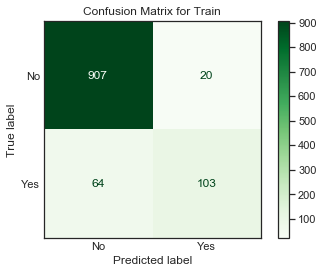

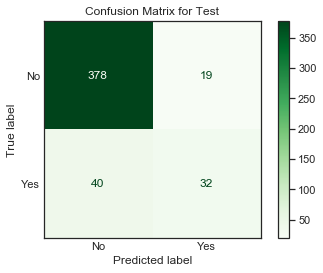

In [208]:
adaboost_score= get_metrics_score(adaboost,X_train_b,X_test_b,y_train,y_test)
add_score_model(adaboost_score)

### model bagging classifier with one hot encoding

In [154]:
bagging_classifier1= BaggingClassifier(random_state=100, verbose=1)

bagging_classifier1.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s finished


BaggingClassifier(random_state=100, verbose=1)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Metric,Train_Acuuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1
Score,0.98263,0.88273,0.89820,0.41667,0.98684,0.69767,0.94044,0.52174


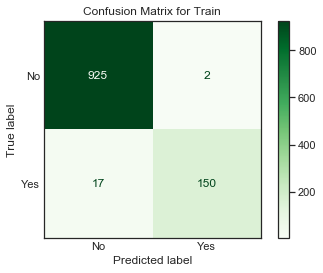

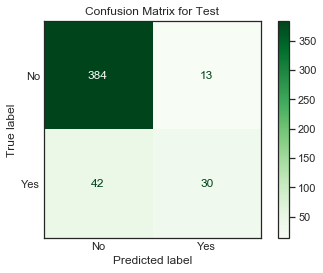

In [155]:

bagging_score= get_metrics_score(bagging_classifier1, X_train_b,X_test_b, y_train, y_test)
add_score_model(bagging_score)

### Observation
#### adaboost is not overfitting the data
#### it has an f1_score of 0.533

In [156]:
gbc= GradientBoostingClassifier(random_state=1)
gbc.fit(X_train_b,y_train)


GradientBoostingClassifier(random_state=1)

Metric,Train_Acuuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1
Score,0.96801,0.90192,0.79042,0.47222,1.00000,0.80952,0.88294,0.59649


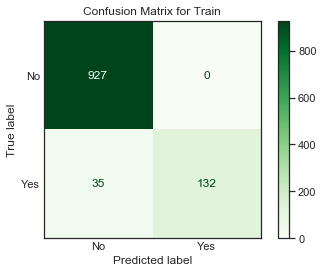

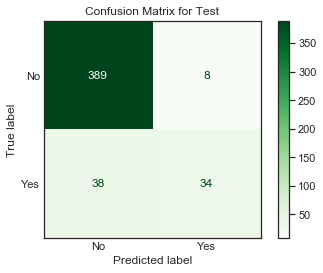

In [157]:
gbc_score= get_metrics_score(gbc,X_train_b,X_test_b,y_train,y_test)
add_score_model(gbc_score)

In [209]:

xgb = XGBClassifier(random_state=1,eval_metric='logloss')
xgb.fit(X_train_b,y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, eval_metric='logloss',
              gamma=0, gpu_id=-1, importance_type='gain',
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=0,
              num_parallel_tree=1, random_state=1, reg_alpha=0, reg_lambda=1,
              scale_pos_weight=1, subsample=1, tree_method='exact',
              validate_parameters=1, verbosity=None)

Metric,Train_Acuuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1
Score,0.99452,0.89339,0.97605,0.45833,0.98788,0.75000,0.98193,0.56897


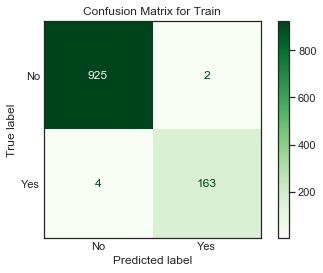

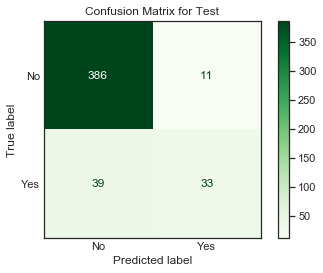

In [210]:
xgb_score=get_metrics_score(xgb,X_train_b,X_test_b,y_train_b,y_test_b)
add_score_model(xgb_score)


In [160]:

comparison_frame = pd.DataFrame({'Model':['Decision Tree',
                                          'Bagging Classifier',
                                          'Random Forest',
                                          'Tuned Decision Tree',
                                          'Tuned Bagging Classifier',
                                           'Adaboost',
                                          'Bagging Classifier1',
                                          'Gradient Boost',
                                          'XGboost'], 
                                          'Train_Accuracy': acc_train,'Test_Accuracy': acc_test,
                                          'Train_Recall':recall_train,'Test_Recall':recall_test,
                                          'Train_Precision':precision_train,'Test_Precision':precision_test,
                                          'Train_F1':f1_train,
                                          'Test_F1':f1_test  }) 

#Sorting models in decreasing order of test recall
comparison_frame.sort_values(by='Test_F1',ascending=False)

,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1
7,Gradient Boost,0.96801,0.90192,0.79042,0.47222,1.00000,0.80952,0.88294,0.59649
8,XGboost,0.99452,0.89339,0.97605,0.45833,0.98788,0.75000,0.98193,0.56897
4,Tuned Bagging Classifier,0.98995,0.88913,0.94012,0.40278,0.99367,0.76316,0.96615,0.52727
6,Bagging Classifier1,0.98263,0.88273,0.89820,0.41667,0.98684,0.69767,0.94044,0.52174
5,Adaboost,0.92322,0.87420,0.61677,0.44444,0.83740,0.62745,0.71034,0.52033
0,Decision Tree,0.99360,0.84222,1.00000,0.54167,0.95977,0.48750,0.97947,0.51316
1,Bagging Classifier,0.98446,0.88060,0.91018,0.40278,0.98701,0.69048,0.94704,0.50877
3,Tuned Decision Tree,0.75960,0.70576,0.95808,0.83333,0.38462,0.32258,0.54889,0.46512
2,Random Forest,0.99452,0.88273,0.97006,0.29167,0.99387,0.84000,0.98182,0.43299


### Model Performance and Evaluation and Improvement-Boosting

In [211]:
# choose the type of classifier. 
abc_tuned = AdaBoostClassifier(random_state=100)

# grid of parameters to choose from
parameters = {
    #let"s try different max_depth for base_estimator
    "base_estimator":[DecisionTreeClassifier(max_depth=1,random_state=1),DecisionTreeClassifier(max_depth=2,random_state=1),
                      DecisionTreeClassifier(max_depth=3,random_state=1)],
    "n_estimators": np.arange(10,60,10),
    "learning_rate": [0.05,0.15,0.45,0.75,0.85,0.9]
}

# type of scoring used to compare parameter  combinations
scorer = metrics.make_scorer(metrics.f1_score)

# run the grid search
grid_obj = GridSearchCV(abc_tuned, parameters, scoring=scorer,cv=5)
grid_obj = grid_obj.fit(X_train_b, y_train)

# set the clf to the best combination of parameters
abc_tuned = grid_obj.best_estimator_

# fit the best algorithm to the data.
abc_tuned.fit(X_train_b, y_train)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=1,
                                                         random_state=1),
                   learning_rate=0.9, n_estimators=30, random_state=100)

Metric,Train_Acuuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1
Score,0.90768,0.87846,0.53293,0.44444,0.79464,0.65306,0.63799,0.52893


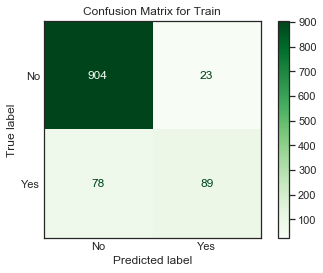

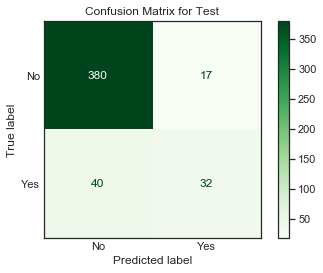

In [212]:

abc_tuned_score=get_metrics_score(abc_tuned,X_train_b,X_test_b,y_train,y_test)
add_score_model(abc_tuned_score)

In [213]:
feature_names= X_train_b.columns
importances= abc_tuned.feature_importances_
indices= np.argsort(importances)
print(pd.DataFrame(abc_tuned.feature_importances_, columns=["Imp"], index=X_train_b.columns).sort_values(by= 'Imp', ascending=False))

                                 Imp
Recency                      0.13333
duration_days                0.10000
poly1_9                      0.06667
StorePurchases               0.06667
poly_12                      0.06667
poly1_3                      0.03333
Cmp5Accepted_1               0.03333
Cmp1Accepted_1               0.03333
Cmp3Accepted_1               0.03333
poly_19                      0.03333
poly1_13                     0.03333
Marital_Status_2             0.03333
Marital_Status_7             0.03333
Marital_Status_1             0.03333
poly_4                       0.03333
Education_Level_5            0.03333
Cmp4Accepted_1               0.03333
Education_Level_1            0.03333
WebVisitsMonth_Bin_0         0.03333
No_of_Teen_in_home           0.03333
Amount_on_Wines              0.03333
Amount_on_GoldProds          0.03333
Marital_Status_5             0.00000
poly_26                      0.00000
Marital_Status_3             0.00000
poly_25                      0.00000
p

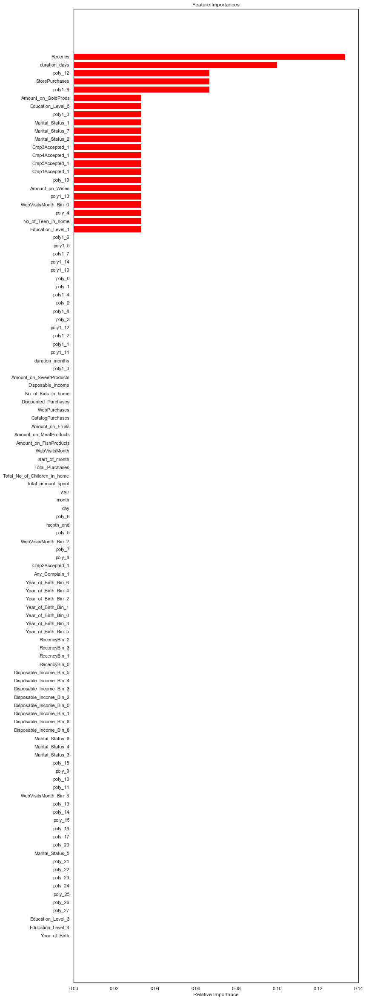

In [214]:
plt.figure(figsize=(12,42))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='red', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

In [215]:
# Choose the type of classifier. 
gbc_tuned = GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),random_state=1)

# Grid of parameters to choose from
parameters = {
    "n_estimators": np.arange(10,60,5),
    "subsample":[0.6,0.7,0.8],
    "max_features":[0.6,0.7,0.8],
    "learning_rate": [0.05,0.15,0.45,0.5]
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.f1_score)

# Run the grid search
grid_obj = GridSearchCV(gbc_tuned, parameters, scoring=scorer,cv=5)
grid_obj = grid_obj.fit(X_train_b, y_train)

# Set the clf to the best combination of parameters
gbc_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
gbc_tuned.fit(X_train_b, y_train)

GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),
                           learning_rate=0.45, max_features=0.7,
                           n_estimators=30, random_state=1, subsample=0.6)

Metric,Train_Acuuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1
Score,0.95521,0.88486,0.76048,0.41667,0.93382,0.71429,0.83828,0.52632


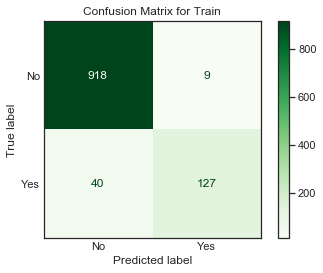

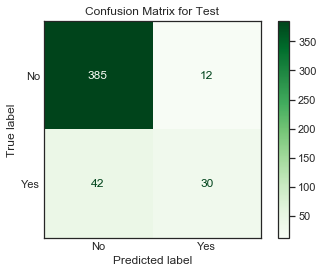

In [216]:
gbc_tuned_score= get_metrics_score(gbc_tuned, X_train_b, X_test_b, y_train, y_test)
add_score_model(gbc_tuned_score)

In [217]:
feature_names= X_train_b.columns
importances= gbc_tuned.feature_importances_
indices= np.argsort(importances)
print(pd.DataFrame(gbc_tuned.feature_importances_, columns=["Imp"], index=X_train_b.columns).sort_values(by= 'Imp', ascending=False))

                                 Imp
duration_days                0.18701
Cmp5Accepted_1               0.07232
Recency                      0.06534
Cmp1Accepted_1               0.04554
Cmp3Accepted_1               0.04364
poly_26                      0.03154
poly_22                      0.02758
Marital_Status_1             0.02423
poly_16                      0.02367
poly1_6                      0.02079
poly1_14                     0.02051
poly1_5                      0.02001
poly1_9                      0.01987
Amount_on_FishProducts       0.01924
Amount_on_Wines              0.01809
Marital_Status_2             0.01747
RecencyBin_0                 0.01740
poly_23                      0.01728
poly_27                      0.01577
poly_6                       0.01513
Marital_Status_7             0.01507
poly_20                      0.01481
WebVisitsMonth               0.01457
poly_15                      0.01430
poly_9                       0.01340
Total_No_of_Children_in_home 0.01336
p

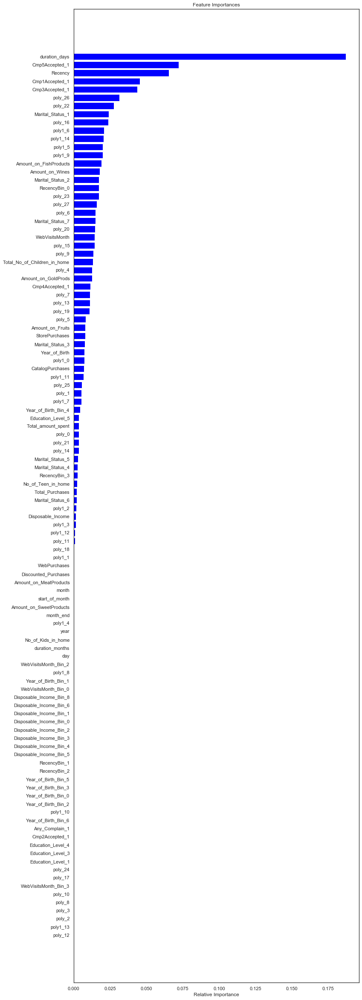

In [218]:
plt.figure(figsize=(12,42))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='blue', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

In [219]:
### Tuned Xgboost Classifier

In [220]:
# choose the classifier
xgb_tuned = XGBClassifier(random_state=1, eval_metric="logloss")

# Grid of parameters to choose from
parameters = {
    "n_estimators": np.arange(10,60,10),
    "subsample":[0.6,0.7,0.8],
    "learning_rate":[0.1,0.3,0.55],
    "colsample_bytree":[0.4,0.5,0.7,0.9],
    "colsample_bylevel":[0.3,0.5,0.7,0.9]
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.f1_score)

# Run the grid search
grid_obj = GridSearchCV(xgb_tuned, parameters,scoring=scorer,cv=5)
grid_obj = grid_obj.fit(X_train_b, y_train)

# Set the clf to the best combination of parameters
xgb_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
xgb_tuned.fit(X_train_b, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=0.3,
              colsample_bynode=1, colsample_bytree=0.4, eval_metric='logloss',
              gamma=0, gpu_id=-1, importance_type='gain',
              interaction_constraints='', learning_rate=0.55, max_delta_step=0,
              max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=10, n_jobs=0,
              num_parallel_tree=1, random_state=1, reg_alpha=0, reg_lambda=1,
              scale_pos_weight=1, subsample=0.8, tree_method='exact',
              validate_parameters=1, verbosity=None)

Metric,Train_Acuuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1
Score,0.97349,0.86354,0.85030,0.34722,0.97260,0.59524,0.90735,0.43860


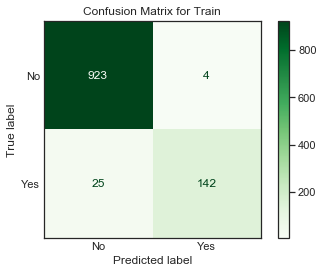

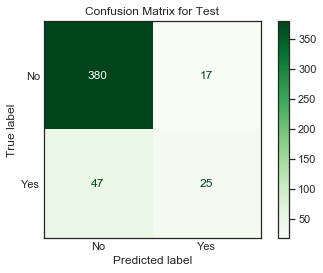

In [221]:
xgb_tuned_score= get_metrics_score(xgb_tuned, X_train_b, X_test_b, y_train, y_test)
add_score_model(xgb_tuned_score)

#### the f1 score results does not look impressive,
####  so we are going to drop most of our newly generated features because we are making an assumption that this newly generated features would not be available for feature prediction, and apply stratified kfold instead of train test split

### Model Performance and Hyperparmaeter tuning using optuna and Lightgbm Classifier

In [222]:
### the new features to be used
new_feats= ['Year_of_Birth', 'Education_Level', 'Marital_Status',
       'Disposable_Income', 'No_of_Kids_in_home', 'No_of_Teen_in_home',
        'Recency', 'Discounted_Purchases', 'WebPurchases',
       'CatalogPurchases', 'StorePurchases', 'Amount_on_Wines',
       'Amount_on_Fruits', 'Amount_on_MeatProducts', 'Amount_on_FishProducts',
       'Amount_on_SweetProducts', 'Amount_on_GoldProds', 'WebVisitsMonth',
       'Cmp3Accepted', 'Cmp4Accepted', 'Cmp5Accepted', 'Cmp1Accepted',
       'Cmp2Accepted', 'Any_Complain','year', 'month', 'day', 'duration_days',
       'duration_months', 'month_end', 'start_of_month']



In [223]:
X_=Sapa_train[new_feats]
X_.columns

Index(['Year_of_Birth', 'Education_Level', 'Marital_Status',
       'Disposable_Income', 'No_of_Kids_in_home', 'No_of_Teen_in_home',
       'Recency', 'Discounted_Purchases', 'WebPurchases', 'CatalogPurchases',
       'StorePurchases', 'Amount_on_Wines', 'Amount_on_Fruits',
       'Amount_on_MeatProducts', 'Amount_on_FishProducts',
       'Amount_on_SweetProducts', 'Amount_on_GoldProds', 'WebVisitsMonth',
       'Cmp3Accepted', 'Cmp4Accepted', 'Cmp5Accepted', 'Cmp1Accepted',
       'Cmp2Accepted', 'Any_Complain', 'year', 'month', 'day', 'duration_days',
       'duration_months', 'month_end', 'start_of_month'],
      dtype='object')

In [224]:
def objective(trial):
    
    oof_f1 =[]
    



    param= {
    'learning_rate':trial.suggest_float('learning_rate', (1*(10)**-2), 0.25, log=True),

 ##   'objective':'Logloss',

    'subsample': trial.suggest_float('subsample', 0.1, 1.0),
    'colsample_bytree': trial.suggest_float( 'colsample_bytree', 0.1, 1.0),
    'max_depth' :trial.suggest_int('max_depth', 5, 20),
    'scale_pos_weight':  trial.suggest_int('scale_pos_weight',3, 10),
                                         

    }
    
    fold =StratifiedKFold(n_splits=5)
    i=1
    for train_index, test_index in fold.split(X_,y):
        X_train_n , X_test_n  = X.iloc[train_index], X.iloc[test_index]
        y_train_n, y_test_n = y.iloc[train_index], y.iloc[test_index]
        
        
        LGBM_tuned= LGBMClassifier(**param, n_estimators=1000, random_state=1)
        LGBM_tuned.fit(X_train_n, y_train_n, eval_set=[(X_train_n, y_train_n), (X_test_n, y_test_n)], early_stopping_rounds=300, verbose=False)
        
        preds= LGBM_tuned.predict(X_test_n)
        oof_f1.append(f1_score(y_test_n, preds))
    return np.mean(oof_f1)
                      
    


                                         



In [225]:
study =optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=700)

[I 2022-01-19 04:51:34,216] A new study created in memory with name: no-name-a52dbbb3-4c82-4eef-9557-48d3454cd09a
[I 2022-01-19 04:52:01,129] Trial 0 finished with value: 0.5597211645154675 and parameters: {'learning_rate': 0.010466502741432133, 'subsample': 0.6988740083711175, 'colsample_bytree': 0.4374431234124657, 'max_depth': 19, 'scale_pos_weight': 4}. Best is trial 0 with value: 0.5597211645154675.
[I 2022-01-19 04:52:16,235] Trial 1 finished with value: 0.597681460437631 and parameters: {'learning_rate': 0.03737272548819405, 'subsample': 0.7085775731285572, 'colsample_bytree': 0.39680822475106836, 'max_depth': 17, 'scale_pos_weight': 10}. Best is trial 1 with value: 0.597681460437631.
[I 2022-01-19 04:52:25,480] Trial 2 finished with value: 0.5575230027565061 and parameters: {'learning_rate': 0.043667648768272296, 'subsample': 0.3033579452880817, 'colsample_bytree': 0.15803080210249432, 'max_depth': 7, 'scale_pos_weight': 4}. Best is trial 1 with value: 0.597681460437631.
[I 202

[I 2022-01-19 04:58:26,089] Trial 27 finished with value: 0.5782636263465495 and parameters: {'learning_rate': 0.02430147646398643, 'subsample': 0.770507644311094, 'colsample_bytree': 0.49915930494838373, 'max_depth': 9, 'scale_pos_weight': 8}. Best is trial 9 with value: 0.6049042557273878.
[I 2022-01-19 04:58:45,392] Trial 28 finished with value: 0.5748678167217471 and parameters: {'learning_rate': 0.032927368100685396, 'subsample': 0.8378863301426532, 'colsample_bytree': 0.7164044150659408, 'max_depth': 18, 'scale_pos_weight': 9}. Best is trial 9 with value: 0.6049042557273878.
[I 2022-01-19 04:58:58,359] Trial 29 finished with value: 0.5896951792640368 and parameters: {'learning_rate': 0.04882862520541416, 'subsample': 0.6770527505775741, 'colsample_bytree': 0.44267355555609506, 'max_depth': 13, 'scale_pos_weight': 6}. Best is trial 9 with value: 0.6049042557273878.
[I 2022-01-19 04:59:10,007] Trial 30 finished with value: 0.5693544648681839 and parameters: {'learning_rate': 0.0662

[I 2022-01-19 05:04:40,916] Trial 54 finished with value: 0.5898129247663941 and parameters: {'learning_rate': 0.02883768000672634, 'subsample': 0.6207117796445846, 'colsample_bytree': 0.8582685136266606, 'max_depth': 12, 'scale_pos_weight': 7}. Best is trial 38 with value: 0.6050380316507848.
[I 2022-01-19 05:04:52,907] Trial 55 finished with value: 0.5938153157413538 and parameters: {'learning_rate': 0.1646311998739506, 'subsample': 0.46125350767460793, 'colsample_bytree': 0.9593607027695488, 'max_depth': 15, 'scale_pos_weight': 9}. Best is trial 38 with value: 0.6050380316507848.
[I 2022-01-19 05:05:02,888] Trial 56 finished with value: 0.5863704706839525 and parameters: {'learning_rate': 0.1883517683884829, 'subsample': 0.36784056123824715, 'colsample_bytree': 0.7989073858714923, 'max_depth': 9, 'scale_pos_weight': 8}. Best is trial 38 with value: 0.6050380316507848.
[I 2022-01-19 05:05:19,420] Trial 57 finished with value: 0.5798166673116768 and parameters: {'learning_rate': 0.036

[I 2022-01-19 05:09:10,262] Trial 81 finished with value: 0.5852359916298535 and parameters: {'learning_rate': 0.2035985710069602, 'subsample': 0.3816634996483438, 'colsample_bytree': 0.8386604011667282, 'max_depth': 7, 'scale_pos_weight': 7}. Best is trial 73 with value: 0.6149925129056008.
[I 2022-01-19 05:09:18,976] Trial 82 finished with value: 0.579714236437691 and parameters: {'learning_rate': 0.2444599868491832, 'subsample': 0.4026479799598127, 'colsample_bytree': 0.8903813910798678, 'max_depth': 6, 'scale_pos_weight': 6}. Best is trial 73 with value: 0.6149925129056008.
[I 2022-01-19 05:09:27,643] Trial 83 finished with value: 0.5985882079209672 and parameters: {'learning_rate': 0.2258091785957489, 'subsample': 0.32131177088375135, 'colsample_bytree': 0.8678355160833069, 'max_depth': 5, 'scale_pos_weight': 5}. Best is trial 73 with value: 0.6149925129056008.
[I 2022-01-19 05:09:36,152] Trial 84 finished with value: 0.6032673660967776 and parameters: {'learning_rate': 0.22273521

[I 2022-01-19 05:13:34,256] Trial 108 finished with value: 0.5702313730654704 and parameters: {'learning_rate': 0.17458839019624925, 'subsample': 0.4025698216503771, 'colsample_bytree': 0.874509385831324, 'max_depth': 15, 'scale_pos_weight': 5}. Best is trial 73 with value: 0.6149925129056008.
[I 2022-01-19 05:13:43,011] Trial 109 finished with value: 0.6077551800180554 and parameters: {'learning_rate': 0.21012643952555093, 'subsample': 0.35392361468526956, 'colsample_bytree': 0.9439496000455788, 'max_depth': 5, 'scale_pos_weight': 6}. Best is trial 73 with value: 0.6149925129056008.
[I 2022-01-19 05:13:56,270] Trial 110 finished with value: 0.574483480192631 and parameters: {'learning_rate': 0.12637324088347263, 'subsample': 0.3508191293782211, 'colsample_bytree': 0.9080308496550653, 'max_depth': 7, 'scale_pos_weight': 6}. Best is trial 73 with value: 0.6149925129056008.
[I 2022-01-19 05:14:04,889] Trial 111 finished with value: 0.5952425777938005 and parameters: {'learning_rate': 0.2

[I 2022-01-19 05:17:54,120] Trial 135 finished with value: 0.5582020711714744 and parameters: {'learning_rate': 0.24992005199585138, 'subsample': 0.2240511399268216, 'colsample_bytree': 0.919829036035198, 'max_depth': 6, 'scale_pos_weight': 4}. Best is trial 73 with value: 0.6149925129056008.
[I 2022-01-19 05:18:02,326] Trial 136 finished with value: 0.5952956176494026 and parameters: {'learning_rate': 0.20656877271216603, 'subsample': 0.6007880651132791, 'colsample_bytree': 0.8357757604012973, 'max_depth': 5, 'scale_pos_weight': 3}. Best is trial 73 with value: 0.6149925129056008.
[I 2022-01-19 05:18:14,364] Trial 137 finished with value: 0.5959181809948423 and parameters: {'learning_rate': 0.1421859094467232, 'subsample': 0.4417989878607686, 'colsample_bytree': 0.8788280128259134, 'max_depth': 13, 'scale_pos_weight': 4}. Best is trial 73 with value: 0.6149925129056008.
[I 2022-01-19 05:18:23,366] Trial 138 finished with value: 0.6116530122020867 and parameters: {'learning_rate': 0.23

[I 2022-01-19 05:22:19,592] Trial 162 finished with value: 0.5986891569415841 and parameters: {'learning_rate': 0.1353487229600919, 'subsample': 0.1277676999092049, 'colsample_bytree': 0.5693308920346671, 'max_depth': 6, 'scale_pos_weight': 8}. Best is trial 158 with value: 0.6247635044162445.
[I 2022-01-19 05:22:30,016] Trial 163 finished with value: 0.5710202765586111 and parameters: {'learning_rate': 0.20273229292889805, 'subsample': 0.116830144083788, 'colsample_bytree': 0.9256341105066903, 'max_depth': 7, 'scale_pos_weight': 8}. Best is trial 158 with value: 0.6247635044162445.
[I 2022-01-19 05:22:41,208] Trial 164 finished with value: 0.5803043653791414 and parameters: {'learning_rate': 0.17726210676107526, 'subsample': 0.10175744791171641, 'colsample_bytree': 0.9052731648256122, 'max_depth': 15, 'scale_pos_weight': 8}. Best is trial 158 with value: 0.6247635044162445.
[I 2022-01-19 05:22:53,006] Trial 165 finished with value: 0.6003907767553657 and parameters: {'learning_rate': 

[I 2022-01-19 05:27:25,072] Trial 189 finished with value: 0.6015914955783368 and parameters: {'learning_rate': 0.20700168264588678, 'subsample': 0.19270217016363017, 'colsample_bytree': 0.9119670641999361, 'max_depth': 5, 'scale_pos_weight': 8}. Best is trial 158 with value: 0.6247635044162445.
[I 2022-01-19 05:27:35,653] Trial 190 finished with value: 0.5711031865067218 and parameters: {'learning_rate': 0.1683708093916631, 'subsample': 0.16115847209094206, 'colsample_bytree': 0.9642354928956949, 'max_depth': 6, 'scale_pos_weight': 8}. Best is trial 158 with value: 0.6247635044162445.
[I 2022-01-19 05:27:46,208] Trial 191 finished with value: 0.5958985908985909 and parameters: {'learning_rate': 0.12216713903103389, 'subsample': 0.4785097344648603, 'colsample_bytree': 0.8799764284758506, 'max_depth': 5, 'scale_pos_weight': 8}. Best is trial 158 with value: 0.6247635044162445.
[I 2022-01-19 05:27:59,399] Trial 192 finished with value: 0.5692052314997145 and parameters: {'learning_rate':

[I 2022-01-19 05:31:48,898] Trial 216 finished with value: 0.5951484943163232 and parameters: {'learning_rate': 0.20269418601488176, 'subsample': 0.5266080583750304, 'colsample_bytree': 0.8760326737622905, 'max_depth': 6, 'scale_pos_weight': 7}. Best is trial 158 with value: 0.6247635044162445.
[I 2022-01-19 05:31:58,309] Trial 217 finished with value: 0.5964732803329594 and parameters: {'learning_rate': 0.18018464909974477, 'subsample': 0.1458749494802982, 'colsample_bytree': 0.9337699782451808, 'max_depth': 5, 'scale_pos_weight': 8}. Best is trial 158 with value: 0.6247635044162445.
[I 2022-01-19 05:32:06,730] Trial 218 finished with value: 0.5956708777099015 and parameters: {'learning_rate': 0.23625943290078183, 'subsample': 0.4895193426440649, 'colsample_bytree': 0.9591285618727032, 'max_depth': 5, 'scale_pos_weight': 3}. Best is trial 158 with value: 0.6247635044162445.
[I 2022-01-19 05:32:16,039] Trial 219 finished with value: 0.6124318715405306 and parameters: {'learning_rate': 

[I 2022-01-19 05:36:48,024] Trial 243 finished with value: 0.6123188353627612 and parameters: {'learning_rate': 0.21513927799552687, 'subsample': 0.40475687423360596, 'colsample_bytree': 0.9151597657038951, 'max_depth': 5, 'scale_pos_weight': 8}. Best is trial 158 with value: 0.6247635044162445.
[I 2022-01-19 05:36:58,525] Trial 244 finished with value: 0.617498017603618 and parameters: {'learning_rate': 0.16779727647409368, 'subsample': 0.42194612213298527, 'colsample_bytree': 0.9174188152813322, 'max_depth': 5, 'scale_pos_weight': 8}. Best is trial 158 with value: 0.6247635044162445.
[I 2022-01-19 05:37:08,403] Trial 245 finished with value: 0.5882593724173016 and parameters: {'learning_rate': 0.15507517718742753, 'subsample': 0.42584433228470286, 'colsample_bytree': 0.892916864872846, 'max_depth': 5, 'scale_pos_weight': 8}. Best is trial 158 with value: 0.6247635044162445.
[I 2022-01-19 05:37:16,936] Trial 246 finished with value: 0.5970621797857476 and parameters: {'learning_rate':

[I 2022-01-19 05:41:17,359] Trial 270 finished with value: 0.5715107213648747 and parameters: {'learning_rate': 0.18464605514023008, 'subsample': 0.11580385591259348, 'colsample_bytree': 0.9823279068075114, 'max_depth': 13, 'scale_pos_weight': 4}. Best is trial 158 with value: 0.6247635044162445.
[I 2022-01-19 05:41:27,134] Trial 271 finished with value: 0.5943019361069263 and parameters: {'learning_rate': 0.21909484661038484, 'subsample': 0.1475190954605896, 'colsample_bytree': 0.9372330010942466, 'max_depth': 6, 'scale_pos_weight': 9}. Best is trial 158 with value: 0.6247635044162445.
[I 2022-01-19 05:41:35,925] Trial 272 finished with value: 0.5999797857287243 and parameters: {'learning_rate': 0.19911709413570824, 'subsample': 0.10035947309084857, 'colsample_bytree': 0.8983230725610567, 'max_depth': 5, 'scale_pos_weight': 7}. Best is trial 158 with value: 0.6247635044162445.
[I 2022-01-19 05:41:51,632] Trial 273 finished with value: 0.5844894645538635 and parameters: {'learning_rate

[I 2022-01-19 05:45:21,296] Trial 297 finished with value: 0.5999870276772266 and parameters: {'learning_rate': 0.2054148165888866, 'subsample': 0.4125542870389016, 'colsample_bytree': 0.8837946580907665, 'max_depth': 6, 'scale_pos_weight': 9}. Best is trial 287 with value: 0.6260467681243651.
[I 2022-01-19 05:45:30,049] Trial 298 finished with value: 0.6131380578439403 and parameters: {'learning_rate': 0.23535317245513823, 'subsample': 0.4320794285160839, 'colsample_bytree': 0.9255114404585123, 'max_depth': 5, 'scale_pos_weight': 10}. Best is trial 287 with value: 0.6260467681243651.
[I 2022-01-19 05:45:38,627] Trial 299 finished with value: 0.5981235529901923 and parameters: {'learning_rate': 0.23717359940976504, 'subsample': 0.3905403301200841, 'colsample_bytree': 0.9245940586190905, 'max_depth': 5, 'scale_pos_weight': 10}. Best is trial 287 with value: 0.6260467681243651.
[I 2022-01-19 05:45:49,660] Trial 300 finished with value: 0.5800268987148883 and parameters: {'learning_rate':

[I 2022-01-19 05:49:42,946] Trial 324 finished with value: 0.5952429729305487 and parameters: {'learning_rate': 0.014968736073929838, 'subsample': 0.7487390078219178, 'colsample_bytree': 0.8192525619601188, 'max_depth': 5, 'scale_pos_weight': 8}. Best is trial 287 with value: 0.6260467681243651.
[I 2022-01-19 05:49:53,268] Trial 325 finished with value: 0.5911917514504976 and parameters: {'learning_rate': 0.23567959548610456, 'subsample': 0.9219249435794813, 'colsample_bytree': 0.884804637869807, 'max_depth': 6, 'scale_pos_weight': 8}. Best is trial 287 with value: 0.6260467681243651.
[I 2022-01-19 05:50:02,582] Trial 326 finished with value: 0.5917242626454834 and parameters: {'learning_rate': 0.18354437247233374, 'subsample': 0.4909622059904441, 'colsample_bytree': 0.8991874417753679, 'max_depth': 5, 'scale_pos_weight': 10}. Best is trial 287 with value: 0.6260467681243651.
[I 2022-01-19 05:50:11,123] Trial 327 finished with value: 0.5942595627984043 and parameters: {'learning_rate':

[I 2022-01-19 05:54:15,315] Trial 351 finished with value: 0.5802252007674855 and parameters: {'learning_rate': 0.23581490834437846, 'subsample': 0.739039462290917, 'colsample_bytree': 0.9477157853015197, 'max_depth': 6, 'scale_pos_weight': 8}. Best is trial 287 with value: 0.6260467681243651.
[I 2022-01-19 05:54:24,646] Trial 352 finished with value: 0.5904380634655864 and parameters: {'learning_rate': 0.18337170834371097, 'subsample': 0.4651385457414443, 'colsample_bytree': 0.8820091526940967, 'max_depth': 5, 'scale_pos_weight': 9}. Best is trial 287 with value: 0.6260467681243651.
[I 2022-01-19 05:54:34,574] Trial 353 finished with value: 0.6044261503033801 and parameters: {'learning_rate': 0.15139844769839025, 'subsample': 0.4293342801543411, 'colsample_bytree': 0.9719215732849998, 'max_depth': 5, 'scale_pos_weight': 8}. Best is trial 287 with value: 0.6260467681243651.
[I 2022-01-19 05:54:43,464] Trial 354 finished with value: 0.5690230307759283 and parameters: {'learning_rate': 0

[I 2022-01-19 05:58:59,341] Trial 378 finished with value: 0.5809397424933194 and parameters: {'learning_rate': 0.18884769557430311, 'subsample': 0.5433353478409293, 'colsample_bytree': 0.9785781351523943, 'max_depth': 7, 'scale_pos_weight': 9}. Best is trial 287 with value: 0.6260467681243651.
[I 2022-01-19 05:59:08,583] Trial 379 finished with value: 0.5940445389635375 and parameters: {'learning_rate': 0.2498285605748083, 'subsample': 0.5834525235184099, 'colsample_bytree': 0.9598204456623289, 'max_depth': 6, 'scale_pos_weight': 9}. Best is trial 287 with value: 0.6260467681243651.
[I 2022-01-19 05:59:18,147] Trial 380 finished with value: 0.589037106310362 and parameters: {'learning_rate': 0.2241370276667638, 'subsample': 0.525097832478308, 'colsample_bytree': 0.9447826264627802, 'max_depth': 6, 'scale_pos_weight': 9}. Best is trial 287 with value: 0.6260467681243651.
[I 2022-01-19 05:59:29,987] Trial 381 finished with value: 0.5813107154791652 and parameters: {'learning_rate': 0.17

[I 2022-01-19 06:03:24,844] Trial 405 finished with value: 0.5940235729322357 and parameters: {'learning_rate': 0.21304863013721761, 'subsample': 0.4109683792105089, 'colsample_bytree': 0.8395123988998598, 'max_depth': 7, 'scale_pos_weight': 9}. Best is trial 287 with value: 0.6260467681243651.
[I 2022-01-19 06:03:34,191] Trial 406 finished with value: 0.6001305241563649 and parameters: {'learning_rate': 0.19090169321427994, 'subsample': 0.510694859564172, 'colsample_bytree': 0.7988598256116207, 'max_depth': 6, 'scale_pos_weight': 9}. Best is trial 287 with value: 0.6260467681243651.
[I 2022-01-19 06:03:43,439] Trial 407 finished with value: 0.5872324877335838 and parameters: {'learning_rate': 0.20247936032516536, 'subsample': 0.43242715358771294, 'colsample_bytree': 0.8190049138498938, 'max_depth': 6, 'scale_pos_weight': 9}. Best is trial 287 with value: 0.6260467681243651.
[I 2022-01-19 06:03:53,938] Trial 408 finished with value: 0.6007107601919033 and parameters: {'learning_rate': 

[I 2022-01-19 06:08:26,175] Trial 432 finished with value: 0.5808438636491626 and parameters: {'learning_rate': 0.23595177927446542, 'subsample': 0.46011707049536366, 'colsample_bytree': 0.928926083198568, 'max_depth': 5, 'scale_pos_weight': 9}. Best is trial 287 with value: 0.6260467681243651.
[I 2022-01-19 06:08:35,713] Trial 433 finished with value: 0.5774040264935405 and parameters: {'learning_rate': 0.11929143342591474, 'subsample': 0.49928427835186234, 'colsample_bytree': 0.8384972898557438, 'max_depth': 5, 'scale_pos_weight': 5}. Best is trial 287 with value: 0.6260467681243651.
[I 2022-01-19 06:08:46,469] Trial 434 finished with value: 0.5947324637889693 and parameters: {'learning_rate': 0.17482927184152552, 'subsample': 0.5743062661293555, 'colsample_bytree': 0.9993654753912203, 'max_depth': 6, 'scale_pos_weight': 3}. Best is trial 287 with value: 0.6260467681243651.
[I 2022-01-19 06:08:55,416] Trial 435 finished with value: 0.602384761216936 and parameters: {'learning_rate': 

[I 2022-01-19 06:12:56,846] Trial 459 finished with value: 0.6052208079470022 and parameters: {'learning_rate': 0.2345417599158358, 'subsample': 0.4036602080754247, 'colsample_bytree': 0.9226235005550335, 'max_depth': 5, 'scale_pos_weight': 8}. Best is trial 450 with value: 0.6284383703637891.
[I 2022-01-19 06:13:05,785] Trial 460 finished with value: 0.5921732008688532 and parameters: {'learning_rate': 0.19806846268362205, 'subsample': 0.42315791024044613, 'colsample_bytree': 0.9083665813764845, 'max_depth': 5, 'scale_pos_weight': 9}. Best is trial 450 with value: 0.6284383703637891.
[I 2022-01-19 06:13:14,521] Trial 461 finished with value: 0.5974722798685932 and parameters: {'learning_rate': 0.2218599746061835, 'subsample': 0.4676393883721036, 'colsample_bytree': 0.9477251733327358, 'max_depth': 5, 'scale_pos_weight': 7}. Best is trial 450 with value: 0.6284383703637891.
[I 2022-01-19 06:13:24,346] Trial 462 finished with value: 0.5780466447133115 and parameters: {'learning_rate': 0

[I 2022-01-19 06:17:46,013] Trial 486 finished with value: 0.603754043950669 and parameters: {'learning_rate': 0.22008209461813882, 'subsample': 0.4774417254551073, 'colsample_bytree': 0.9674533079382844, 'max_depth': 5, 'scale_pos_weight': 9}. Best is trial 450 with value: 0.6284383703637891.
[I 2022-01-19 06:17:57,179] Trial 487 finished with value: 0.5600644909126442 and parameters: {'learning_rate': 0.24969149824705103, 'subsample': 0.34206855881938586, 'colsample_bytree': 0.9448332242641071, 'max_depth': 9, 'scale_pos_weight': 3}. Best is trial 450 with value: 0.6284383703637891.
[I 2022-01-19 06:18:06,581] Trial 488 finished with value: 0.5910157384064388 and parameters: {'learning_rate': 0.22929359574903296, 'subsample': 0.4094657293259338, 'colsample_bytree': 0.743462965016591, 'max_depth': 16, 'scale_pos_weight': 5}. Best is trial 450 with value: 0.6284383703637891.
[I 2022-01-19 06:18:14,554] Trial 489 finished with value: 0.5857315326210023 and parameters: {'learning_rate': 

[I 2022-01-19 06:22:06,308] Trial 513 finished with value: 0.6140556315980273 and parameters: {'learning_rate': 0.22719145778684527, 'subsample': 0.4239196792877313, 'colsample_bytree': 0.9064274281570175, 'max_depth': 5, 'scale_pos_weight': 8}. Best is trial 450 with value: 0.6284383703637891.
[I 2022-01-19 06:22:13,312] Trial 514 finished with value: 0.5684444306057209 and parameters: {'learning_rate': 0.21553200923975802, 'subsample': 0.4007932464515063, 'colsample_bytree': 0.5562217642554685, 'max_depth': 5, 'scale_pos_weight': 8}. Best is trial 450 with value: 0.6284383703637891.
[I 2022-01-19 06:22:23,829] Trial 515 finished with value: 0.5983653688987707 and parameters: {'learning_rate': 0.1685489808693283, 'subsample': 0.36419622462489387, 'colsample_bytree': 0.8756850789103948, 'max_depth': 6, 'scale_pos_weight': 8}. Best is trial 450 with value: 0.6284383703637891.
[I 2022-01-19 06:22:33,190] Trial 516 finished with value: 0.6110309220720292 and parameters: {'learning_rate': 

[I 2022-01-19 06:26:34,395] Trial 540 finished with value: 0.5964013819104335 and parameters: {'learning_rate': 0.2495605973981264, 'subsample': 0.37839525922193074, 'colsample_bytree': 0.4453145633620251, 'max_depth': 6, 'scale_pos_weight': 8}. Best is trial 450 with value: 0.6284383703637891.
[I 2022-01-19 06:26:43,491] Trial 541 finished with value: 0.5926236741689765 and parameters: {'learning_rate': 0.21310054085388722, 'subsample': 0.3142989120590185, 'colsample_bytree': 0.8560354825282139, 'max_depth': 6, 'scale_pos_weight': 5}. Best is trial 450 with value: 0.6284383703637891.
[I 2022-01-19 06:26:52,554] Trial 542 finished with value: 0.5847111651235363 and parameters: {'learning_rate': 0.22569868055820208, 'subsample': 0.42234497897519246, 'colsample_bytree': 0.999882478873216, 'max_depth': 5, 'scale_pos_weight': 9}. Best is trial 450 with value: 0.6284383703637891.
[I 2022-01-19 06:27:02,429] Trial 543 finished with value: 0.6004743023299725 and parameters: {'learning_rate': 

[I 2022-01-19 06:30:50,077] Trial 567 finished with value: 0.6006972870737581 and parameters: {'learning_rate': 0.20574952604836932, 'subsample': 0.24342949019112392, 'colsample_bytree': 0.8425928377280988, 'max_depth': 6, 'scale_pos_weight': 8}. Best is trial 450 with value: 0.6284383703637891.
[I 2022-01-19 06:30:58,656] Trial 568 finished with value: 0.5906840509348552 and parameters: {'learning_rate': 0.1818692758222368, 'subsample': 0.2260827578655087, 'colsample_bytree': 0.8027428931047359, 'max_depth': 5, 'scale_pos_weight': 8}. Best is trial 450 with value: 0.6284383703637891.
[I 2022-01-19 06:31:08,018] Trial 569 finished with value: 0.5991456002997728 and parameters: {'learning_rate': 0.16048755426171268, 'subsample': 0.2631958482731483, 'colsample_bytree': 0.8844601756448058, 'max_depth': 5, 'scale_pos_weight': 8}. Best is trial 450 with value: 0.6284383703637891.
[I 2022-01-19 06:31:16,469] Trial 570 finished with value: 0.6053642305407011 and parameters: {'learning_rate': 

[I 2022-01-19 06:35:23,055] Trial 594 finished with value: 0.5854781372593434 and parameters: {'learning_rate': 0.14603203369429527, 'subsample': 0.6200614646152909, 'colsample_bytree': 0.8220803893525308, 'max_depth': 6, 'scale_pos_weight': 8}. Best is trial 450 with value: 0.6284383703637891.
[I 2022-01-19 06:35:32,679] Trial 595 finished with value: 0.6011027568922305 and parameters: {'learning_rate': 0.17451253692612595, 'subsample': 0.17149144069880204, 'colsample_bytree': 0.801073161806749, 'max_depth': 6, 'scale_pos_weight': 8}. Best is trial 450 with value: 0.6284383703637891.
[I 2022-01-19 06:35:42,389] Trial 596 finished with value: 0.611175090983685 and parameters: {'learning_rate': 0.18911184980100632, 'subsample': 0.6826592593593662, 'colsample_bytree': 0.8459485446180786, 'max_depth': 6, 'scale_pos_weight': 10}. Best is trial 450 with value: 0.6284383703637891.
[I 2022-01-19 06:35:54,537] Trial 597 finished with value: 0.5943190996619132 and parameters: {'learning_rate': 

[I 2022-01-19 06:39:59,113] Trial 621 finished with value: 0.6125231007647084 and parameters: {'learning_rate': 0.20928259475555458, 'subsample': 0.43294406553679005, 'colsample_bytree': 0.9017975085830185, 'max_depth': 5, 'scale_pos_weight': 8}. Best is trial 450 with value: 0.6284383703637891.
[I 2022-01-19 06:40:09,729] Trial 622 finished with value: 0.590285865843682 and parameters: {'learning_rate': 0.1700766870314652, 'subsample': 0.18561409897026193, 'colsample_bytree': 0.9531278206521407, 'max_depth': 6, 'scale_pos_weight': 9}. Best is trial 450 with value: 0.6284383703637891.
[I 2022-01-19 06:40:18,379] Trial 623 finished with value: 0.597059117167922 and parameters: {'learning_rate': 0.22143128268681603, 'subsample': 0.2840744263703527, 'colsample_bytree': 0.9212507378575816, 'max_depth': 5, 'scale_pos_weight': 8}. Best is trial 450 with value: 0.6284383703637891.
[I 2022-01-19 06:40:27,258] Trial 624 finished with value: 0.6061492274030225 and parameters: {'learning_rate': 0

[I 2022-01-19 06:44:25,873] Trial 648 finished with value: 0.5943283251057728 and parameters: {'learning_rate': 0.06155768276808116, 'subsample': 0.2757271194832188, 'colsample_bytree': 0.9629711963751163, 'max_depth': 5, 'scale_pos_weight': 8}. Best is trial 450 with value: 0.6284383703637891.
[I 2022-01-19 06:44:35,156] Trial 649 finished with value: 0.6058704420571076 and parameters: {'learning_rate': 0.21027030314006415, 'subsample': 0.370783273718702, 'colsample_bytree': 0.8685049145170022, 'max_depth': 6, 'scale_pos_weight': 8}. Best is trial 450 with value: 0.6284383703637891.
[I 2022-01-19 06:44:43,776] Trial 650 finished with value: 0.6086252993431212 and parameters: {'learning_rate': 0.24938488482120644, 'subsample': 0.33409620174126897, 'colsample_bytree': 0.9777111175375196, 'max_depth': 5, 'scale_pos_weight': 8}. Best is trial 450 with value: 0.6284383703637891.
[I 2022-01-19 06:44:51,101] Trial 651 finished with value: 0.5591268996330243 and parameters: {'learning_rate': 

[I 2022-01-19 06:48:59,959] Trial 675 finished with value: 0.5998197838529834 and parameters: {'learning_rate': 0.2271011109982001, 'subsample': 0.2888524648142693, 'colsample_bytree': 0.9986553290276176, 'max_depth': 5, 'scale_pos_weight': 10}. Best is trial 450 with value: 0.6284383703637891.
[I 2022-01-19 06:49:08,765] Trial 676 finished with value: 0.605242192041673 and parameters: {'learning_rate': 0.23460904997797827, 'subsample': 0.3473417656484851, 'colsample_bytree': 0.9758138649280119, 'max_depth': 5, 'scale_pos_weight': 8}. Best is trial 450 with value: 0.6284383703637891.
[I 2022-01-19 06:49:18,488] Trial 677 finished with value: 0.6015023863039094 and parameters: {'learning_rate': 0.21798081210011555, 'subsample': 0.3212545499757304, 'colsample_bytree': 0.9598021754973628, 'max_depth': 6, 'scale_pos_weight': 9}. Best is trial 450 with value: 0.6284383703637891.
[I 2022-01-19 06:49:27,590] Trial 678 finished with value: 0.6019888540341645 and parameters: {'learning_rate': 0

In [226]:
trial= study.best_trial
print("Value: {}".format(trial.value))
param=trial.params
param

Value: 0.6284383703637891


{'learning_rate': 0.23118767365854337,
 'subsample': 0.45387275288580453,
 'colsample_bytree': 0.9144880193966705,
 'max_depth': 5,
 'scale_pos_weight': 8}

In [227]:
score_f1= []

param=trial.params

fold= StratifiedKFold(n_splits=10)

for train_index, test_index in fold.split(X_, y):
    X_train, X_test= X_.iloc[train_index], X_.iloc[test_index]
    y_train, y_test= y.iloc[train_index], y.iloc[test_index]
    model= LGBMClassifier(**param, n_estimators=1000)
    model.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)], early_stopping_rounds=500, verbose=False)
    preds= model.predict(X_test)
    print(f1_score(y_test, preds))
    score_f1.append(f1_score(y_test, preds))
    


    
print(np.mean(score_f1))
      
      
      
    

0.5
0.7199999999999999
0.6
0.576923076923077
0.7755102040816326
0.5660377358490567
0.5862068965517241
0.5517241379310345
0.6086956521739131
0.6956521739130435
0.6180749877423481


In [228]:
trial= study.best_trial
print(" Value: {}".format(trial.value))
param=trial.params
param

 Value: 0.6284383703637891


{'learning_rate': 0.23118767365854337,
 'subsample': 0.45387275288580453,
 'colsample_bytree': 0.9144880193966705,
 'max_depth': 5,
 'scale_pos_weight': 8}

In [229]:
###  Handling Imbalance dataset
####  the target variable provided is  imbalanced and imbalance dataset might lead the algorithm to predict one class better than the other
####  so to solve this problem we handled this data by either oversampling or undersampling or using SMOTE technique

In [230]:
from  imblearn.over_sampling import SMOTE
sm = SMOTE(sampling_strategy={1:300, 0:1400}, random_state=2000)
X_new, y_new= sm.fit_resample(X, y)

In [231]:
X_new.columns.shape

(81,)

In [ ]:
model

In [232]:
def objective(trial):
    
    oof_f1 =[]
    



    param= {
    'learning_rate':trial.suggest_float('learning_rate', (1*(10)**-2), 0.25, log=True),

 ##   'objective':'Logloss',

    'subsample': trial.suggest_float('subsample', 0.1, 1.0),
    'colsample_bytree': trial.suggest_float( 'colsample_bytree', 0.1, 1.0),
    'max_depth' :trial.suggest_int('max_depth', 5, 20),
    'scale_pos_weight':  trial.suggest_int('scale_pos_weight',3, 10),
                                         

    }
    
    fold =StratifiedKFold(n_splits=5)
    i=1
    for train_index, test_index in fold.split(X_new,y_new):
        X_train_n , X_test_n  = X_new.iloc[train_index], X_new.iloc[test_index]
        y_train_n, y_test_n = y_new.iloc[train_index], y_new.iloc[test_index]
        
        
        LGBM_tuned= LGBMClassifier(**param, n_estimators=1000, random_state=1)
        LGBM_tuned.fit(X_train_n, y_train_n, eval_set=[(X_train_n, y_train_n), (X_test_n, y_test_n)], early_stopping_rounds=300, verbose=False)
        
        preds= LGBM_tuned.predict(X_test_n)
        oof_f1.append(f1_score(y_test_n, preds))
    return np.mean(oof_f1)

In [233]:
study= optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=1000)

[I 2022-01-19 12:08:46,824] A new study created in memory with name: no-name-8a4298d0-3145-41c2-8464-d772047e5379
[I 2022-01-19 12:09:19,971] Trial 0 finished with value: 0.6890237886539832 and parameters: {'learning_rate': 0.013228448230341108, 'subsample': 0.7636070011347532, 'colsample_bytree': 0.316117982597001, 'max_depth': 18, 'scale_pos_weight': 5}. Best is trial 0 with value: 0.6890237886539832.
[I 2022-01-19 12:09:50,181] Trial 1 finished with value: 0.7005633766557784 and parameters: {'learning_rate': 0.014532675025045606, 'subsample': 0.7024251820396803, 'colsample_bytree': 0.25922701441537116, 'max_depth': 11, 'scale_pos_weight': 5}. Best is trial 1 with value: 0.7005633766557784.
[I 2022-01-19 12:10:10,171] Trial 2 finished with value: 0.6756721332604828 and parameters: {'learning_rate': 0.03876709962586063, 'subsample': 0.3201477900179989, 'colsample_bytree': 0.3276791937416407, 'max_depth': 12, 'scale_pos_weight': 3}. Best is trial 1 with value: 0.7005633766557784.
[I 20

[I 2022-01-19 12:23:35,336] Trial 27 finished with value: 0.6786857870773266 and parameters: {'learning_rate': 0.013010716698025115, 'subsample': 0.9979982834813554, 'colsample_bytree': 0.4794282497894085, 'max_depth': 19, 'scale_pos_weight': 9}. Best is trial 1 with value: 0.7005633766557784.
[I 2022-01-19 12:23:59,388] Trial 28 finished with value: 0.6890171862795715 and parameters: {'learning_rate': 0.06398175787785321, 'subsample': 0.7610414700083196, 'colsample_bytree': 0.38401984747525936, 'max_depth': 17, 'scale_pos_weight': 6}. Best is trial 1 with value: 0.7005633766557784.
[I 2022-01-19 12:24:45,588] Trial 29 finished with value: 0.6946183837577004 and parameters: {'learning_rate': 0.013754096547249116, 'subsample': 0.6231055599009495, 'colsample_bytree': 0.262571039949918, 'max_depth': 11, 'scale_pos_weight': 7}. Best is trial 1 with value: 0.7005633766557784.
[I 2022-01-19 12:25:21,146] Trial 30 finished with value: 0.6955353507163193 and parameters: {'learning_rate': 0.034

[I 2022-01-20 14:49:21,895] Trial 54 finished with value: 0.6714253811715093 and parameters: {'learning_rate': 0.015819031167978434, 'subsample': 0.9615232047083921, 'colsample_bytree': 0.20007715446526497, 'max_depth': 12, 'scale_pos_weight': 10}. Best is trial 43 with value: 0.707429846885421.
[I 2022-01-20 14:49:47,195] Trial 55 finished with value: 0.6906882161220315 and parameters: {'learning_rate': 0.019256302932978895, 'subsample': 0.8464290955605455, 'colsample_bytree': 0.31051375630044714, 'max_depth': 10, 'scale_pos_weight': 9}. Best is trial 43 with value: 0.707429846885421.
[I 2022-01-20 14:50:07,560] Trial 56 finished with value: 0.6779079992382744 and parameters: {'learning_rate': 0.041104703651192065, 'subsample': 0.8886467261122897, 'colsample_bytree': 0.40463241672004646, 'max_depth': 9, 'scale_pos_weight': 9}. Best is trial 43 with value: 0.707429846885421.
[I 2022-01-20 14:50:28,087] Trial 57 finished with value: 0.6894135602959132 and parameters: {'learning_rate': 0

[I 2022-01-20 15:02:13,438] Trial 81 finished with value: 0.7069204253599286 and parameters: {'learning_rate': 0.013443466380165933, 'subsample': 0.934664823494472, 'colsample_bytree': 0.3555830624403197, 'max_depth': 18, 'scale_pos_weight': 10}. Best is trial 66 with value: 0.7099173774954629.
[I 2022-01-20 15:02:45,545] Trial 82 finished with value: 0.7013091777787429 and parameters: {'learning_rate': 0.01293355269014143, 'subsample': 0.9483721463375284, 'colsample_bytree': 0.3521257625706149, 'max_depth': 18, 'scale_pos_weight': 10}. Best is trial 66 with value: 0.7099173774954629.
[I 2022-01-20 15:03:14,849] Trial 83 finished with value: 0.6975098906158067 and parameters: {'learning_rate': 0.013969867014258473, 'subsample': 0.9977495647064268, 'colsample_bytree': 0.30890475394173067, 'max_depth': 17, 'scale_pos_weight': 10}. Best is trial 66 with value: 0.7099173774954629.
[I 2022-01-20 15:03:47,845] Trial 84 finished with value: 0.694686730032654 and parameters: {'learning_rate': 

[I 2022-01-20 15:14:33,286] Trial 108 finished with value: 0.6964022758483048 and parameters: {'learning_rate': 0.016683681704446937, 'subsample': 0.4079139615868754, 'colsample_bytree': 0.29249473444243146, 'max_depth': 18, 'scale_pos_weight': 9}. Best is trial 66 with value: 0.7099173774954629.
[I 2022-01-20 15:14:43,246] Trial 109 finished with value: 0.677064566408508 and parameters: {'learning_rate': 0.09103146698563833, 'subsample': 0.6915857017254212, 'colsample_bytree': 0.18687951902395522, 'max_depth': 17, 'scale_pos_weight': 10}. Best is trial 66 with value: 0.7099173774954629.
[I 2022-01-20 15:15:03,069] Trial 110 finished with value: 0.6888133884525853 and parameters: {'learning_rate': 0.024340509524761206, 'subsample': 0.9998051069548368, 'colsample_bytree': 0.3140474119684253, 'max_depth': 16, 'scale_pos_weight': 10}. Best is trial 66 with value: 0.7099173774954629.
[I 2022-01-20 15:15:26,812] Trial 111 finished with value: 0.6984224997861361 and parameters: {'learning_ra

[I 2022-01-20 15:28:00,448] Trial 135 finished with value: 0.6956510712036404 and parameters: {'learning_rate': 0.018785773834929055, 'subsample': 0.8716370189575434, 'colsample_bytree': 0.25571697227925017, 'max_depth': 15, 'scale_pos_weight': 10}. Best is trial 129 with value: 0.7154299066184326.
[I 2022-01-20 15:28:45,691] Trial 136 finished with value: 0.7062249582285455 and parameters: {'learning_rate': 0.016765328931346933, 'subsample': 0.1961971487709422, 'colsample_bytree': 0.3048568853889963, 'max_depth': 14, 'scale_pos_weight': 10}. Best is trial 129 with value: 0.7154299066184326.
[I 2022-01-20 15:29:19,126] Trial 137 finished with value: 0.6832755758451515 and parameters: {'learning_rate': 0.014866631547590017, 'subsample': 0.210763454732259, 'colsample_bytree': 0.22526531495328173, 'max_depth': 16, 'scale_pos_weight': 10}. Best is trial 129 with value: 0.7154299066184326.
[I 2022-01-20 15:29:42,959] Trial 138 finished with value: 0.6950226315917553 and parameters: {'learni

[I 2022-01-20 15:38:53,491] Trial 162 finished with value: 0.7069036651166809 and parameters: {'learning_rate': 0.01689489232016576, 'subsample': 0.9481499913214688, 'colsample_bytree': 0.29789615350429355, 'max_depth': 15, 'scale_pos_weight': 10}. Best is trial 129 with value: 0.7154299066184326.
[I 2022-01-20 15:39:19,058] Trial 163 finished with value: 0.7058621006201552 and parameters: {'learning_rate': 0.01555763290186771, 'subsample': 0.9519859059615684, 'colsample_bytree': 0.3295548767622058, 'max_depth': 17, 'scale_pos_weight': 10}. Best is trial 129 with value: 0.7154299066184326.
[I 2022-01-20 15:39:43,853] Trial 164 finished with value: 0.7055933633993756 and parameters: {'learning_rate': 0.01465218447663224, 'subsample': 0.955565716809424, 'colsample_bytree': 0.32777468905265106, 'max_depth': 17, 'scale_pos_weight': 10}. Best is trial 129 with value: 0.7154299066184326.
[I 2022-01-20 15:40:05,336] Trial 165 finished with value: 0.7016533058816747 and parameters: {'learning_

[I 2022-01-20 15:49:12,688] Trial 189 finished with value: 0.6936804704809726 and parameters: {'learning_rate': 0.022406984765976395, 'subsample': 0.8417670207468556, 'colsample_bytree': 0.27365162748850363, 'max_depth': 16, 'scale_pos_weight': 10}. Best is trial 129 with value: 0.7154299066184326.
[I 2022-01-20 15:49:30,555] Trial 190 finished with value: 0.6971065358844888 and parameters: {'learning_rate': 0.020331284275543676, 'subsample': 0.8240698201586313, 'colsample_bytree': 0.2617356802853821, 'max_depth': 16, 'scale_pos_weight': 10}. Best is trial 129 with value: 0.7154299066184326.
[I 2022-01-20 15:49:51,333] Trial 191 finished with value: 0.7080365108841192 and parameters: {'learning_rate': 0.016990365500092083, 'subsample': 0.8528644890492624, 'colsample_bytree': 0.29291702399324704, 'max_depth': 16, 'scale_pos_weight': 10}. Best is trial 129 with value: 0.7154299066184326.
[I 2022-01-20 15:50:16,565] Trial 192 finished with value: 0.6884932065029451 and parameters: {'learn

[I 2022-01-20 15:58:18,004] Trial 216 finished with value: 0.704732431940988 and parameters: {'learning_rate': 0.024237091228131405, 'subsample': 0.7586781984036242, 'colsample_bytree': 0.34682742555309604, 'max_depth': 13, 'scale_pos_weight': 10}. Best is trial 129 with value: 0.7154299066184326.
[I 2022-01-20 15:58:39,400] Trial 217 finished with value: 0.7009674378918417 and parameters: {'learning_rate': 0.023106831376321513, 'subsample': 0.812304780639816, 'colsample_bytree': 0.3628584986979819, 'max_depth': 13, 'scale_pos_weight': 10}. Best is trial 129 with value: 0.7154299066184326.
[I 2022-01-20 15:59:25,216] Trial 218 finished with value: 0.6972606458675424 and parameters: {'learning_rate': 0.027529299984710248, 'subsample': 0.7793047742455206, 'colsample_bytree': 0.3355751509320407, 'max_depth': 13, 'scale_pos_weight': 10}. Best is trial 129 with value: 0.7154299066184326.
[I 2022-01-20 16:00:10,268] Trial 219 finished with value: 0.7047596656217345 and parameters: {'learning

[I 2022-01-21 02:16:21,107] Trial 243 finished with value: 0.6842354202681106 and parameters: {'learning_rate': 0.0316856684512572, 'subsample': 0.8117897313861452, 'colsample_bytree': 0.3241099977471301, 'max_depth': 6, 'scale_pos_weight': 10}. Best is trial 129 with value: 0.7154299066184326.
[I 2022-01-21 02:16:47,341] Trial 244 finished with value: 0.7088036803879574 and parameters: {'learning_rate': 0.02041548341475664, 'subsample': 0.7759051585354287, 'colsample_bytree': 0.3060153727508004, 'max_depth': 15, 'scale_pos_weight': 10}. Best is trial 129 with value: 0.7154299066184326.
[I 2022-01-21 02:17:13,411] Trial 245 finished with value: 0.685649545582085 and parameters: {'learning_rate': 0.020675610085943055, 'subsample': 0.7913226988678862, 'colsample_bytree': 0.2946908872069848, 'max_depth': 15, 'scale_pos_weight': 10}. Best is trial 129 with value: 0.7154299066184326.
[I 2022-01-21 02:17:37,963] Trial 246 finished with value: 0.6977529489738891 and parameters: {'learning_rat

[I 2022-01-21 02:27:49,805] Trial 270 finished with value: 0.6679616309882179 and parameters: {'learning_rate': 0.021260377882156144, 'subsample': 0.8226175406145432, 'colsample_bytree': 0.8641666789036409, 'max_depth': 14, 'scale_pos_weight': 10}. Best is trial 129 with value: 0.7154299066184326.
[I 2022-01-21 02:28:13,266] Trial 271 finished with value: 0.6966475179732969 and parameters: {'learning_rate': 0.024690817509486096, 'subsample': 0.702430030096243, 'colsample_bytree': 0.3139757154345255, 'max_depth': 16, 'scale_pos_weight': 10}. Best is trial 129 with value: 0.7154299066184326.
[I 2022-01-21 02:28:37,040] Trial 272 finished with value: 0.702551357330669 and parameters: {'learning_rate': 0.019759699657377578, 'subsample': 0.8456123118335089, 'colsample_bytree': 0.25808975227601566, 'max_depth': 15, 'scale_pos_weight': 10}. Best is trial 129 with value: 0.7154299066184326.
[I 2022-01-21 02:28:58,626] Trial 273 finished with value: 0.6980954499865442 and parameters: {'learning

[I 2022-01-21 02:41:11,084] Trial 297 finished with value: 0.7156199327538852 and parameters: {'learning_rate': 0.04449129909615495, 'subsample': 0.847527189417612, 'colsample_bytree': 0.28904726596305597, 'max_depth': 13, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 02:41:30,372] Trial 298 finished with value: 0.6834440729401654 and parameters: {'learning_rate': 0.05243760838294032, 'subsample': 0.8594705755254665, 'colsample_bytree': 0.6191718996869434, 'max_depth': 13, 'scale_pos_weight': 7}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 02:41:50,677] Trial 299 finished with value: 0.6844277360066835 and parameters: {'learning_rate': 0.021499270146056272, 'subsample': 0.8502834309752842, 'colsample_bytree': 0.28451006767175563, 'max_depth': 12, 'scale_pos_weight': 9}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 02:42:03,506] Trial 300 finished with value: 0.700388124462439 and parameters: {'learning_ra

[I 2022-01-21 02:48:10,897] Trial 324 finished with value: 0.6997577230526885 and parameters: {'learning_rate': 0.03968217202499138, 'subsample': 0.8006042159306598, 'colsample_bytree': 0.26468184547752177, 'max_depth': 13, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 02:48:26,087] Trial 325 finished with value: 0.6818458678551702 and parameters: {'learning_rate': 0.03540745142600736, 'subsample': 0.828656407869676, 'colsample_bytree': 0.3025489805588404, 'max_depth': 14, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 02:48:40,891] Trial 326 finished with value: 0.6866212942054091 and parameters: {'learning_rate': 0.042861102045255776, 'subsample': 0.9000484234366248, 'colsample_bytree': 0.3343470917618218, 'max_depth': 14, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 02:48:54,597] Trial 327 finished with value: 0.689447347896311 and parameters: {'learning_r

[I 2022-01-21 02:56:07,020] Trial 351 finished with value: 0.7017469627147046 and parameters: {'learning_rate': 0.024200921900847706, 'subsample': 0.837305440161496, 'colsample_bytree': 0.24596841338349767, 'max_depth': 13, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 02:56:26,871] Trial 352 finished with value: 0.6973848154958051 and parameters: {'learning_rate': 0.018209878692134203, 'subsample': 0.9831055485558962, 'colsample_bytree': 0.3294217055929722, 'max_depth': 16, 'scale_pos_weight': 9}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 02:56:44,874] Trial 353 finished with value: 0.7002021834374775 and parameters: {'learning_rate': 0.02120123064846106, 'subsample': 0.8166665816657565, 'colsample_bytree': 0.2852148842889676, 'max_depth': 19, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 02:57:06,855] Trial 354 finished with value: 0.6930878723901981 and parameters: {'learning_

[I 2022-01-21 03:04:38,100] Trial 378 finished with value: 0.6997797282893472 and parameters: {'learning_rate': 0.054854152457662744, 'subsample': 0.7812807371269521, 'colsample_bytree': 0.2578189448741106, 'max_depth': 17, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 03:04:53,510] Trial 379 finished with value: 0.6932194008921477 and parameters: {'learning_rate': 0.024996704045554242, 'subsample': 0.8334488867280487, 'colsample_bytree': 0.279115256466745, 'max_depth': 17, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 03:05:05,766] Trial 380 finished with value: 0.6759988363101613 and parameters: {'learning_rate': 0.035130783153077244, 'subsample': 0.8136845713548603, 'colsample_bytree': 0.16997151193798674, 'max_depth': 17, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 03:05:25,297] Trial 381 finished with value: 0.6851237651237652 and parameters: {'learnin

[I 2022-01-21 03:13:47,271] Trial 405 finished with value: 0.6960242210919455 and parameters: {'learning_rate': 0.03444578336505271, 'subsample': 0.7634300392107702, 'colsample_bytree': 0.30097731689510193, 'max_depth': 13, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 03:14:03,014] Trial 406 finished with value: 0.6907529012881796 and parameters: {'learning_rate': 0.03047117917413065, 'subsample': 0.8030601607441749, 'colsample_bytree': 0.2827940141506427, 'max_depth': 14, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 03:14:15,972] Trial 407 finished with value: 0.6983275528859931 and parameters: {'learning_rate': 0.038463761491408684, 'subsample': 0.7253677882366673, 'colsample_bytree': 0.2537784877214947, 'max_depth': 13, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 03:14:24,414] Trial 408 finished with value: 0.6963332755629427 and parameters: {'learning

[I 2022-01-21 03:20:59,628] Trial 432 finished with value: 0.6978303002436155 and parameters: {'learning_rate': 0.022832836903485785, 'subsample': 0.9164812153364588, 'colsample_bytree': 0.2601851642370887, 'max_depth': 12, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 03:21:19,483] Trial 433 finished with value: 0.694564564159409 and parameters: {'learning_rate': 0.020012458691763726, 'subsample': 0.8519286317059904, 'colsample_bytree': 0.32683842873744867, 'max_depth': 13, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 03:21:39,168] Trial 434 finished with value: 0.7006537820335005 and parameters: {'learning_rate': 0.015228716108955992, 'subsample': 0.7571443050137625, 'colsample_bytree': 0.23569660827113637, 'max_depth': 16, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 03:21:59,755] Trial 435 finished with value: 0.6940502049622794 and parameters: {'learni

[I 2022-01-21 03:28:26,551] Trial 459 finished with value: 0.688423903791687 and parameters: {'learning_rate': 0.03900959122231581, 'subsample': 0.8909032737125939, 'colsample_bytree': 0.19269827479964224, 'max_depth': 15, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 03:28:41,328] Trial 460 finished with value: 0.6928715238620311 and parameters: {'learning_rate': 0.046679105165058375, 'subsample': 0.8286753508060405, 'colsample_bytree': 0.3378112144547565, 'max_depth': 15, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 03:28:57,490] Trial 461 finished with value: 0.7061727619682028 and parameters: {'learning_rate': 0.04344599281066235, 'subsample': 0.8435326764117709, 'colsample_bytree': 0.2904643067098839, 'max_depth': 15, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 03:29:15,330] Trial 462 finished with value: 0.7074170197810666 and parameters: {'learning_

[I 2022-01-21 03:35:08,342] Trial 486 finished with value: 0.7001390409240543 and parameters: {'learning_rate': 0.04267194068978839, 'subsample': 0.7957007347127899, 'colsample_bytree': 0.30613498527422894, 'max_depth': 15, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 03:35:24,895] Trial 487 finished with value: 0.6951888725407906 and parameters: {'learning_rate': 0.035346831554514825, 'subsample': 0.8527400943366001, 'colsample_bytree': 0.28134870351730257, 'max_depth': 15, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 03:35:39,880] Trial 488 finished with value: 0.700486923572144 and parameters: {'learning_rate': 0.03803935806545759, 'subsample': 0.23343810689575045, 'colsample_bytree': 0.24450478505552756, 'max_depth': 16, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 03:36:01,253] Trial 489 finished with value: 0.6641909716855684 and parameters: {'learni

[I 2022-01-21 03:41:25,529] Trial 513 finished with value: 0.7058828023927678 and parameters: {'learning_rate': 0.04038308588906298, 'subsample': 0.866471952938833, 'colsample_bytree': 0.25886323132016686, 'max_depth': 16, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 03:41:38,836] Trial 514 finished with value: 0.6903404837001675 and parameters: {'learning_rate': 0.051874858442640635, 'subsample': 0.8883652993468087, 'colsample_bytree': 0.2086828162793934, 'max_depth': 16, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 03:41:52,459] Trial 515 finished with value: 0.6933362846389208 and parameters: {'learning_rate': 0.03791859625876461, 'subsample': 0.9191402904952073, 'colsample_bytree': 0.23375108815783222, 'max_depth': 14, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 03:42:07,876] Trial 516 finished with value: 0.7086389789771483 and parameters: {'learning

[I 2022-01-21 03:50:14,835] Trial 540 finished with value: 0.6785060690943043 and parameters: {'learning_rate': 0.03354551469418084, 'subsample': 0.9286331863761564, 'colsample_bytree': 0.21903142684700644, 'max_depth': 12, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 03:50:28,242] Trial 541 finished with value: 0.7079837282556469 and parameters: {'learning_rate': 0.06714574419568761, 'subsample': 0.8620045022019428, 'colsample_bytree': 0.25117373136172877, 'max_depth': 13, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 03:50:42,474] Trial 542 finished with value: 0.6862439680439986 and parameters: {'learning_rate': 0.042468843716584846, 'subsample': 0.8381526720329477, 'colsample_bytree': 0.30763955175096863, 'max_depth': 16, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 03:50:55,335] Trial 543 finished with value: 0.7056548650764063 and parameters: {'learni

[I 2022-01-21 03:57:19,124] Trial 567 finished with value: 0.690554144092328 and parameters: {'learning_rate': 0.039677981763938525, 'subsample': 0.9737279304856044, 'colsample_bytree': 0.3098217888979508, 'max_depth': 15, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 03:57:35,617] Trial 568 finished with value: 0.6948390737073973 and parameters: {'learning_rate': 0.021466052419241752, 'subsample': 0.8912782186149937, 'colsample_bytree': 0.2193998429514786, 'max_depth': 14, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 03:57:51,606] Trial 569 finished with value: 0.7005225527587083 and parameters: {'learning_rate': 0.03404721695489154, 'subsample': 0.9189914024530946, 'colsample_bytree': 0.28262224494664223, 'max_depth': 12, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 03:58:09,349] Trial 570 finished with value: 0.704506857778506 and parameters: {'learning_

[I 2022-01-21 04:04:19,535] Trial 594 finished with value: 0.6598036981509244 and parameters: {'learning_rate': 0.041161353018832114, 'subsample': 0.8332499241195106, 'colsample_bytree': 0.1972698935422043, 'max_depth': 15, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 04:04:34,785] Trial 595 finished with value: 0.6969794416742829 and parameters: {'learning_rate': 0.033251516239856886, 'subsample': 0.7919209763635481, 'colsample_bytree': 0.26804465122674004, 'max_depth': 16, 'scale_pos_weight': 5}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 04:04:55,273] Trial 596 finished with value: 0.6790797771137236 and parameters: {'learning_rate': 0.024787404611029764, 'subsample': 0.2576717023794839, 'colsample_bytree': 0.29169978922449513, 'max_depth': 13, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 04:05:09,272] Trial 597 finished with value: 0.6867309458218549 and parameters: {'learni

[I 2022-01-21 04:11:48,286] Trial 621 finished with value: 0.6870136801914292 and parameters: {'learning_rate': 0.21620931991213546, 'subsample': 0.9366372356250344, 'colsample_bytree': 0.32768986635067565, 'max_depth': 12, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 04:12:07,394] Trial 622 finished with value: 0.6955215019584522 and parameters: {'learning_rate': 0.028557362880614296, 'subsample': 0.9106442890752291, 'colsample_bytree': 0.29842654192220447, 'max_depth': 16, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 04:12:17,563] Trial 623 finished with value: 0.6890436159116362 and parameters: {'learning_rate': 0.08850862418698618, 'subsample': 0.7144465302297363, 'colsample_bytree': 0.30924789074314174, 'max_depth': 13, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 04:12:28,688] Trial 624 finished with value: 0.6929973681039653 and parameters: {'learni

[I 2022-01-21 04:18:29,639] Trial 648 finished with value: 0.6943020011939144 and parameters: {'learning_rate': 0.015615705496820542, 'subsample': 0.47551872266915324, 'colsample_bytree': 0.24533041083824392, 'max_depth': 15, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 04:18:46,891] Trial 649 finished with value: 0.7081374284914108 and parameters: {'learning_rate': 0.027163693502373645, 'subsample': 0.29886694797600616, 'colsample_bytree': 0.28571148977822014, 'max_depth': 14, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 15:05:00,059] Trial 650 finished with value: 0.6825522215952694 and parameters: {'learning_rate': 0.0432175161355936, 'subsample': 0.7782436392894959, 'colsample_bytree': 0.31356163296452466, 'max_depth': 15, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 15:05:15,714] Trial 651 finished with value: 0.6961428882368741 and parameters: {'lear

[I 2022-01-21 15:13:05,033] Trial 675 finished with value: 0.6942800439681115 and parameters: {'learning_rate': 0.020116492062579424, 'subsample': 0.84821010933452, 'colsample_bytree': 0.30771482177028947, 'max_depth': 16, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 15:13:17,999] Trial 676 finished with value: 0.6780334723797016 and parameters: {'learning_rate': 0.18197742714381734, 'subsample': 0.903124960118561, 'colsample_bytree': 0.9184280835819121, 'max_depth': 14, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 15:13:36,692] Trial 677 finished with value: 0.6907461846811229 and parameters: {'learning_rate': 0.02256855351611554, 'subsample': 0.8671233685338926, 'colsample_bytree': 0.28546814574110535, 'max_depth': 15, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 15:13:47,300] Trial 678 finished with value: 0.6910926458166813 and parameters: {'learning_r

[I 2022-01-21 15:20:45,271] Trial 702 finished with value: 0.710223173484043 and parameters: {'learning_rate': 0.02066617334374476, 'subsample': 0.8746935318602922, 'colsample_bytree': 0.28641913303338323, 'max_depth': 15, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 15:21:01,121] Trial 703 finished with value: 0.6947066700810443 and parameters: {'learning_rate': 0.02287501289390399, 'subsample': 0.6393877385989761, 'colsample_bytree': 0.25438993622076955, 'max_depth': 15, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 15:21:19,639] Trial 704 finished with value: 0.6960050833946395 and parameters: {'learning_rate': 0.02109203286096023, 'subsample': 0.8820243157016366, 'colsample_bytree': 0.2785062516923821, 'max_depth': 15, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 15:21:35,489] Trial 705 finished with value: 0.7115808467942618 and parameters: {'learning_

[I 2022-01-21 15:27:52,444] Trial 729 finished with value: 0.6893527417623878 and parameters: {'learning_rate': 0.04310265733260542, 'subsample': 0.8770113447054438, 'colsample_bytree': 0.16768627484908102, 'max_depth': 15, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 15:28:06,469] Trial 730 finished with value: 0.6912925737927567 and parameters: {'learning_rate': 0.04061801198770415, 'subsample': 0.9040143771778925, 'colsample_bytree': 0.26237515180834337, 'max_depth': 17, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 15:28:21,182] Trial 731 finished with value: 0.6910335161724694 and parameters: {'learning_rate': 0.037654523671236, 'subsample': 0.818472864441299, 'colsample_bytree': 0.30076814258667606, 'max_depth': 15, 'scale_pos_weight': 10}. Best is trial 297 with value: 0.7156199327538852.
[I 2022-01-21 15:28:40,078] Trial 732 finished with value: 0.703227394933615 and parameters: {'learning_ra

[I 2022-01-21 15:37:04,635] Trial 756 finished with value: 0.6910517041335673 and parameters: {'learning_rate': 0.05757852963195169, 'subsample': 0.18262534963022375, 'colsample_bytree': 0.252374760590633, 'max_depth': 5, 'scale_pos_weight': 10}. Best is trial 753 with value: 0.7160711405654364.
[I 2022-01-21 15:37:18,493] Trial 757 finished with value: 0.6979002288417744 and parameters: {'learning_rate': 0.06662777239327072, 'subsample': 0.8552805870471583, 'colsample_bytree': 0.2804683088795727, 'max_depth': 14, 'scale_pos_weight': 10}. Best is trial 753 with value: 0.7160711405654364.
[I 2022-01-21 15:37:33,755] Trial 758 finished with value: 0.6943211868306103 and parameters: {'learning_rate': 0.06053452087546259, 'subsample': 0.8741344859173111, 'colsample_bytree': 0.318056603702968, 'max_depth': 10, 'scale_pos_weight': 10}. Best is trial 753 with value: 0.7160711405654364.
[I 2022-01-21 15:37:47,056] Trial 759 finished with value: 0.6925511467013443 and parameters: {'learning_rat

[I 2022-01-21 15:43:15,295] Trial 783 finished with value: 0.6969859988704835 and parameters: {'learning_rate': 0.02442299651651616, 'subsample': 0.9215050216177537, 'colsample_bytree': 0.2860147372202244, 'max_depth': 15, 'scale_pos_weight': 10}. Best is trial 753 with value: 0.7160711405654364.
[I 2022-01-21 15:43:27,266] Trial 784 finished with value: 0.6847136293354061 and parameters: {'learning_rate': 0.05869749246931957, 'subsample': 0.8590071346261284, 'colsample_bytree': 0.21188787587220265, 'max_depth': 12, 'scale_pos_weight': 9}. Best is trial 753 with value: 0.7160711405654364.
[I 2022-01-21 15:43:49,934] Trial 785 finished with value: 0.7004155132398285 and parameters: {'learning_rate': 0.019145727150518165, 'subsample': 0.8379866878646511, 'colsample_bytree': 0.3305732321250228, 'max_depth': 14, 'scale_pos_weight': 10}. Best is trial 753 with value: 0.7160711405654364.
[I 2022-01-21 15:44:09,644] Trial 786 finished with value: 0.6955607597729883 and parameters: {'learning_

[I 2022-01-21 15:50:50,754] Trial 810 finished with value: 0.7007976336262545 and parameters: {'learning_rate': 0.01631032673343753, 'subsample': 0.7467192559869529, 'colsample_bytree': 0.2791414262860295, 'max_depth': 15, 'scale_pos_weight': 10}. Best is trial 753 with value: 0.7160711405654364.
[I 2022-01-21 15:50:57,065] Trial 811 finished with value: 0.6420479042513325 and parameters: {'learning_rate': 0.18952368391043223, 'subsample': 0.7994971065213607, 'colsample_bytree': 0.20083109719345713, 'max_depth': 13, 'scale_pos_weight': 9}. Best is trial 753 with value: 0.7160711405654364.
[I 2022-01-21 15:51:14,967] Trial 812 finished with value: 0.6952056278562895 and parameters: {'learning_rate': 0.018702478079137688, 'subsample': 0.8892576653310924, 'colsample_bytree': 0.2409795682042358, 'max_depth': 16, 'scale_pos_weight': 10}. Best is trial 753 with value: 0.7160711405654364.
[I 2022-01-21 15:51:26,770] Trial 813 finished with value: 0.6872665440654496 and parameters: {'learning_

[I 2022-01-21 15:57:48,426] Trial 837 finished with value: 0.6950320163978383 and parameters: {'learning_rate': 0.0827832784851769, 'subsample': 0.8658400989437943, 'colsample_bytree': 0.28997412321294397, 'max_depth': 7, 'scale_pos_weight': 10}. Best is trial 753 with value: 0.7160711405654364.
[I 2022-01-21 15:57:58,118] Trial 838 finished with value: 0.6960951078498614 and parameters: {'learning_rate': 0.09113099440776425, 'subsample': 0.908720154069263, 'colsample_bytree': 0.3256066150075449, 'max_depth': 13, 'scale_pos_weight': 10}. Best is trial 753 with value: 0.7160711405654364.
[I 2022-01-21 15:58:10,012] Trial 839 finished with value: 0.6950441706317233 and parameters: {'learning_rate': 0.06048256662898461, 'subsample': 0.9541097008872491, 'colsample_bytree': 0.2606484653791993, 'max_depth': 14, 'scale_pos_weight': 10}. Best is trial 753 with value: 0.7160711405654364.
[I 2022-01-21 15:58:36,325] Trial 840 finished with value: 0.6990292931676844 and parameters: {'learning_rat

[I 2022-01-21 16:04:57,953] Trial 864 finished with value: 0.67346258255419 and parameters: {'learning_rate': 0.042759778268323896, 'subsample': 0.9652188387959028, 'colsample_bytree': 0.20192122863416348, 'max_depth': 5, 'scale_pos_weight': 10}. Best is trial 753 with value: 0.7160711405654364.
[I 2022-01-21 16:05:11,917] Trial 865 finished with value: 0.704281603062704 and parameters: {'learning_rate': 0.04062524807112282, 'subsample': 0.9356716871589257, 'colsample_bytree': 0.267386993214899, 'max_depth': 14, 'scale_pos_weight': 10}. Best is trial 753 with value: 0.7160711405654364.
[I 2022-01-21 16:05:25,852] Trial 866 finished with value: 0.6951482746647397 and parameters: {'learning_rate': 0.03235105159616948, 'subsample': 0.8373442097122347, 'colsample_bytree': 0.24289433419023604, 'max_depth': 15, 'scale_pos_weight': 10}. Best is trial 753 with value: 0.7160711405654364.
[I 2022-01-21 16:05:37,760] Trial 867 finished with value: 0.710693215339233 and parameters: {'learning_rate

[I 2022-01-21 16:10:52,604] Trial 891 finished with value: 0.7039826316315085 and parameters: {'learning_rate': 0.05066293266330899, 'subsample': 0.6648849163007189, 'colsample_bytree': 0.24517859320021831, 'max_depth': 7, 'scale_pos_weight': 10}. Best is trial 753 with value: 0.7160711405654364.
[I 2022-01-21 16:11:06,907] Trial 892 finished with value: 0.7055041888041889 and parameters: {'learning_rate': 0.040552852018528304, 'subsample': 0.8577362780865531, 'colsample_bytree': 0.2762043577238975, 'max_depth': 15, 'scale_pos_weight': 10}. Best is trial 753 with value: 0.7160711405654364.
[I 2022-01-21 16:11:19,851] Trial 893 finished with value: 0.6880905359249716 and parameters: {'learning_rate': 0.04359729504614218, 'subsample': 0.8866229992478877, 'colsample_bytree': 0.2989030377344832, 'max_depth': 13, 'scale_pos_weight': 10}. Best is trial 753 with value: 0.7160711405654364.
[I 2022-01-21 16:11:33,667] Trial 894 finished with value: 0.7014579882511384 and parameters: {'learning_

[I 2022-01-21 16:45:09,466] Trial 918 finished with value: 0.7177265994608599 and parameters: {'learning_rate': 0.0904882210481502, 'subsample': 0.9566021356243638, 'colsample_bytree': 0.3814247205741089, 'max_depth': 16, 'scale_pos_weight': 10}. Best is trial 918 with value: 0.7177265994608599.
[I 2022-01-21 16:45:20,047] Trial 919 finished with value: 0.6953805162901275 and parameters: {'learning_rate': 0.09118491250714152, 'subsample': 0.9389570181842115, 'colsample_bytree': 0.3719883285550999, 'max_depth': 17, 'scale_pos_weight': 10}. Best is trial 918 with value: 0.7177265994608599.
[I 2022-01-21 16:45:29,586] Trial 920 finished with value: 0.6850528525169673 and parameters: {'learning_rate': 0.09570580926453631, 'subsample': 0.923510144845454, 'colsample_bytree': 0.3143475906255974, 'max_depth': 17, 'scale_pos_weight': 10}. Best is trial 918 with value: 0.7177265994608599.
[I 2022-01-21 16:45:41,958] Trial 921 finished with value: 0.697560733891302 and parameters: {'learning_rate

[I 2022-01-21 16:53:02,504] Trial 945 finished with value: 0.686505419340065 and parameters: {'learning_rate': 0.10475950184028147, 'subsample': 0.7725727852742995, 'colsample_bytree': 0.30193695530158154, 'max_depth': 16, 'scale_pos_weight': 10}. Best is trial 918 with value: 0.7177265994608599.
[I 2022-01-21 16:53:13,639] Trial 946 finished with value: 0.6840114289142003 and parameters: {'learning_rate': 0.052004054972015844, 'subsample': 0.9621860738895698, 'colsample_bytree': 0.2566030592001214, 'max_depth': 8, 'scale_pos_weight': 10}. Best is trial 918 with value: 0.7177265994608599.
[I 2022-01-21 16:53:28,762] Trial 947 finished with value: 0.690274205641191 and parameters: {'learning_rate': 0.036158175054584824, 'subsample': 0.9084697288454668, 'colsample_bytree': 0.2786212194072915, 'max_depth': 15, 'scale_pos_weight': 10}. Best is trial 918 with value: 0.7177265994608599.
[I 2022-01-21 16:53:51,366] Trial 948 finished with value: 0.6999388301950783 and parameters: {'learning_r

[I 2022-01-21 16:59:16,624] Trial 972 finished with value: 0.7061846702201843 and parameters: {'learning_rate': 0.04836154825794436, 'subsample': 0.8695771225993285, 'colsample_bytree': 0.32316983596025284, 'max_depth': 17, 'scale_pos_weight': 10}. Best is trial 918 with value: 0.7177265994608599.
[I 2022-01-21 16:59:28,986] Trial 973 finished with value: 0.6977170171296937 and parameters: {'learning_rate': 0.048778535083594275, 'subsample': 0.8899519603478488, 'colsample_bytree': 0.2982258891907071, 'max_depth': 16, 'scale_pos_weight': 10}. Best is trial 918 with value: 0.7177265994608599.
[I 2022-01-21 16:59:41,242] Trial 974 finished with value: 0.6882032335714106 and parameters: {'learning_rate': 0.04659681774749949, 'subsample': 0.8540931525455989, 'colsample_bytree': 0.2844548421318765, 'max_depth': 16, 'scale_pos_weight': 10}. Best is trial 918 with value: 0.7177265994608599.
[I 2022-01-21 16:59:55,888] Trial 975 finished with value: 0.695078744994789 and parameters: {'learning_

[I 2022-01-21 17:08:09,009] Trial 999 finished with value: 0.6919875224789046 and parameters: {'learning_rate': 0.013171387093969625, 'subsample': 0.7589309990634598, 'colsample_bytree': 0.3104801902166113, 'max_depth': 16, 'scale_pos_weight': 10}. Best is trial 918 with value: 0.7177265994608599.


In [234]:
trial= study.best_trial
print(" Value: {}".format(trial.value))
Params=trial.params
Params

 Value: 0.7177265994608599


{'learning_rate': 0.0904882210481502,
 'subsample': 0.9566021356243638,
 'colsample_bytree': 0.3814247205741089,
 'max_depth': 16,
 'scale_pos_weight': 10}

In [236]:
f1_Scores= []
LGBM_predictions= []

Params

fold= StratifiedKFold(n_splits=5)

for train_index, test_index in fold.split(X_new, y_new):
    X_train, X_test= X_new.iloc[train_index], X_new.iloc[test_index]
    y_train, y_test= y_new.iloc[train_index], y_new.iloc[test_index]
    lgbm= LGBMClassifier(**Params, n_estimators=1000)
    lgbm.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)], early_stopping_rounds=500, verbose=False)
    preds= lgbm.predict(X_test)
    print(f1_score(y_test, preds))
    f1_Scores.append(f1_score(y_test, preds))
    new_pred= lgbm.predict(Sapa_test)
    LGBM_predictions.append(new_pred)
    
    


    
print(np.mean(f1_Scores))
      
      
      
    

0.6548672566371682
0.7017543859649122
0.6428571428571429
0.6666666666666667
0.8749999999999999
0.708229090425178


In [237]:
X_test.columns

Index(['Year_of_Birth', 'Education_Level', 'Marital_Status',
       'Disposable_Income', 'No_of_Kids_in_home', 'No_of_Teen_in_home',
       'Recency', 'Discounted_Purchases', 'WebPurchases', 'CatalogPurchases',
       'StorePurchases', 'Amount_on_Wines', 'Amount_on_Fruits',
       'Amount_on_MeatProducts', 'Amount_on_FishProducts',
       'Amount_on_SweetProducts', 'Amount_on_GoldProds', 'WebVisitsMonth',
       'Cmp3Accepted', 'Cmp4Accepted', 'Cmp5Accepted', 'Cmp1Accepted',
       'Cmp2Accepted', 'Any_Complain', 'Year_of_Birth_Bin', 'RecencyBin',
       'Disposable_Income_Bin', 'WebVisitsMonth_Bin', 'Total_Purchases',
       'Total_No_of_Children_in_home', 'Total_amount_spent', 'year', 'month',
       'day', 'duration_days', 'duration_months', 'month_end',
       'start_of_month', 'poly1_0', 'poly1_1', 'poly1_2', 'poly1_3', 'poly1_4',
       'poly1_5', 'poly1_6', 'poly1_7', 'poly1_8', 'poly1_9', 'poly1_10',
       'poly1_11', 'poly1_12', 'poly1_13', 'poly1_14', 'poly_0', 'poly_1',
   

In [238]:
pred14= np.max(LGBM_predictions, axis=0)

In [239]:
sm= SMOTE(sampling_strategy={1:500, 0:1400}, random_state=2000)
X_new1, y_new1= sm.fit_resample(X, y)

In [240]:
def objective(trial):
    
    oof_f1 =[]
    



    param= {
    'learning_rate':trial.suggest_float('learning_rate', (1*(10)**-2), 0.25, log=True),

 ##   'objective':'Logloss',

    'subsample': trial.suggest_float('subsample', 0.1, 1.0),
    'colsample_bytree': trial.suggest_float( 'colsample_bytree', 0.1, 1.0),
    'max_depth' :trial.suggest_int('max_depth', 5, 20),
    'scale_pos_weight':  trial.suggest_int('scale_pos_weight',3, 10),
                                         

    }
    
    fold =StratifiedKFold(n_splits=5)
    i=1
    for train_index, test_index in fold.split(X_new1,y_new1):
        X_train_n , X_test_n  = X_new1.iloc[train_index], X_new1.iloc[test_index]
        y_train_n, y_test_n = y_new1.iloc[train_index], y_new1.iloc[test_index]
        
        
        LGBM_tuned= LGBMClassifier(**param, n_estimators=1000, random_state=1)
        LGBM_tuned.fit(X_train_n, y_train_n, eval_set=[(X_train_n, y_train_n), (X_test_n, y_test_n)], early_stopping_rounds=300, verbose=False)
        
        preds= LGBM_tuned.predict(X_test_n)
        oof_f1.append(f1_score(y_test_n, preds))
    return np.mean(oof_f1)

In [241]:
study= optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=1000)

[I 2022-01-22 03:56:35,371] A new study created in memory with name: no-name-f3c5bb74-4b50-4cb8-a46d-0c751f2e56bc
[I 2022-01-22 03:56:49,015] Trial 0 finished with value: 0.7719094896270955 and parameters: {'learning_rate': 0.06368423971368667, 'subsample': 0.4477634695318484, 'colsample_bytree': 0.4802861562002205, 'max_depth': 8, 'scale_pos_weight': 9}. Best is trial 0 with value: 0.7719094896270955.
[I 2022-01-22 03:57:10,276] Trial 1 finished with value: 0.7621009053488181 and parameters: {'learning_rate': 0.03418478499944502, 'subsample': 0.7148956231573174, 'colsample_bytree': 0.7247254783197771, 'max_depth': 11, 'scale_pos_weight': 8}. Best is trial 0 with value: 0.7719094896270955.
[I 2022-01-22 03:57:37,620] Trial 2 finished with value: 0.7671704294093515 and parameters: {'learning_rate': 0.02175001826223883, 'subsample': 0.48094830611301076, 'colsample_bytree': 0.6881151817240684, 'max_depth': 9, 'scale_pos_weight': 9}. Best is trial 0 with value: 0.7719094896270955.
[I 2022-

[I 2022-01-22 04:02:49,950] Trial 27 finished with value: 0.8089249707469234 and parameters: {'learning_rate': 0.06487357797739544, 'subsample': 0.5141524163080575, 'colsample_bytree': 0.1511466188423433, 'max_depth': 10, 'scale_pos_weight': 7}. Best is trial 21 with value: 0.8138659856434007.
[I 2022-01-22 04:03:00,934] Trial 28 finished with value: 0.7784558749298783 and parameters: {'learning_rate': 0.18783912588097443, 'subsample': 0.9397766408959513, 'colsample_bytree': 0.8432236816673222, 'max_depth': 7, 'scale_pos_weight': 10}. Best is trial 21 with value: 0.8138659856434007.
[I 2022-01-22 04:03:14,927] Trial 29 finished with value: 0.7733177800225854 and parameters: {'learning_rate': 0.060026276447818716, 'subsample': 0.7633729211973014, 'colsample_bytree': 0.4527720639777598, 'max_depth': 19, 'scale_pos_weight': 9}. Best is trial 21 with value: 0.8138659856434007.
[I 2022-01-22 04:03:29,821] Trial 30 finished with value: 0.7661989172849598 and parameters: {'learning_rate': 0.0

[I 2022-01-22 04:07:49,573] Trial 54 finished with value: 0.8036695603314689 and parameters: {'learning_rate': 0.1140456663197641, 'subsample': 0.8871444685240427, 'colsample_bytree': 0.18043625750147385, 'max_depth': 11, 'scale_pos_weight': 7}. Best is trial 42 with value: 0.8173901805657838.
[I 2022-01-22 04:07:57,136] Trial 55 finished with value: 0.8000896466501402 and parameters: {'learning_rate': 0.1563076157268609, 'subsample': 0.9569368993185888, 'colsample_bytree': 0.12698996534120907, 'max_depth': 6, 'scale_pos_weight': 8}. Best is trial 42 with value: 0.8173901805657838.
[I 2022-01-22 04:08:04,639] Trial 56 finished with value: 0.8219694288799497 and parameters: {'learning_rate': 0.17369671307897921, 'subsample': 0.8479464481182165, 'colsample_bytree': 0.10174159959336043, 'max_depth': 10, 'scale_pos_weight': 10}. Best is trial 56 with value: 0.8219694288799497.
[I 2022-01-22 04:08:11,360] Trial 57 finished with value: 0.8079244829644244 and parameters: {'learning_rate': 0.2

[I 2022-01-22 04:12:30,339] Trial 81 finished with value: 0.7996861281677206 and parameters: {'learning_rate': 0.14552309125314952, 'subsample': 0.892696440485987, 'colsample_bytree': 0.14223668772322243, 'max_depth': 11, 'scale_pos_weight': 9}. Best is trial 56 with value: 0.8219694288799497.
[I 2022-01-22 04:12:39,117] Trial 82 finished with value: 0.8048873980153601 and parameters: {'learning_rate': 0.18945713091275773, 'subsample': 0.913710140125757, 'colsample_bytree': 0.21477669169709074, 'max_depth': 10, 'scale_pos_weight': 9}. Best is trial 56 with value: 0.8219694288799497.
[I 2022-01-22 04:12:49,292] Trial 83 finished with value: 0.8057637131489127 and parameters: {'learning_rate': 0.09384754220670846, 'subsample': 0.9731165982959868, 'colsample_bytree': 0.18168408623592516, 'max_depth': 8, 'scale_pos_weight': 8}. Best is trial 56 with value: 0.8219694288799497.
[I 2022-01-22 04:12:56,472] Trial 84 finished with value: 0.7897565754233552 and parameters: {'learning_rate': 0.21

[I 2022-01-22 04:19:00,624] Trial 108 finished with value: 0.7993633087492216 and parameters: {'learning_rate': 0.07602921948466672, 'subsample': 0.7321999399722532, 'colsample_bytree': 0.1737691779768572, 'max_depth': 9, 'scale_pos_weight': 7}. Best is trial 95 with value: 0.8276741747316907.
[I 2022-01-22 04:19:10,647] Trial 109 finished with value: 0.7941968499610069 and parameters: {'learning_rate': 0.08715919581686014, 'subsample': 0.7533964654057286, 'colsample_bytree': 0.14534854734693017, 'max_depth': 10, 'scale_pos_weight': 7}. Best is trial 95 with value: 0.8276741747316907.
[I 2022-01-22 04:19:21,893] Trial 110 finished with value: 0.8183877427248125 and parameters: {'learning_rate': 0.06304716463748411, 'subsample': 0.6453483721070159, 'colsample_bytree': 0.12435619243368001, 'max_depth': 9, 'scale_pos_weight': 6}. Best is trial 95 with value: 0.8276741747316907.
[I 2022-01-22 04:19:33,655] Trial 111 finished with value: 0.810501753836337 and parameters: {'learning_rate': 0

[I 2022-01-22 04:24:04,355] Trial 135 finished with value: 0.8027577092587294 and parameters: {'learning_rate': 0.08481875386185439, 'subsample': 0.6868203225832419, 'colsample_bytree': 0.17000643937663895, 'max_depth': 11, 'scale_pos_weight': 6}. Best is trial 95 with value: 0.8276741747316907.
[I 2022-01-22 04:24:14,469] Trial 136 finished with value: 0.8025287193834499 and parameters: {'learning_rate': 0.07865362688819036, 'subsample': 0.8443242715528918, 'colsample_bytree': 0.13543342570969058, 'max_depth': 12, 'scale_pos_weight': 9}. Best is trial 95 with value: 0.8276741747316907.
[I 2022-01-22 04:24:24,681] Trial 137 finished with value: 0.8165643313684956 and parameters: {'learning_rate': 0.06914482181027723, 'subsample': 0.7154257365064193, 'colsample_bytree': 0.12101501390157546, 'max_depth': 10, 'scale_pos_weight': 7}. Best is trial 95 with value: 0.8276741747316907.
[I 2022-01-22 04:24:35,147] Trial 138 finished with value: 0.8147217683636818 and parameters: {'learning_rate

[I 2022-01-22 04:29:40,412] Trial 162 finished with value: 0.8206872603571458 and parameters: {'learning_rate': 0.06266646690665176, 'subsample': 0.7483717423934605, 'colsample_bytree': 0.10004370675311514, 'max_depth': 15, 'scale_pos_weight': 7}. Best is trial 95 with value: 0.8276741747316907.
[I 2022-01-22 04:29:55,705] Trial 163 finished with value: 0.7752118308572294 and parameters: {'learning_rate': 0.057468015801235596, 'subsample': 0.7469273794129829, 'colsample_bytree': 0.5474926587560714, 'max_depth': 15, 'scale_pos_weight': 7}. Best is trial 95 with value: 0.8276741747316907.
[I 2022-01-22 04:30:05,903] Trial 164 finished with value: 0.8133330161633419 and parameters: {'learning_rate': 0.06950252366517867, 'subsample': 0.7741312664730002, 'colsample_bytree': 0.1038597430626927, 'max_depth': 16, 'scale_pos_weight': 7}. Best is trial 95 with value: 0.8276741747316907.
[I 2022-01-22 04:30:17,132] Trial 165 finished with value: 0.8076362178899729 and parameters: {'learning_rate'

[I 2022-01-22 04:35:05,973] Trial 189 finished with value: 0.7671441905430473 and parameters: {'learning_rate': 0.04756271124981755, 'subsample': 0.7237318375503766, 'colsample_bytree': 0.6927987926016561, 'max_depth': 16, 'scale_pos_weight': 6}. Best is trial 95 with value: 0.8276741747316907.
[I 2022-01-22 04:35:20,787] Trial 190 finished with value: 0.7610830755924451 and parameters: {'learning_rate': 0.06351871972577874, 'subsample': 0.7455507017912839, 'colsample_bytree': 0.5881140668324734, 'max_depth': 8, 'scale_pos_weight': 7}. Best is trial 95 with value: 0.8276741747316907.
[I 2022-01-22 04:35:31,807] Trial 191 finished with value: 0.8181275278150695 and parameters: {'learning_rate': 0.07252813260093319, 'subsample': 0.8175974883617954, 'colsample_bytree': 0.11832271766098705, 'max_depth': 16, 'scale_pos_weight': 7}. Best is trial 95 with value: 0.8276741747316907.
[I 2022-01-22 04:35:41,999] Trial 192 finished with value: 0.8214808672900817 and parameters: {'learning_rate': 

[I 2022-01-22 04:40:05,851] Trial 216 finished with value: 0.8134748114997082 and parameters: {'learning_rate': 0.07610199632826817, 'subsample': 0.8629785951765769, 'colsample_bytree': 0.12093996307111517, 'max_depth': 18, 'scale_pos_weight': 8}. Best is trial 95 with value: 0.8276741747316907.
[I 2022-01-22 04:40:17,249] Trial 217 finished with value: 0.8056688179114266 and parameters: {'learning_rate': 0.07007038243446054, 'subsample': 0.8351254751264878, 'colsample_bytree': 0.1462235919239783, 'max_depth': 18, 'scale_pos_weight': 8}. Best is trial 95 with value: 0.8276741747316907.
[I 2022-01-22 04:42:18,091] Trial 218 finished with value: 0.8151446453851119 and parameters: {'learning_rate': 0.06257294097807546, 'subsample': 0.8989462349718889, 'colsample_bytree': 0.11591845825822941, 'max_depth': 18, 'scale_pos_weight': 8}. Best is trial 95 with value: 0.8276741747316907.
[I 2022-01-22 04:42:29,541] Trial 219 finished with value: 0.8093334416076134 and parameters: {'learning_rate'

[I 2022-01-22 04:46:55,492] Trial 243 finished with value: 0.8204131583899057 and parameters: {'learning_rate': 0.06351294401376387, 'subsample': 0.8774145996081091, 'colsample_bytree': 0.1001498866639586, 'max_depth': 19, 'scale_pos_weight': 8}. Best is trial 95 with value: 0.8276741747316907.
[I 2022-01-22 04:47:07,221] Trial 244 finished with value: 0.8150130970978765 and parameters: {'learning_rate': 0.05575760548994315, 'subsample': 0.868163043889199, 'colsample_bytree': 0.11835767326198535, 'max_depth': 19, 'scale_pos_weight': 8}. Best is trial 95 with value: 0.8276741747316907.
[I 2022-01-22 04:47:17,534] Trial 245 finished with value: 0.8259800265552428 and parameters: {'learning_rate': 0.06945655930026567, 'subsample': 0.8945667557419299, 'colsample_bytree': 0.10067581924552681, 'max_depth': 19, 'scale_pos_weight': 8}. Best is trial 95 with value: 0.8276741747316907.
[I 2022-01-22 04:47:29,123] Trial 246 finished with value: 0.8154800639444844 and parameters: {'learning_rate':

[I 2022-01-22 04:52:05,533] Trial 270 finished with value: 0.8199588900994768 and parameters: {'learning_rate': 0.07433352207149253, 'subsample': 0.8238205531113291, 'colsample_bytree': 0.13102162608483858, 'max_depth': 18, 'scale_pos_weight': 8}. Best is trial 95 with value: 0.8276741747316907.
[I 2022-01-22 04:52:15,496] Trial 271 finished with value: 0.8166439323331242 and parameters: {'learning_rate': 0.08288994172956375, 'subsample': 0.8834692101000713, 'colsample_bytree': 0.11953854122084942, 'max_depth': 18, 'scale_pos_weight': 8}. Best is trial 95 with value: 0.8276741747316907.
[I 2022-01-22 04:52:26,042] Trial 272 finished with value: 0.8112026143790851 and parameters: {'learning_rate': 0.07754890538249495, 'subsample': 0.8350834139830413, 'colsample_bytree': 0.14321367820545755, 'max_depth': 19, 'scale_pos_weight': 8}. Best is trial 95 with value: 0.8276741747316907.
[I 2022-01-22 04:52:35,785] Trial 273 finished with value: 0.8161027177452832 and parameters: {'learning_rate

[I 2022-01-22 04:57:09,772] Trial 297 finished with value: 0.8277065439738414 and parameters: {'learning_rate': 0.07202416560188774, 'subsample': 0.8220605198850001, 'colsample_bytree': 0.1012210546991467, 'max_depth': 18, 'scale_pos_weight': 8}. Best is trial 297 with value: 0.8277065439738414.
[I 2022-01-22 04:57:21,154] Trial 298 finished with value: 0.8062328728932873 and parameters: {'learning_rate': 0.0649682248247079, 'subsample': 0.8555969815447623, 'colsample_bytree': 0.13251709242082804, 'max_depth': 18, 'scale_pos_weight': 8}. Best is trial 297 with value: 0.8277065439738414.
[I 2022-01-22 04:57:35,857] Trial 299 finished with value: 0.776549499668666 and parameters: {'learning_rate': 0.07054743708530734, 'subsample': 0.7781157175044071, 'colsample_bytree': 0.4452990904166099, 'max_depth': 19, 'scale_pos_weight': 8}. Best is trial 297 with value: 0.8277065439738414.
[I 2022-01-22 04:57:47,530] Trial 300 finished with value: 0.8115446713239389 and parameters: {'learning_rate'

[I 2022-01-22 05:02:40,981] Trial 324 finished with value: 0.8188588166112117 and parameters: {'learning_rate': 0.07775804126034076, 'subsample': 0.8924720703983555, 'colsample_bytree': 0.11701190864091629, 'max_depth': 18, 'scale_pos_weight': 8}. Best is trial 297 with value: 0.8277065439738414.
[I 2022-01-22 05:02:53,566] Trial 325 finished with value: 0.8053746948118897 and parameters: {'learning_rate': 0.06142505213356716, 'subsample': 0.8383939186360819, 'colsample_bytree': 0.13253816664827464, 'max_depth': 19, 'scale_pos_weight': 8}. Best is trial 297 with value: 0.8277065439738414.
[I 2022-01-22 05:03:05,635] Trial 326 finished with value: 0.8196341934618999 and parameters: {'learning_rate': 0.056386463757083775, 'subsample': 0.8661402078584073, 'colsample_bytree': 0.11750012040773944, 'max_depth': 20, 'scale_pos_weight': 8}. Best is trial 297 with value: 0.8277065439738414.
[I 2022-01-22 05:03:15,368] Trial 327 finished with value: 0.8127441100822115 and parameters: {'learning_

[I 2022-01-22 05:09:28,756] Trial 351 finished with value: 0.7552632843436677 and parameters: {'learning_rate': 0.0748144555815959, 'subsample': 0.5658767245774666, 'colsample_bytree': 0.9046044711379524, 'max_depth': 19, 'scale_pos_weight': 9}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 05:09:39,098] Trial 352 finished with value: 0.817957880354982 and parameters: {'learning_rate': 0.09394809838745766, 'subsample': 0.22416453183665855, 'colsample_bytree': 0.16973576313990874, 'max_depth': 18, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 05:09:53,300] Trial 353 finished with value: 0.8146997817456534 and parameters: {'learning_rate': 0.10422910120360557, 'subsample': 0.8884083151522029, 'colsample_bytree': 0.1003100213658163, 'max_depth': 7, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 05:10:07,337] Trial 354 finished with value: 0.8106127920929236 and parameters: {'learning_rate'

[I 2022-01-22 05:14:51,721] Trial 378 finished with value: 0.8161015642301006 and parameters: {'learning_rate': 0.060261037873300845, 'subsample': 0.7817479725540236, 'colsample_bytree': 0.10006436937809872, 'max_depth': 19, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 05:15:04,649] Trial 379 finished with value: 0.8106640042788819 and parameters: {'learning_rate': 0.06450888834489807, 'subsample': 0.8546948136487797, 'colsample_bytree': 0.1170870890160336, 'max_depth': 19, 'scale_pos_weight': 9}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 05:15:23,855] Trial 380 finished with value: 0.795162804399086 and parameters: {'learning_rate': 0.019462272627816968, 'subsample': 0.8919182849537883, 'colsample_bytree': 0.13999727996787073, 'max_depth': 19, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 05:15:34,295] Trial 381 finished with value: 0.8145300774801522 and parameters: {'learning_r

[I 2022-01-22 05:20:10,068] Trial 405 finished with value: 0.8202198101959425 and parameters: {'learning_rate': 0.07256644477722696, 'subsample': 0.7746059432062653, 'colsample_bytree': 0.12989173787869318, 'max_depth': 18, 'scale_pos_weight': 9}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 05:20:20,883] Trial 406 finished with value: 0.8217715339243877 and parameters: {'learning_rate': 0.06884848498465955, 'subsample': 0.754574104631386, 'colsample_bytree': 0.1285175432058075, 'max_depth': 19, 'scale_pos_weight': 9}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 05:20:31,265] Trial 407 finished with value: 0.8126240904871826 and parameters: {'learning_rate': 0.0777562224765323, 'subsample': 0.7232979156234794, 'colsample_bytree': 0.14832763431330598, 'max_depth': 19, 'scale_pos_weight': 9}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 05:20:41,072] Trial 408 finished with value: 0.8233414246735326 and parameters: {'learning_rate

[I 2022-01-22 05:25:36,633] Trial 432 finished with value: 0.8140406771346459 and parameters: {'learning_rate': 0.07909876633729077, 'subsample': 0.7480750984311014, 'colsample_bytree': 0.14097253303468868, 'max_depth': 18, 'scale_pos_weight': 9}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 05:25:47,289] Trial 433 finished with value: 0.814303381773352 and parameters: {'learning_rate': 0.07341639827415863, 'subsample': 0.8142520149932813, 'colsample_bytree': 0.10020022941970055, 'max_depth': 18, 'scale_pos_weight': 9}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 05:25:58,757] Trial 434 finished with value: 0.8145062042571194 and parameters: {'learning_rate': 0.08438328277198492, 'subsample': 0.7713295916047015, 'colsample_bytree': 0.12732326605139982, 'max_depth': 19, 'scale_pos_weight': 10}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 05:26:14,153] Trial 435 finished with value: 0.7783472052118168 and parameters: {'learning_r

[I 2022-01-22 05:30:58,482] Trial 459 finished with value: 0.8130280720237322 and parameters: {'learning_rate': 0.0808830226288676, 'subsample': 0.8928564215092131, 'colsample_bytree': 0.11726324919694472, 'max_depth': 19, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 05:31:09,203] Trial 460 finished with value: 0.8217493208871953 and parameters: {'learning_rate': 0.06778707027184712, 'subsample': 0.8512208141942255, 'colsample_bytree': 0.10025700522754215, 'max_depth': 19, 'scale_pos_weight': 9}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 05:31:20,242] Trial 461 finished with value: 0.8081339786639579 and parameters: {'learning_rate': 0.07454304210362017, 'subsample': 0.7586020876205118, 'colsample_bytree': 0.14368625270643623, 'max_depth': 18, 'scale_pos_weight': 6}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 05:31:32,550] Trial 462 finished with value: 0.813412262839569 and parameters: {'learning_rat

[I 2022-01-22 05:38:57,118] Trial 486 finished with value: 0.8243870210337914 and parameters: {'learning_rate': 0.09747598934039549, 'subsample': 0.742268818970174, 'colsample_bytree': 0.16838708737956162, 'max_depth': 19, 'scale_pos_weight': 9}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 05:39:05,887] Trial 487 finished with value: 0.7967974935671331 and parameters: {'learning_rate': 0.11413803486423531, 'subsample': 0.7389319949571393, 'colsample_bytree': 0.15354922361440998, 'max_depth': 8, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 05:39:14,972] Trial 488 finished with value: 0.812095623499302 and parameters: {'learning_rate': 0.10244647537485126, 'subsample': 0.7324814015844242, 'colsample_bytree': 0.11434428275925197, 'max_depth': 16, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 05:39:25,017] Trial 489 finished with value: 0.8229424854223855 and parameters: {'learning_rate

[I 2022-01-22 05:43:39,295] Trial 513 finished with value: 0.8214290277690169 and parameters: {'learning_rate': 0.061253087602134305, 'subsample': 0.8962201625472539, 'colsample_bytree': 0.11735011581118363, 'max_depth': 18, 'scale_pos_weight': 9}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 05:43:48,845] Trial 514 finished with value: 0.8208921312723806 and parameters: {'learning_rate': 0.0801446476592422, 'subsample': 0.8185777701588549, 'colsample_bytree': 0.1002989407523457, 'max_depth': 16, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 05:44:07,289] Trial 515 finished with value: 0.7954189769880378 and parameters: {'learning_rate': 0.014169659970382434, 'subsample': 0.8756459424134143, 'colsample_bytree': 0.14796777121057847, 'max_depth': 18, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 05:44:19,255] Trial 516 finished with value: 0.8137153359881614 and parameters: {'learning_r

[I 2022-01-22 05:48:30,333] Trial 540 finished with value: 0.8138072172305051 and parameters: {'learning_rate': 0.08158467690809279, 'subsample': 0.954239959173118, 'colsample_bytree': 0.1171649054910408, 'max_depth': 19, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 05:48:40,877] Trial 541 finished with value: 0.813233810379449 and parameters: {'learning_rate': 0.0665749224963325, 'subsample': 0.8620721383274065, 'colsample_bytree': 0.14051046846151335, 'max_depth': 9, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 05:48:50,846] Trial 542 finished with value: 0.8128744560924673 and parameters: {'learning_rate': 0.07656107191073601, 'subsample': 0.7601032182380991, 'colsample_bytree': 0.11637866201517369, 'max_depth': 18, 'scale_pos_weight': 5}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 05:49:02,095] Trial 543 finished with value: 0.8113462197514683 and parameters: {'learning_rate':

[I 2022-01-22 05:53:22,437] Trial 567 finished with value: 0.8194150084624185 and parameters: {'learning_rate': 0.06577461119101599, 'subsample': 0.9150331279748479, 'colsample_bytree': 0.10050806271616598, 'max_depth': 20, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 05:53:33,076] Trial 568 finished with value: 0.8118480443400911 and parameters: {'learning_rate': 0.07168804295177, 'subsample': 0.7481857172943924, 'colsample_bytree': 0.13936141889308476, 'max_depth': 18, 'scale_pos_weight': 10}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 05:53:44,101] Trial 569 finished with value: 0.8166706307441352 and parameters: {'learning_rate': 0.05978700660107523, 'subsample': 0.8405999289786966, 'colsample_bytree': 0.11770075536537192, 'max_depth': 19, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 05:53:54,072] Trial 570 finished with value: 0.8125175502899424 and parameters: {'learning_rat

[I 2022-01-22 05:58:35,482] Trial 594 finished with value: 0.8151882194095137 and parameters: {'learning_rate': 0.07183059681252797, 'subsample': 0.7730907028733667, 'colsample_bytree': 0.13002875677421913, 'max_depth': 13, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 05:58:43,857] Trial 595 finished with value: 0.7914739874437433 and parameters: {'learning_rate': 0.09075117886002537, 'subsample': 0.9046354900740569, 'colsample_bytree': 0.16577760887065957, 'max_depth': 20, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 05:58:54,976] Trial 596 finished with value: 0.8158145972059015 and parameters: {'learning_rate': 0.05731196320926031, 'subsample': 0.8625356939126672, 'colsample_bytree': 0.11594563523009527, 'max_depth': 19, 'scale_pos_weight': 9}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 05:59:07,066] Trial 597 finished with value: 0.7852820902286333 and parameters: {'learning_r

[I 2022-01-22 06:03:54,924] Trial 621 finished with value: 0.7863336423433611 and parameters: {'learning_rate': 0.07327027305775574, 'subsample': 0.8512651119109341, 'colsample_bytree': 0.4509606296773786, 'max_depth': 19, 'scale_pos_weight': 9}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 06:04:04,839] Trial 622 finished with value: 0.8134104802925217 and parameters: {'learning_rate': 0.0781346097502389, 'subsample': 0.792260731852599, 'colsample_bytree': 0.11638223233259445, 'max_depth': 18, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 06:04:15,082] Trial 623 finished with value: 0.8138805650758808 and parameters: {'learning_rate': 0.08491543708127146, 'subsample': 0.7553990122992182, 'colsample_bytree': 0.15760112686230476, 'max_depth': 9, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 06:04:26,988] Trial 624 finished with value: 0.8133625499849757 and parameters: {'learning_rate'

[I 2022-01-22 06:08:58,629] Trial 648 finished with value: 0.8279820214399021 and parameters: {'learning_rate': 0.09408191519153587, 'subsample': 0.8773977682495053, 'colsample_bytree': 0.10089618178600777, 'max_depth': 18, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 06:09:07,880] Trial 649 finished with value: 0.8216117430515754 and parameters: {'learning_rate': 0.09992278447825369, 'subsample': 0.872168966884039, 'colsample_bytree': 0.13042709391729695, 'max_depth': 17, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 06:09:16,150] Trial 650 finished with value: 0.8016730624371545 and parameters: {'learning_rate': 0.11804871992343366, 'subsample': 0.8574726229273713, 'colsample_bytree': 0.11703371639377926, 'max_depth': 18, 'scale_pos_weight': 9}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 06:09:25,155] Trial 651 finished with value: 0.8018973584646352 and parameters: {'learning_ra

[I 2022-01-22 06:13:12,564] Trial 675 finished with value: 0.8146322589915309 and parameters: {'learning_rate': 0.08951594660517156, 'subsample': 0.8186585015335128, 'colsample_bytree': 0.15710923837563395, 'max_depth': 19, 'scale_pos_weight': 10}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 06:13:22,168] Trial 676 finished with value: 0.8073748866951034 and parameters: {'learning_rate': 0.07801950863843171, 'subsample': 0.7586249780171789, 'colsample_bytree': 0.11629618657681272, 'max_depth': 19, 'scale_pos_weight': 6}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 06:13:31,621] Trial 677 finished with value: 0.80715128531782 and parameters: {'learning_rate': 0.10001065885742523, 'subsample': 0.7816453437311395, 'colsample_bytree': 0.1394732506828323, 'max_depth': 18, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 06:13:41,326] Trial 678 finished with value: 0.8176148478387285 and parameters: {'learning_rat

[I 2022-01-22 06:17:42,776] Trial 702 finished with value: 0.8090092997494771 and parameters: {'learning_rate': 0.07381013358718726, 'subsample': 0.9301729235475801, 'colsample_bytree': 0.11662446840185067, 'max_depth': 20, 'scale_pos_weight': 7}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 06:17:52,467] Trial 703 finished with value: 0.806064656493923 and parameters: {'learning_rate': 0.08602727276986656, 'subsample': 0.8334913448118065, 'colsample_bytree': 0.13277084095784147, 'max_depth': 18, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 06:18:03,447] Trial 704 finished with value: 0.808988527436642 and parameters: {'learning_rate': 0.07940377302472182, 'subsample': 0.5390477989492805, 'colsample_bytree': 0.18575853651865698, 'max_depth': 19, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 06:18:21,102] Trial 705 finished with value: 0.8012357983538108 and parameters: {'learning_rat

[I 2022-01-22 06:22:57,738] Trial 730 finished with value: 0.8220141341617211 and parameters: {'learning_rate': 0.1319475535475366, 'subsample': 0.9200726352259465, 'colsample_bytree': 0.13108786060645866, 'max_depth': 19, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 06:23:11,500] Trial 731 finished with value: 0.8037291294236649 and parameters: {'learning_rate': 0.02990343088249406, 'subsample': 0.8504595980445906, 'colsample_bytree': 0.11543800364103926, 'max_depth': 20, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 06:23:20,556] Trial 732 finished with value: 0.8093999589328245 and parameters: {'learning_rate': 0.14843973169309518, 'subsample': 0.8832408305111397, 'colsample_bytree': 0.17099766108451048, 'max_depth': 18, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 06:23:29,012] Trial 733 finished with value: 0.8128426339335137 and parameters: {'learning_ra

[I 2022-01-22 09:27:18,775] Trial 757 finished with value: 0.806767088525843 and parameters: {'learning_rate': 0.11205653523748692, 'subsample': 0.8764324514477311, 'colsample_bytree': 0.11413374779681508, 'max_depth': 17, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 09:27:27,048] Trial 758 finished with value: 0.8192733597164299 and parameters: {'learning_rate': 0.13785510287910666, 'subsample': 0.9038498096463585, 'colsample_bytree': 0.13052260527331105, 'max_depth': 19, 'scale_pos_weight': 9}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 09:27:36,021] Trial 759 finished with value: 0.8250307408946707 and parameters: {'learning_rate': 0.09011715272946103, 'subsample': 0.8546152041648643, 'colsample_bytree': 0.10053992427389961, 'max_depth': 18, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 09:27:43,744] Trial 760 finished with value: 0.7943380766197239 and parameters: {'learning_ra

[I 2022-01-22 18:01:56,625] Trial 784 finished with value: 0.8243409311651526 and parameters: {'learning_rate': 0.07200926643140643, 'subsample': 0.8594156165105139, 'colsample_bytree': 0.10014854722285178, 'max_depth': 19, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 18:02:06,994] Trial 785 finished with value: 0.8119977616577527 and parameters: {'learning_rate': 0.06748482775030612, 'subsample': 0.8684961721389187, 'colsample_bytree': 0.11488319755830381, 'max_depth': 19, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 18:02:15,224] Trial 786 finished with value: 0.7972063117421467 and parameters: {'learning_rate': 0.1428514630950671, 'subsample': 0.8862882986155026, 'colsample_bytree': 0.1365098010784313, 'max_depth': 19, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 18:02:25,495] Trial 787 finished with value: 0.8163813822390391 and parameters: {'learning_rat

[I 2022-01-22 18:07:32,336] Trial 811 finished with value: 0.8170986598015977 and parameters: {'learning_rate': 0.0682806639690501, 'subsample': 0.85148702459206, 'colsample_bytree': 0.12850135483908098, 'max_depth': 12, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 18:07:43,717] Trial 812 finished with value: 0.8040063793404384 and parameters: {'learning_rate': 0.07500792755022342, 'subsample': 0.8912553998544349, 'colsample_bytree': 0.14540788433735427, 'max_depth': 17, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 18:07:53,973] Trial 813 finished with value: 0.8105913459458993 and parameters: {'learning_rate': 0.09002844445341741, 'subsample': 0.838620198327454, 'colsample_bytree': 0.11779279564200322, 'max_depth': 19, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 18:08:04,569] Trial 814 finished with value: 0.8163216315913837 and parameters: {'learning_rate'

[I 2022-01-22 18:12:27,196] Trial 838 finished with value: 0.8108556530978408 and parameters: {'learning_rate': 0.08428559082099836, 'subsample': 0.8779387356300296, 'colsample_bytree': 0.1397092893279134, 'max_depth': 19, 'scale_pos_weight': 7}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 18:12:38,025] Trial 839 finished with value: 0.8130476199933856 and parameters: {'learning_rate': 0.07906007020637931, 'subsample': 0.9103289681247998, 'colsample_bytree': 0.10037867858899262, 'max_depth': 17, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 18:12:49,495] Trial 840 finished with value: 0.8143389103389105 and parameters: {'learning_rate': 0.07108441142818658, 'subsample': 0.8553112600213348, 'colsample_bytree': 0.11814755057308367, 'max_depth': 19, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 18:13:01,235] Trial 841 finished with value: 0.8069386110041584 and parameters: {'learning_ra

[I 2022-01-22 18:17:26,243] Trial 865 finished with value: 0.8079715777141546 and parameters: {'learning_rate': 0.1467988342580231, 'subsample': 0.9348742614529115, 'colsample_bytree': 0.11854916079881134, 'max_depth': 18, 'scale_pos_weight': 9}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 18:17:38,366] Trial 866 finished with value: 0.8163465072348076 and parameters: {'learning_rate': 0.058684964857338054, 'subsample': 0.8420910917918344, 'colsample_bytree': 0.14783174021864548, 'max_depth': 14, 'scale_pos_weight': 9}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 18:17:48,656] Trial 867 finished with value: 0.8152359391925611 and parameters: {'learning_rate': 0.0877927952715138, 'subsample': 0.8886168832014023, 'colsample_bytree': 0.11556611635779677, 'max_depth': 19, 'scale_pos_weight': 9}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 18:18:00,608] Trial 868 finished with value: 0.8133328222918879 and parameters: {'learning_ra

[I 2022-01-22 18:22:36,038] Trial 892 finished with value: 0.814948377105587 and parameters: {'learning_rate': 0.08319514395063604, 'subsample': 0.8128725811237208, 'colsample_bytree': 0.13438919890461004, 'max_depth': 15, 'scale_pos_weight': 9}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 18:22:49,203] Trial 893 finished with value: 0.8045450796021532 and parameters: {'learning_rate': 0.060339912648807364, 'subsample': 0.6792906259098616, 'colsample_bytree': 0.17854047445415472, 'max_depth': 15, 'scale_pos_weight': 9}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 18:23:10,280] Trial 894 finished with value: 0.7937013609357245 and parameters: {'learning_rate': 0.010988682983042604, 'subsample': 0.7433168403550018, 'colsample_bytree': 0.13336194234896687, 'max_depth': 15, 'scale_pos_weight': 9}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 18:23:17,424] Trial 895 finished with value: 0.7886219530498776 and parameters: {'learning_

[I 2022-01-22 18:27:55,594] Trial 919 finished with value: 0.8186659017673327 and parameters: {'learning_rate': 0.08186768220779586, 'subsample': 0.976981798071568, 'colsample_bytree': 0.13120851071618989, 'max_depth': 14, 'scale_pos_weight': 9}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 18:28:05,873] Trial 920 finished with value: 0.8224986457258143 and parameters: {'learning_rate': 0.08728840835955667, 'subsample': 0.9370226741399004, 'colsample_bytree': 0.11566878763270841, 'max_depth': 15, 'scale_pos_weight': 10}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 18:28:17,278] Trial 921 finished with value: 0.8037798049189246 and parameters: {'learning_rate': 0.0700094327927502, 'subsample': 0.9122003341657078, 'colsample_bytree': 0.14018088572879242, 'max_depth': 15, 'scale_pos_weight': 9}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 18:28:27,421] Trial 922 finished with value: 0.8141355510721471 and parameters: {'learning_ra

[I 2022-01-22 18:32:44,811] Trial 946 finished with value: 0.8081331870743635 and parameters: {'learning_rate': 0.06590109366042202, 'subsample': 0.8854611355158561, 'colsample_bytree': 0.11787303713881467, 'max_depth': 18, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 18:33:03,391] Trial 947 finished with value: 0.7619062597373236 and parameters: {'learning_rate': 0.07675051761559458, 'subsample': 0.8261273447176811, 'colsample_bytree': 0.7543259858131375, 'max_depth': 18, 'scale_pos_weight': 9}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 18:33:12,590] Trial 948 finished with value: 0.8211850089351168 and parameters: {'learning_rate': 0.13845260957546607, 'subsample': 0.9481071452076468, 'colsample_bytree': 0.16399348479308287, 'max_depth': 14, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 18:33:22,909] Trial 949 finished with value: 0.8001035313123825 and parameters: {'learning_ra

[I 2022-01-22 18:37:48,826] Trial 973 finished with value: 0.811851154002321 and parameters: {'learning_rate': 0.12593737513969358, 'subsample': 0.8854938395594741, 'colsample_bytree': 0.11614371279366237, 'max_depth': 17, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 18:37:57,709] Trial 974 finished with value: 0.8125104104712966 and parameters: {'learning_rate': 0.14655859146291958, 'subsample': 0.8848662753765877, 'colsample_bytree': 0.13016027749503992, 'max_depth': 16, 'scale_pos_weight': 9}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 18:40:35,151] Trial 975 finished with value: 0.8172639791308327 and parameters: {'learning_rate': 0.13070857933478158, 'subsample': 0.8552703016544775, 'colsample_bytree': 0.15771229071561427, 'max_depth': 16, 'scale_pos_weight': 8}. Best is trial 337 with value: 0.8302371328006537.
[I 2022-01-22 18:40:43,732] Trial 976 finished with value: 0.797703591943369 and parameters: {'learning_rat

In [242]:
Trial= study.best_trial
print(" Value: {}".format(Trial.value))
Param1=Trial.params
Param1

 Value: 0.8302371328006537


{'learning_rate': 0.08156621379756725,
 'subsample': 0.8853294158719727,
 'colsample_bytree': 0.1310895696650877,
 'max_depth': 19,
 'scale_pos_weight': 9}

In [246]:
F1_Scores= []
LGBM_Predictions= []

Param1

fold= StratifiedKFold(n_splits=5)

for train_index, test_index in fold.split(X_new1, y_new1):
    X_train, X_test= X_new1.iloc[train_index], X_new1.iloc[test_index]
    y_train, y_test= y_new1.iloc[train_index], y_new1.iloc[test_index]
    Lgbm= LGBMClassifier(**Param1, n_estimators=1000)
    Lgbm.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)], early_stopping_rounds=500, verbose=False)
    preds= Lgbm.predict(X_test)
    print(f1_score(y_test, preds))
    F1_Scores.append(f1_score(y_test, preds))
    new_pred= Lgbm.predict(Sapa_test)
    LGBM_Predictions.append(new_pred)
    
    


    
print(np.mean(F1_Scores))
      
      
      
    

0.6951871657754011
0.6885245901639344
0.8934010152284264
0.904977375565611
0.9009009009009009
0.8165982095268547


In [247]:
pred42= np.max(LGBM_Predictions, axis=0)

In [248]:
LGBM_Predictions

[array([0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0., 0., 1., 1., 0., 1., 0., 1., 0., 1., 0., 0., 0., 0., 0., 0.,
        1., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 1., 1., 0.,
        0., 0., 1., 1., 0., 0., 0., 0., 1., 1., 0., 1., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        1., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 1., 0., 0., 0., 1.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.,
        0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 

In [ ]:
pred75= np.max(LGBM_Predictions1, axis=0)

In [ ]:
Sapa_copy= Sapa_test.copy()

### let's submit our model

In [ ]:


### predict Response for the test data
dict_data= {}
dict_data['ID']=ID
dict_data['Response']= pred14
frame= pd.DataFrame(dict_data)
frame.to_csv('new_submission1.csv', index=False)

In [ ]:


### predict Response for the test data
y_pred22= lgbm.predict(Sapa_test)
dict_data= {}
dict_data['ID']=ID
dict_data['Response']= y_pred22
frame= pd.DataFrame(dict_data)
frame.to_csv('new_submission21.csv', index=False)

In [ ]:


### predict Response for the test data

dict_data= {}
dict_data['ID']=ID
dict_data['Response']= pred42
frame= pd.DataFrame(dict_data)
frame.to_csv('new_submission42.csv', index=False)

In [ ]:
Sapa_test= pd.get_dummies(Sapa_test, drop_first=True)

### predict Response for the test data
y_pred1= dtree.predict(Sapa_test)
dict_data= {}
dict_data['ID']=ID
dict_data['Response']= y_pred1
frame= pd.DataFrame(dict_data)
frame.to_csv('submission1.csv', index=False)

In [ ]:


### predict Response for the test data
y_pred2= bagging_classifier.predict(Sapa_test)
dict_data= {}
dict_data['ID']=ID
dict_data['Response']= y_pred2
frame= pd.DataFrame(dict_data)
frame.to_csv('submission2.csv', index=False)

In [ ]:


### predict Response for the test data
y_pred2= bagging_classifier.predict(Sapa_test)
dict_data= {}
dict_data['ID']=ID
dict_data['Response']= y_pred2
frame= pd.DataFrame(dict_data)
frame.to_csv('submission2.csv', index=False)

In [ ]:


### predict Response for the test data
y_pred3=Rf.predict(Sapa_test)
dict_data= {}
dict_data['ID']=ID
dict_data['Response']= y_pred3
frame= pd.DataFrame(dict_data)
frame.to_csv('submission3.csv', index=False)

In [ ]:


### predict Response for the test data

dict_data= {}
dict_data['ID']=new_ID
dict_data['Response']= pred75
frame= pd.DataFrame(dict_data)
frame.to_csv('new_submission75.csv', index=False)

In [ ]:


### predict Response for the test data
y_pred5=bgcht.predict(Sapa_test)
dict_data= {}
dict_data['ID']=ID
dict_data['Response']= y_pred5
frame= pd.DataFrame(dict_data)
frame.to_csv('submission5.csv', index=False)

In [ ]:


### predict Response for the test data
y_pred6=adaboost.predict(Sapa_test)
dict_data= {}
dict_data['ID']=ID
dict_data['Response']= y_pred6
frame= pd.DataFrame(dict_data)
frame.to_csv('submission6.csv', index=False)

In [ ]:


### predict Response for the test data
y_pred7=gbc.predict(Sapa_test)
dict_data= {}
dict_data['ID']=ID
dict_data['Response']= y_pred7
frame= pd.DataFrame(dict_data)
frame.to_csv('submission7.csv', index=False)

In [ ]:


### predict Response for the test data
y_pred8=xgb.predict(Sapa_test)
dict_data= {}
dict_data['ID']=ID
dict_data['Response']= y_pred8
frame= pd.DataFrame(dict_data)
frame.to_csv('submission8.csv', index=False)